This collab is the code part of the project. You will find the steps we followed [in this text notebook](https://colab.research.google.com/drive/15olM_MntL_00HNi6WwaAtjEAk4AvMfip?usp=sharing)

# Library to visualise the architecture of a neural network (please run the cell)

We do not import the file via the git project because we made a few ameliorations to his script. You can find the inital git code at: 
https://github.com/jzliu-100/visualize-neural-network

In [ ]:
# This Libraray is modified based the work by Milo Spencer-Harper and Oli Blum, https://stackoverflow.com/a/37366154/10404826
# On top of that, I added support for showing weights (linewidth, colors, etc.)
# Contributor: Jianzheng Liu
# Contact: jzliu.100@gmail.com

from matplotlib import pyplot
from math import cos, sin, atan
from palettable.tableau import Tableau_10
from time import localtime, strftime
import numpy as np

class Neuron():
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def draw(self, neuron_radius, id=-1):
        circle = pyplot.Circle((self.x, self.y), radius=neuron_radius, fill=False)
        pyplot.gca().add_patch(circle)
        pyplot.gca().text(self.x, self.y-0.15, str(id), size=10, ha='center')

class Layer():
    def __init__(self, network, number_of_neurons, number_of_neurons_in_widest_layer):
        self.vertical_distance_between_layers = 6
        self.horizontal_distance_between_neurons = 2
        self.neuron_radius = 0.5
        self.number_of_neurons_in_widest_layer = number_of_neurons_in_widest_layer
        self.previous_layer = self.__get_previous_layer(network)
        self.y = self.__calculate_layer_y_position()
        self.neurons = self.__intialise_neurons(number_of_neurons)

    def __intialise_neurons(self, number_of_neurons):
        neurons = []
        x = self.__calculate_left_margin_so_layer_is_centered(number_of_neurons)
        for iteration in range(number_of_neurons):
            neuron = Neuron(x, self.y)
            neurons.append(neuron)
            x += self.horizontal_distance_between_neurons
        return neurons

    def __calculate_left_margin_so_layer_is_centered(self, number_of_neurons):
        return self.horizontal_distance_between_neurons * (self.number_of_neurons_in_widest_layer - number_of_neurons) / 2

    def __calculate_layer_y_position(self):
        if self.previous_layer:
            return self.previous_layer.y + self.vertical_distance_between_layers
        else:
            return 0

    def __get_previous_layer(self, network):
        if len(network.layers) > 0:
            return network.layers[-1]
        else:
            return None

    def __line_between_two_neurons(self, neuron1, neuron2, weight=0.4, textoverlaphandler=None):
        angle = atan((neuron2.x - neuron1.x) / float(neuron2.y - neuron1.y))
        x_adjustment = self.neuron_radius * sin(angle)
        y_adjustment = self.neuron_radius * cos(angle)

        # assign colors to lines depending on the sign of the weight
        color=Tableau_10.mpl_colors[0]
        if weight > 0: color=Tableau_10.mpl_colors[1]

        # assign different linewidths to lines depending on the size of the weight
        abs_weight = abs(weight)        
        if abs_weight > 0.5: 
            linewidth = 10*abs_weight
        elif abs_weight > 0.8: 
            linewidth =  100*abs_weight
        else:
            linewidth = abs_weight

        # draw the weights and adjust the labels of weights to avoid overlapping
        if abs_weight > 0.5: 
            # while loop to determine the optimal locaton for text lables to avoid overlapping
            index_step = 2
            num_segments = 10   
            txt_x_pos = neuron1.x - x_adjustment+index_step*(neuron2.x-neuron1.x+2*x_adjustment)/num_segments
            txt_y_pos = neuron1.y - y_adjustment+index_step*(neuron2.y-neuron1.y+2*y_adjustment)/num_segments
            while ((not textoverlaphandler.getspace([txt_x_pos-0.5, txt_y_pos-0.5, txt_x_pos+0.5, txt_y_pos+0.5])) and index_step < num_segments):
                index_step = index_step + 1
                txt_x_pos = neuron1.x - x_adjustment+index_step*(neuron2.x-neuron1.x+2*x_adjustment)/num_segments
                txt_y_pos = neuron1.y - y_adjustment+index_step*(neuron2.y-neuron1.y+2*y_adjustment)/num_segments

            # print("Label positions: ", "{:.2f}".format(txt_x_pos), "{:.2f}".format(txt_y_pos), "{:3.2f}".format(weight))
            a=pyplot.gca().text(txt_x_pos, txt_y_pos, "{:3.2f}".format(weight), size=8, ha='center')
            a.set_bbox(dict(facecolor='white', alpha=0))
            # print(a.get_bbox_patch().get_height())

        line = pyplot.Line2D((neuron1.x - x_adjustment, neuron2.x + x_adjustment), (neuron1.y - y_adjustment, neuron2.y + y_adjustment), linewidth=linewidth, color=color)
        pyplot.gca().add_line(line)

    def draw(self, layerType=0, weights=None, textoverlaphandler=None):
        j=0 # index for neurons in this layer
        for neuron in self.neurons:            
            i=0 # index for neurons in previous layer
            neuron.draw( self.neuron_radius, id=j+1 )
            if self.previous_layer:
                for previous_layer_neuron in self.previous_layer.neurons:
                    self.__line_between_two_neurons(neuron, previous_layer_neuron, weights[i,j], textoverlaphandler)
                    i=i+1
            j=j+1
        
        # write Text
        x_text = self.number_of_neurons_in_widest_layer * self.horizontal_distance_between_neurons
        if layerType == 0:
            pyplot.text(x_text, self.y, 'Input Layer', fontsize = 12)
        elif layerType == -1:
            pyplot.text(x_text, self.y, 'Output Layer', fontsize = 12)
        else:
            pyplot.text(x_text, self.y, 'Hidden Layer '+str(layerType), fontsize = 12)

# A class to handle Text Overlapping
# The idea is to first create a grid space, if a grid is already occupied, then
# the grid is not available for text labels.
class TextOverlappingHandler():
    # initialize the class with the width and height of the plot area
    def __init__(self, width, height, grid_size=0.2):
        self.grid_size = grid_size
        self.cells = np.ones((int(np.ceil(width / grid_size)), int(np.ceil(height / grid_size))), dtype=bool)

    # input test_coordinates(bottom left and top right), 
    # getspace will tell you whether a text label can be put in the test coordinates
    def getspace(self, test_coordinates):
        x_left_pos = int(np.floor(test_coordinates[0]/self.grid_size))
        y_botttom_pos = int(np.floor(test_coordinates[1]/self.grid_size))
        x_right_pos = int(np.floor(test_coordinates[2]/self.grid_size))
        y_top_pos = int(np.floor(test_coordinates[3]/self.grid_size))
        if self.cells[x_left_pos, y_botttom_pos] and self.cells[x_left_pos, y_top_pos] \
        and self.cells[x_right_pos, y_top_pos] and self.cells[x_right_pos, y_botttom_pos]:
            for i in range(x_left_pos, x_right_pos):
                for j in range(y_botttom_pos, y_top_pos):
                    self.cells[i, j] = False

            return True
        else:
            return False

class NeuralNetwork():
    def __init__(self, number_of_neurons_in_widest_layer):
        self.number_of_neurons_in_widest_layer = number_of_neurons_in_widest_layer
        self.layers = []
        self.layertype = 0

    def add_layer(self, number_of_neurons ):
        layer = Layer(self, number_of_neurons, self.number_of_neurons_in_widest_layer)
        self.layers.append(layer)

    def draw(self, weights_list=None, save_bool=True):
        # vertical_distance_between_layers and horizontal_distance_between_neurons are the same with the variables of the same name in layer class
        vertical_distance_between_layers = 6
        horizontal_distance_between_neurons = 2
        overlaphandler = TextOverlappingHandler(\
            self.number_of_neurons_in_widest_layer*horizontal_distance_between_neurons,\
            len(self.layers)*vertical_distance_between_layers, grid_size=0.2 )

        fig = pyplot.figure(figsize=(12, 9))
        for i in range( len(self.layers) ):
            layer = self.layers[i]                                
            if i == 0:
                layer.draw( layerType=0 )
            elif i == len(self.layers)-1:
                layer.draw( layerType=-1, weights=weights_list[i-1], textoverlaphandler=overlaphandler)
            else:
                layer.draw( layerType=i, weights=weights_list[i-1], textoverlaphandler=overlaphandler)

        pyplot.axis('scaled')
        pyplot.axis('off')
        pyplot.title( 'Neural Network architecture', fontsize=15 )
        if save_bool:
          figureName='ANN_'+strftime("%Y%m%d_%H%M%S", localtime())+'.png'
          pyplot.savefig(figureName, dpi=300, bbox_inches="tight")
        pyplot.show()

class DrawNN():
    # para: neural_network is an array of the number of neurons 
    # from input layer to output layer, e.g., a neural network of 5 nerons in the input layer, 
    # 10 neurons in the hidden layer 1 and 1 neuron in the output layer is [5, 10, 1]
    # para: weights_list (optional) is the output weights list of a neural network which can be obtained via classifier.coefs_
    def __init__( self, neural_network, weights_list=None ):
        self.neural_network = neural_network
        self.weights_list = weights_list
        # if weights_list is none, then create a uniform list to fill the weights_list
        if weights_list is None:
            weights_list=[]
            for first, second in zip(neural_network, neural_network[1:]):
                tempArr = np.ones((first, second))*0.4
                weights_list.append(tempArr)
            self.weights_list = weights_list
        
    def draw(self, save_bool=True):
        widest_layer = max( self.neural_network )
        network = NeuralNetwork( widest_layer )
        for l in self.neural_network:
            network.add_layer(l)
        network.draw(self.weights_list, save_bool)


#**Get the Data**

    5. Get the data.

We will download the results of 2018


In [ ]:
import pandas as pd

url_18 = 'https://raw.githubusercontent.com/JeffSackmann/tennis_atp/master/atp_matches_2018.csv'
url_19 = 'https://raw.githubusercontent.com/JeffSackmann/tennis_atp/master/atp_matches_2019.csv'
df_2018 = pd.read_csv(url_18, delimiter=',', usecols=['tourney_name','surface','tourney_level','tourney_date','winner_id','winner_name',
                                                  'winner_hand','winner_ht','winner_ioc','winner_age','loser_id','loser_name','loser_hand',
                                                  'loser_ht', 'loser_ioc', 'loser_age', 'score', 'best_of', 'round', 'minutes', 'w_ace', 
                                                  'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon', 'w_SvGms', 'w_bpSaved', 'w_bpFaced',
                                                  'l_ace', 'l_df', 'l_svpt', 'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_bpSaved',
                                                  'l_bpFaced', 'winner_rank_points','loser_rank_points'])

    7. Sample a test set, put it aside, and never look at it (no data snooping!).

We will use the results of 2019.

In [ ]:
df_2019 = pd.read_csv(url_18, delimiter=',', usecols=['tourney_name','surface','tourney_level','tourney_date','winner_id','winner_name',
                                                  'winner_hand','winner_ht','winner_ioc','winner_age','loser_id','loser_name','loser_hand',
                                                  'loser_ht', 'loser_ioc', 'loser_age', 'score', 'best_of', 'round', 'minutes', 'w_ace', 
                                                  'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon', 'w_SvGms', 'w_bpSaved', 'w_bpFaced',
                                                  'l_ace', 'l_df', 'l_svpt', 'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_bpSaved',
                                                  'l_bpFaced', 'winner_rank_points','loser_rank_points'])

#**Explore the Data**

    1. Create a copy of the data for exploration (sampling it down to a manageable size if necessary).


In [ ]:
explore_2018 = df_2018

    3. Study each attribute and its characteristics:
• Name


In [ ]:
explore_2018.columns

Index(['tourney_name', 'surface', 'tourney_level', 'tourney_date', 'winner_id',
       'winner_name', 'winner_hand', 'winner_ht', 'winner_ioc', 'winner_age',
       'loser_id', 'loser_name', 'loser_hand', 'loser_ht', 'loser_ioc',
       'loser_age', 'score', 'best_of', 'round', 'minutes', 'w_ace', 'w_df',
       'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon', 'w_SvGms', 'w_bpSaved',
       'w_bpFaced', 'l_ace', 'l_df', 'l_svpt', 'l_1stIn', 'l_1stWon',
       'l_2ndWon', 'l_SvGms', 'l_bpSaved', 'l_bpFaced', 'winner_rank_points',
       'loser_rank_points'],
      dtype='object')

In [ ]:
# Rename not clear columns
explore_2018.rename(columns = {'winner_ht':'winner_height','loser_ht':'loser_height','w_df':'w_double_faults','l_df':'l_double_faults','w_bpFaced':'w_breakpoints_faced',
                               'l_bpFaced':'l_breakpoints_faced','w_bpSaved':'w_breakpoints_saved','l_bpSaved':'l_breakpoints_saved'}, inplace = True) 


• Type (categorical, int/float, bounded/unbounded, text, structured, etc.)


In [ ]:
explore_2018.dtypes

tourney_name            object
surface                 object
tourney_level           object
tourney_date             int64
winner_id                int64
winner_name             object
winner_hand             object
winner_height          float64
winner_ioc              object
winner_age             float64
loser_id                 int64
loser_name              object
loser_hand              object
loser_height           float64
loser_ioc               object
loser_age              float64
score                   object
best_of                  int64
round                   object
minutes                float64
w_ace                  float64
w_double_faults        float64
w_svpt                 float64
w_1stIn                float64
w_1stWon               float64
w_2ndWon               float64
w_SvGms                float64
w_breakpoints_saved    float64
w_breakpoints_faced    float64
l_ace                  float64
l_double_faults        float64
l_svpt                 float64
l_1stIn 

In [ ]:
explore_2018['winner_hand'].unique()

array(['R', 'L', 'U', nan], dtype=object)

In [ ]:
explore_2018['surface'].unique()

array(['Hard', 'Clay', 'Grass'], dtype=object)

• % of missing values

In [ ]:
# Number of NaN values in each column.
print(explore_2018.isna().sum().sort_values(axis=0, ascending=True))

tourney_name              0
round                     0
score                     0
loser_ioc                 0
loser_name                0
loser_id                  0
winner_age                0
winner_ioc                0
best_of                   0
winner_name               0
winner_id                 0
tourney_date              0
tourney_level             0
surface                   0
loser_age                 3
winner_hand               4
winner_rank_points        7
loser_hand               11
w_breakpoints_faced      27
l_ace                    27
l_double_faults          27
l_1stIn                  27
w_breakpoints_saved      27
l_1stWon                 27
l_svpt                   27
w_SvGms                  27
w_svpt                   27
w_1stWon                 27
w_1stIn                  27
l_breakpoints_faced      27
w_double_faults          27
w_ace                    27
l_2ndWon                 27
l_breakpoints_saved      27
w_2ndWon                 27
l_SvGms             

There are a lot of missing values in the height column, we will delete that attribute to analyse other missing values. 

In [ ]:
# Drop heights attributes
explore_2018 = explore_2018.drop(columns=['loser_height','winner_height'])

In [ ]:
# Number of NaN values in each column.
print(explore_2018.isna().sum().sort_values(axis=0, ascending=True))

tourney_name            0
surface                 0
tourney_level           0
tourney_date            0
winner_id               0
winner_name             0
round                   0
winner_ioc              0
winner_age              0
loser_id                0
loser_name              0
best_of                 0
loser_ioc               0
score                   0
loser_age               3
winner_hand             4
winner_rank_points      7
loser_hand             11
l_breakpoints_faced    27
l_breakpoints_saved    27
l_SvGms                27
l_2ndWon               27
l_1stWon               27
l_1stIn                27
l_svpt                 27
l_double_faults        27
l_ace                  27
w_ace                  27
w_breakpoints_saved    27
w_SvGms                27
w_2ndWon               27
w_1stWon               27
w_1stIn                27
w_svpt                 27
w_double_faults        27
w_breakpoints_faced    27
loser_rank_points      31
minutes                35
dtype: int64

In [ ]:
explore_2018[explore_2018['minutes'].isna()]

,tourney_name,surface,tourney_level,tourney_date,winner_id,winner_name,winner_hand,winner_ioc,winner_age,loser_id,loser_name,loser_hand,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_double_faults,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_breakpoints_saved,w_breakpoints_faced,l_ace,l_double_faults,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_breakpoints_saved,l_breakpoints_faced,winner_rank_points,loser_rank_points
56,Doha,Hard,A,20180101,104792,Gael Monfils,R,FRA,31.334702,106233,Dominic Thiem,R,AUT,24.328542,W/O,3,SF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1015.0,4015.0
322,Davis Cup G2 R1: BOL vs PER,Clay,D,20180203,106410,Jorge Brian Panta Herreros,U,PER,22.524298,105479,Alejandro Mendoza,R,BOL,27.989049,6-2 6-4,3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.0,4.0
323,Davis Cup G2 R1: BOL vs PER,Clay,D,20180203,126502,Luis Diego Chavez Villalpando,U,ESP,22.266940,105273,Mauricio Echazu,R,PER,29.021218,6-3 3-6 [10-8],3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,28.0
336,Davis Cup G2 R1: GEO vs MAR,Clay,D,20180203,104467,Lamine Ouahab,R,ALG,33.103354,105932,Nikoloz Basilashvili,R,GEO,25.932923,6-1 6-3,3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49.0,916.0
343,Davis Cup G2 R1: IRL vs DEN,Hard,D,20180203,126526,Soren Hess Olesen,U,DEN,27.055441,200278,Simon Carr,R,IRL,18.228611,2-6 6-2 [10-8],3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0,15.0
347,Davis Cup G2 R1: LBN vs TPE,Hard,D,20180203,104251,Ti Chen,R,TPE,34.324435,134114,Jad Ballout,U,TPE,21.352498,6-1 6-1,3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,147.0,NaN
362,Davis Cup G2 R1: SLO vs POL,Hard,D,20180203,105379,Aljaz Bedene,R,SLO,28.533881,111794,Kamil Majchrzak,R,POL,22.045175,6-3 6-4,3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,968.0,249.0
363,Davis Cup G2 R1: SLO vs POL,Hard,D,20180203,128034,Hubert Hurkacz,R,POL,20.963723,105587,Tom Kocevar Desman,R,SLO,27.556468,6-3 6-2,3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,237.0,19.0
371,Davis Cup G2 R1: TUN vs FIN,Hard,D,20180203,105349,Harri Heliovaara,R,FIN,28.654346,121411,Moez Chargui,R,TUN,25.051335,3-6 6-4 6-4,3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39.0,62.0
374,Davis Cup G2 R1: TUR vs ZIM,Hard,D,20180203,124126,Sarp Agabigun,R,TUR,20.632444,200250,Mehluli Don Ayanda Sibanda,R,ZIM,18.231348,7-5 6-4,3,RR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0,NaN


In the missing data in the column 'minutes', other data are missing in other columns. We will drop all these rows later.

• Noisiness and type of noise (stochastic, outliers, rounding errors, etc.)

Not applied in our case

• Usefulness for the task


In [ ]:
explore_2018.columns

Index(['tourney_name', 'surface', 'tourney_level', 'tourney_date', 'winner_id',
       'winner_name', 'winner_hand', 'winner_ioc', 'winner_age', 'loser_id',
       'loser_name', 'loser_hand', 'loser_ioc', 'loser_age', 'score',
       'best_of', 'round', 'minutes', 'w_ace', 'w_double_faults', 'w_svpt',
       'w_1stIn', 'w_1stWon', 'w_2ndWon', 'w_SvGms', 'w_breakpoints_saved',
       'w_breakpoints_faced', 'l_ace', 'l_double_faults', 'l_svpt', 'l_1stIn',
       'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_breakpoints_saved',
       'l_breakpoints_faced', 'winner_rank_points', 'loser_rank_points'],
      dtype='object')

If we build a neuron algorithm, multiple attributes won't be taken count : tourny_name, tourney_level, tourney_date, winner_name, winner_ioc, loser_name, loser_ioc, score, round, minutes...

• Type of distribution (Gaussian, uniform, logarithmic, etc.)


In [ ]:
explore_2018.describe()

,tourney_date,winner_id,winner_age,loser_id,loser_age,best_of,minutes,w_ace,w_double_faults,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_breakpoints_saved,w_breakpoints_faced,l_ace,l_double_faults,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_breakpoints_saved,l_breakpoints_faced,winner_rank_points,loser_rank_points
count,2.889000e+03,2889.000000,2889.000000,2889.000000,2886.000000,2889.000000,2854.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2862.000000,2882.000000,2858.000000
mean,2.018055e+07,109961.685012,27.602320,111619.027691,27.569074,3.391139,110.647863,7.493361,2.823899,79.851502,49.530748,37.754717,16.779874,12.880503,3.448987,4.991614,5.707198,3.506988,83.037037,50.210342,33.999651,15.257163,12.643606,4.787561,8.503843,1658.567661,1073.077327
std,2.949893e+02,15430.662041,4.676673,18694.622174,4.723483,0.793414,42.114631,5.987794,2.378487,29.402924,19.212209,14.116158,6.807210,4.368836,2.971733,3.922430,5.358410,2.570730,29.438151,19.311438,14.722850,7.124467,4.341201,3.302041,4.171668,1793.770366,1051.781776
min,2.018010e+07,100644.000000,14.926762,100644.000000,14.513347,3.000000,15.000000,0.000000,0.000000,9.000000,5.000000,4.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,11.000000,6.000000,1.000000,1.000000,2.000000,0.000000,0.000000,1.000000,1.000000
25%,2.018030e+07,104898.000000,23.594798,104926.000000,23.878850,3.000000,79.000000,3.000000,1.000000,58.000000,36.000000,28.000000,12.000000,10.000000,1.000000,2.000000,2.000000,2.000000,61.000000,36.000000,23.000000,10.000000,9.000000,2.000000,5.000000,656.500000,507.500000
50%,2.018053e+07,105526.000000,27.994524,105583.000000,27.779603,3.000000,103.000000,6.000000,2.000000,75.000000,46.000000,35.000000,16.000000,12.000000,3.000000,4.000000,4.000000,3.000000,78.000000,47.000000,32.000000,14.000000,12.000000,4.000000,8.000000,1020.000000,805.000000
75%,2.018081e+07,106329.000000,31.112936,106378.000000,30.865161,3.000000,135.000000,10.000000,4.000000,96.000000,60.000000,45.000000,21.000000,15.000000,5.000000,7.000000,8.000000,5.000000,100.000000,61.000000,42.000000,19.000000,15.000000,7.000000,11.000000,1848.750000,1249.500000
max,2.018112e+07,208029.000000,39.378508,207973.000000,39.416838,5.000000,396.000000,64.000000,16.000000,278.000000,198.000000,166.000000,56.000000,49.000000,19.000000,25.000000,61.000000,18.000000,291.000000,218.000000,171.000000,50.000000,50.000000,22.000000,28.000000,10600.000000,10600.000000


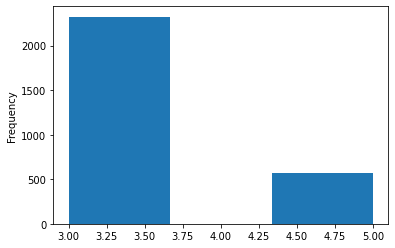

In [ ]:
ax = explore_2018['best_of'].plot.hist(bins=3, alpha=1)

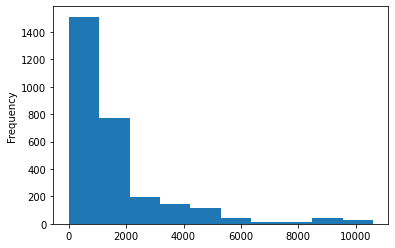

In [ ]:
ax = explore_2018['winner_rank_points'].plot.hist(alpha=1)

4. For supervised learning tasks, identify the target attribute(s).



The inputs of our algorithm would be:
surface, winner/loser_id, winner/loser_hand, winner/loser_age, winner/loser_rank, best_of

If we want to take player's stats in count, we would also include:
winner/loser_double_faults,winner/loser_breakpoints_saved,winner/loser_breakpoints_faced

5. Study the correlations between attributes.

In [ ]:
explore_2018.var().sort_values(axis=0, ascending=True)
# We can't identify useless parameters via analysing the variance

best_of                6.295059e-01
w_double_faults        5.657199e+00
l_double_faults        6.608654e+00
w_breakpoints_saved    8.831196e+00
l_breakpoints_saved    1.090347e+01
w_breakpoints_faced    1.538546e+01
l_breakpoints_faced    1.740282e+01
l_SvGms                1.884603e+01
w_SvGms                1.908673e+01
winner_age             2.187127e+01
loser_age              2.231129e+01
l_ace                  2.871256e+01
w_ace                  3.585368e+01
w_2ndWon               4.633811e+01
l_2ndWon               5.075803e+01
w_1stWon               1.992659e+02
l_1stWon               2.167623e+02
w_1stIn                3.691090e+02
l_1stIn                3.729316e+02
w_svpt                 8.645319e+02
l_svpt                 8.666047e+02
minutes                1.773642e+03
tourney_date           8.701866e+04
loser_rank_points      1.106245e+06
winner_rank_points     3.217612e+06
winner_id              2.381053e+08
loser_id               3.494889e+08
dtype: float64

7. Study how you would solve the problem manually.
8. Identify the promising transformations you may want to apply.
10. Document what you have learned.

#**Prepare the Data**

    1. Data cleaning:

• Fill in missing values (e.g., with zero, mean, median…) or drop their rows (or
columns).


In [ ]:
explore_2018_noNa = explore_2018.dropna(axis='index',how='any')

In [ ]:
print(explore_2018_noNa.isna().sum().sort_values(axis=0, ascending=True))

tourney_name           0
w_1stIn                0
w_1stWon               0
w_2ndWon               0
w_SvGms                0
w_breakpoints_saved    0
w_breakpoints_faced    0
l_ace                  0
l_double_faults        0
l_svpt                 0
l_1stIn                0
l_1stWon               0
l_2ndWon               0
l_SvGms                0
l_breakpoints_saved    0
l_breakpoints_faced    0
w_svpt                 0
w_double_faults        0
w_ace                  0
minutes                0
surface                0
tourney_level          0
tourney_date           0
winner_id              0
winner_name            0
winner_hand            0
winner_ioc             0
winner_rank_points     0
winner_age             0
loser_name             0
loser_hand             0
loser_ioc              0
loser_age              0
score                  0
best_of                0
round                  0
loser_id               0
loser_rank_points      0
dtype: int64


In [ ]:
print("Old data frame length:", len(explore_2018)) 
print("New data frame length:", len(explore_2018_noNa))  
print("Number of rows with at least 1 NA value: ", 
      (len(explore_2018)-len(explore_2018_noNa)))

Old data frame length: 2889
New data frame length: 2812
Number of rows with at least 1 NA value:  77


In [ ]:
print(explore_2018_noNa)

                    tourney_name surface  ... winner_rank_points  loser_rank_points
0                       Brisbane    Hard  ...             1010.0              909.0
1                       Brisbane    Hard  ...              890.0              593.0
2                       Brisbane    Hard  ...              809.0             1391.0
3                       Brisbane    Hard  ...              245.0             1055.0
4                       Brisbane    Hard  ...              299.0              755.0
...                          ...     ...  ...                ...                ...
2884                 Tour Finals    Hard  ...             8045.0             4310.0
2885                 Tour Finals    Hard  ...             5085.0             8045.0
2886  Davis Cup WG F: FRA vs CRO    Clay  ...             2480.0             1050.0
2887  Davis Cup WG F: FRA vs CRO    Clay  ...             4250.0              200.0
2888  Davis Cup WG F: FRA vs CRO    Clay  ...             4250.0            

    2. Fonction regrouping all the transformations done

In [ ]:
def clean_data(df):
  df.rename(columns = {'winner_ht':'winner_height','loser_ht':'loser_height','w_df':'w_double_faults','l_df':'l_double_faults','w_bpFaced':'w_breakpoints_faced',
                               'l_bpFaced':'l_breakpoints_faced','w_bpSaved':'w_breakpoints_saved','l_bpSaved':'l_breakpoints_saved'}, inplace = True) 
  df = df.drop(columns=['loser_height','winner_height'])
  df = df.dropna(axis='index',how='any')
  
  # winner
  df['winner_hand_nb'] = df['winner_hand'].apply(lambda x : 1 if x == 'R' else 2 if x =='L' else 3)

  #loser
  df['loser_hand_nb'] = df['loser_hand'].apply(lambda x : 1 if x == 'R' else 2 if x =='L' else 3)
  
  #indep
  df['surface_nb'] = df['surface'].apply(lambda x : 1 if x == 'Hard' else 2 if x == 'Clay' else 3)
  
  return df


    3. Fonctions creating the input data for our NN algorithm

In [ ]:
def Extract(lst, index): 
    return [item[index] for item in lst] 

In [ ]:
input_winner = ['winner_hand_nb','winner_age','winner_rank_points']
input_loser = ['loser_hand_nb','loser_age', 'loser_rank_points']
input_indep = ['best_of','surface_nb']
input_list = input_winner + input_indep + input_loser

import random
import numpy as np

def df_input_random(df):
  player1 =[]
  player2 = []
  indep = []
  winner = []

  for index, row in df.iterrows():
    
    if random.random() > 0.5:
      player1.append(row[input_winner].values.tolist())
      player2.append(row[input_loser].values.tolist())
      indep.append(row[input_indep].values.tolist())
      winner.append(0)
    else:
      player2.append(row[input_winner].values.tolist())
      player1.append(row[input_loser].values.tolist())
      indep.append(row[input_indep].values.tolist())
      winner.append(1)

  df_input_random = pd.DataFrame({'player1_hand': Extract(player1, 0),
                    'player1_age':Extract(player1, 1),
                    'player1_points':Extract(player1, 2),
                    'indep_best_of':Extract(indep, 0),
                    'indep_suface':Extract(indep, 1),
                    'player2_hand': Extract(player2, 0),
                    'player2_age':Extract(player2 ,1),
                    'player2_points':Extract(player2 ,2),
                      'winner': winner
                          })
  return df_input_random

    4. Call the functions above

In [ ]:
clean_2018 = clean_data(df_2018)
clean_2019 = clean_data(df_2019)

In [ ]:
input_random_2018 = df_input_random(clean_2018)
input_random_2019 = df_input_random(clean_2019)
input_random_2019

,player1_hand,player1_age,player1_points,indep_best_of,indep_suface,player2_hand,player2_age,player2_points,winner
0,1,25.653662,1010.0,3,1,1,30.633812,909.0,0
1,1,23.701574,593.0,3,1,1,21.229295,890.0,1
2,1,25.618070,1391.0,3,1,1,31.318275,809.0,1
3,1,28.021903,1055.0,3,1,1,18.872005,245.0,1
4,1,19.975359,299.0,3,1,2,27.241615,755.0,0
...,...,...,...,...,...,...,...,...,...
2807,1,31.477070,8045.0,3,1,1,32.487337,4310.0,0
2808,1,21.563313,5085.0,3,1,1,31.477070,8045.0,0
2809,1,22.012320,2480.0,3,2,1,31.767283,1050.0,0
2810,1,33.590691,200.0,3,2,1,30.140999,4250.0,1


### Dataset Preparation

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np

In [ ]:
def scaler(X):
  scaler = StandardScaler()
  X = scaler.fit_transform(X)
  return X

In [ ]:
def split_scaler_df(df):
  x_array = np.asarray(df.loc[:, df.columns != 'winner']).astype('float64')
  y_array = np.asarray(df['winner']).astype('float64')
  X_train, X_test, y_train, y_test = train_test_split(x_array, y_array, test_size=0.2, random_state=42)
  
  return scaler(X_train), scaler(X_test), y_train, y_test

#**Shortlist Promising Models**

1. Train many models from different categories (e.g., linear, naive Bayes, SVM, Random Forest, neural net, etc.) using standard parameters. 

In our example, we will test two models: Logistic Regression and a Deep-Feed-Foward Neural Network.


## Logistic Regression

Display the correlation matrix for the output winner without training

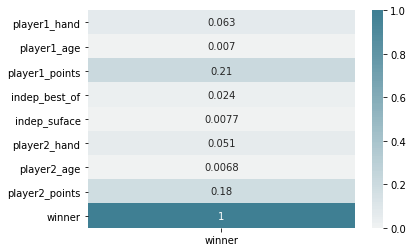

In [ ]:
import seaborn as sns
corrMatrix = input_random_2018.corr().abs()

x = corrMatrix[['winner']]
ax = sns.heatmap(
    x, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(40, 220, n=200),
    annot=True
)

In [ ]:
X_train_2018, X_test_2018, y_train_2018, y_test_2018 = split_scaler_df(input_random_2018)

**Fit the model**

In [ ]:
# import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
logreg = LogisticRegression()

# fit the model with data
logreg.fit(X_train_2018,y_train_2018)

#
y_pred_2018=logreg.predict(X_test_2018)

**Confusion metrix**

In [ ]:
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test_2018, y_pred_2018)
cnf_matrix


array([[195,  85],
       [121, 162]])

Text(0.5, 257.44, 'Predicted label')

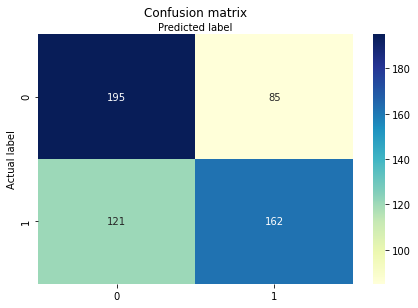

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

class_names=[1,2] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

**Accuracy / Precision / Recall**

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test_2018, y_pred_2018))
print("Precision:",metrics.precision_score(y_test_2018, y_pred_2018))
print("Recall:",metrics.recall_score(y_test_2018, y_pred_2018))

metric_regression_linear2018 = metrics.accuracy_score(y_test_2018, y_pred_2018)

Accuracy: 0.6341030195381883
Precision: 0.6558704453441295
Recall: 0.5724381625441696


**Display the coefficient of each input parameter**


In [ ]:
features_kept = pd.DataFrame(input_random_2019.loc[:, input_random_2019.columns != 'winner'].columns,columns=["features"])
coef = logreg.coef_
coef = np.squeeze(coef)

features_kept['ranking'] = coef
features_kept.sort_values('ranking', inplace=True)
print(features_kept)

         features   ranking
2  player1_points -0.659041
5    player2_hand -0.097510
6     player2_age -0.089038
4    indep_suface  0.022868
3   indep_best_of  0.033222
1     player1_age  0.046948
0    player1_hand  0.112718
7  player2_points  0.589456


**Test avec dataset 2019**

In [ ]:
input_random_2019
x_array_2019 = np.asarray(input_random_2019.loc[:, input_random_2019.columns != 'winner']).astype('float64')
y_array_2019 = np.asarray(input_random_2019.loc[:, input_random_2019.columns == 'winner']).astype('float64')

In [ ]:
X_array_scaler_2019 = scaler(x_array_2019)

In [ ]:
y_pred_2019 = logreg.predict(X_array_scaler_2019)

from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_array_2019 , y_pred_2019)
cnf_matrix

array([[974, 426],
       [607, 805]])

Text(0.5, 257.44, 'Predicted label')

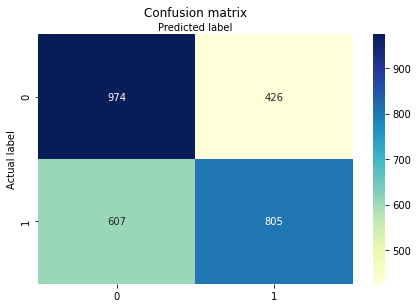

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

class_names=[1,2] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_array_2019 , y_pred_2019))
print("Precision:",metrics.precision_score(y_array_2019 , y_pred_2019))
print("Recall:",metrics.recall_score(y_array_2019 , y_pred_2019))

metric_regression_linear2019 = metrics.accuracy_score(y_array_2019 , y_pred_2019)

Accuracy: 0.6326458036984353
Precision: 0.6539398862713242
Recall: 0.5701133144475921


## Multi-Layer Perceptron

### Model NN

#### NN 2018

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
model  = keras.models.Sequential()

In [ ]:
round(X_train_2018.shape[1]/2)

4

In [ ]:
model = keras.models.Sequential(
    [keras.layers.Dense(round(X_train_2018.shape[1]/2), activation="relu",input_shape=X_train_2018.shape[1:]),
     keras.layers.Dense(round(X_train_2018.shape[1]/4), activation="relu"),
     keras.layers.Dense(1, activation="sigmoid")]
)

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4)                 36        
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 10        
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 3         
Total params: 49
Trainable params: 49
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.layers
hidden1=model.layers[1]

In [ ]:
class MyCallback(keras.callbacks.Callback):
  def on_epoch_end(self, batch, logs):
    network_structure = np.hstack(([X_train_2018.shape[1]], [layer.output_shape[1] for layer in model.layers]))
    weights_list=[model.get_weights()[i] for i in [0,2,4]]
    network = DrawNN(neural_network=network_structure, weights_list=weights_list)
    network.draw(save_bool = False)

callback = MyCallback()

In [ ]:
# random initialized weights before training
hidden1.get_weights()

[array([[ 0.8135898 ,  0.21825624],
        [-0.929353  ,  0.54116964],
        [ 0.02749181,  0.35646296],
        [ 0.71661496,  0.6982572 ]], dtype=float32),
 array([0., 0.], dtype=float32)]

In [ ]:
model.compile(
    loss="binary_crossentropy",
    optimizer=keras.optimizers.Adam(1e-3),
    metrics=["accuracy"]
)

Epoch 1/200
43/71 [=================>............] - ETA: 0s - loss: 0.7380 - accuracy: 0.4833

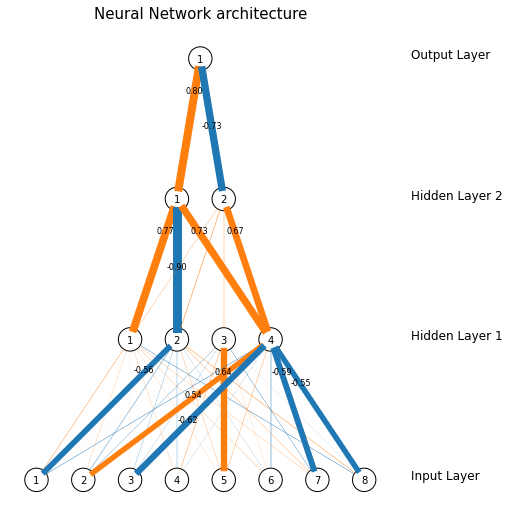

71/71 [==============================] - 0s 7ms/step - loss: 0.7399 - accuracy: 0.4727 - val_loss: 0.7252 - val_accuracy: 0.4725
Epoch 2/200
45/71 [==================>...........] - ETA: 0s - loss: 0.7223 - accuracy: 0.4722

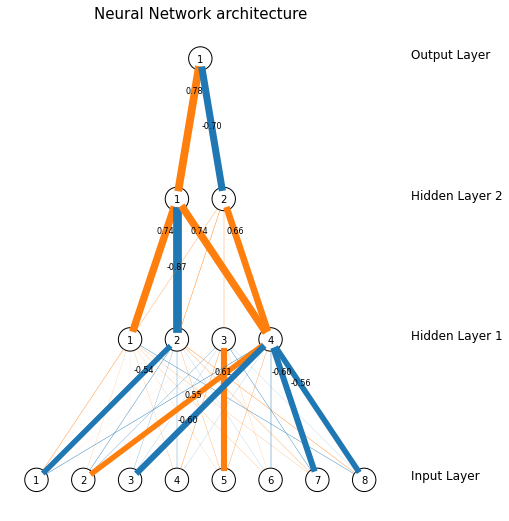

71/71 [==============================] - 0s 5ms/step - loss: 0.7204 - accuracy: 0.4762 - val_loss: 0.7131 - val_accuracy: 0.4831
Epoch 3/200
31/71 [============>.................] - ETA: 0s - loss: 0.7058 - accuracy: 0.4929

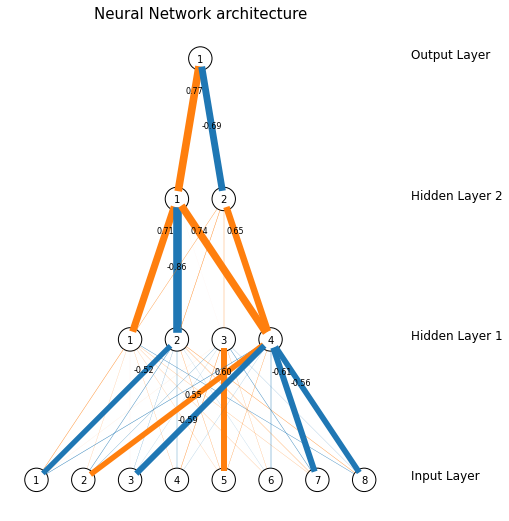

71/71 [==============================] - 0s 5ms/step - loss: 0.7100 - accuracy: 0.4784 - val_loss: 0.7068 - val_accuracy: 0.4796
Epoch 4/200
46/71 [==================>...........] - ETA: 0s - loss: 0.7019 - accuracy: 0.4986

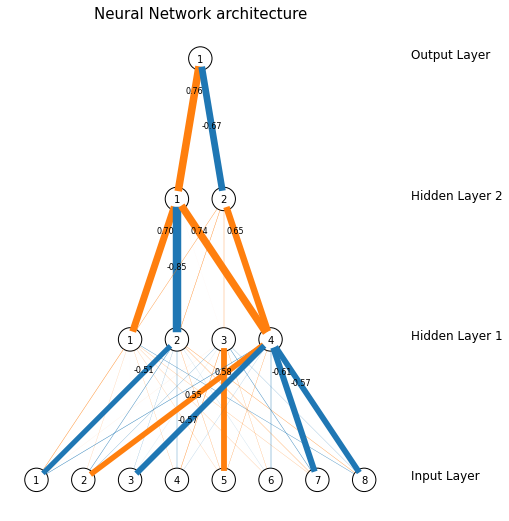

71/71 [==============================] - 0s 6ms/step - loss: 0.7033 - accuracy: 0.4967 - val_loss: 0.7024 - val_accuracy: 0.4813
Epoch 5/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6984 - accuracy: 0.5102

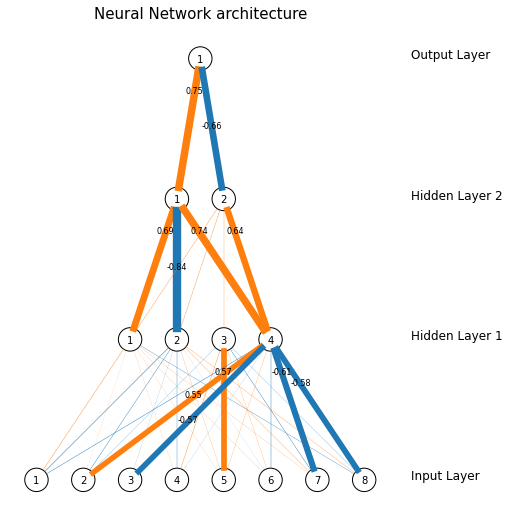

71/71 [==============================] - 0s 4ms/step - loss: 0.6990 - accuracy: 0.5064 - val_loss: 0.6992 - val_accuracy: 0.4973
Epoch 6/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6959 - accuracy: 0.5171

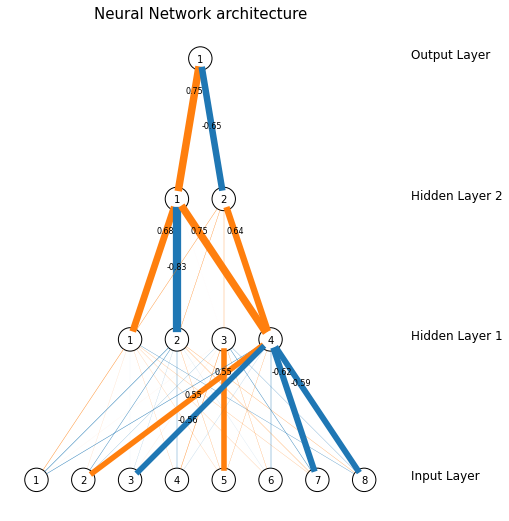

71/71 [==============================] - 0s 4ms/step - loss: 0.6959 - accuracy: 0.5216 - val_loss: 0.6968 - val_accuracy: 0.5027
Epoch 7/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6947 - accuracy: 0.5150

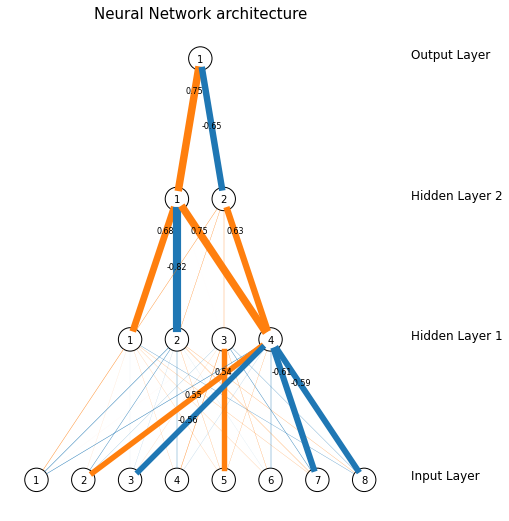

71/71 [==============================] - 0s 4ms/step - loss: 0.6936 - accuracy: 0.5260 - val_loss: 0.6948 - val_accuracy: 0.5115
Epoch 8/200
38/71 [===============>..............] - ETA: 0s - loss: 0.6944 - accuracy: 0.5255

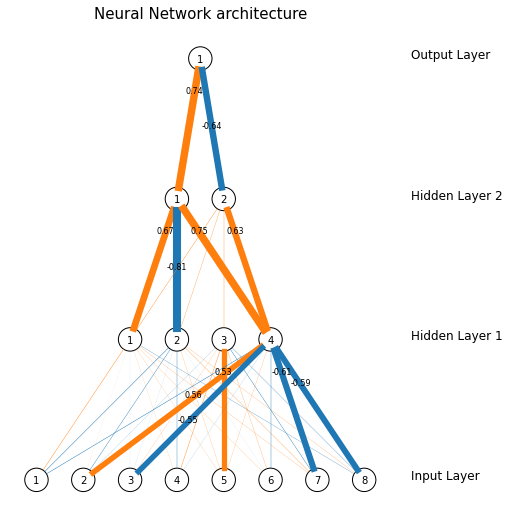

71/71 [==============================] - 0s 5ms/step - loss: 0.6916 - accuracy: 0.5305 - val_loss: 0.6931 - val_accuracy: 0.5222
Epoch 9/200
43/71 [=================>............] - ETA: 0s - loss: 0.6926 - accuracy: 0.5276

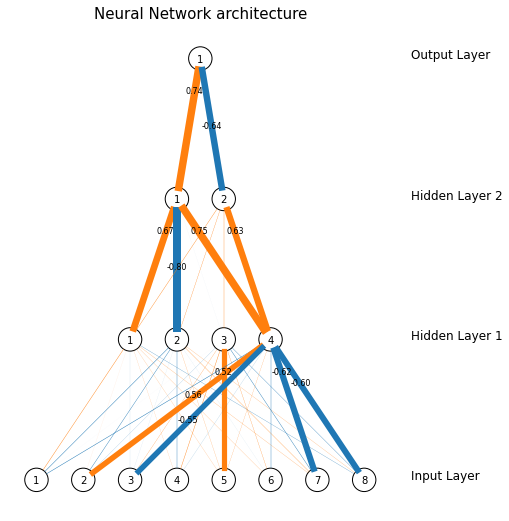

71/71 [==============================] - 0s 4ms/step - loss: 0.6895 - accuracy: 0.5411 - val_loss: 0.6915 - val_accuracy: 0.5240
Epoch 10/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6884 - accuracy: 0.5324

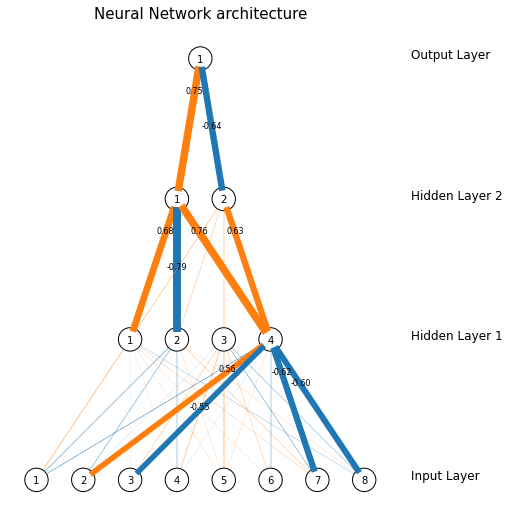

71/71 [==============================] - 0s 4ms/step - loss: 0.6873 - accuracy: 0.5447 - val_loss: 0.6899 - val_accuracy: 0.5275
Epoch 11/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6859 - accuracy: 0.5530

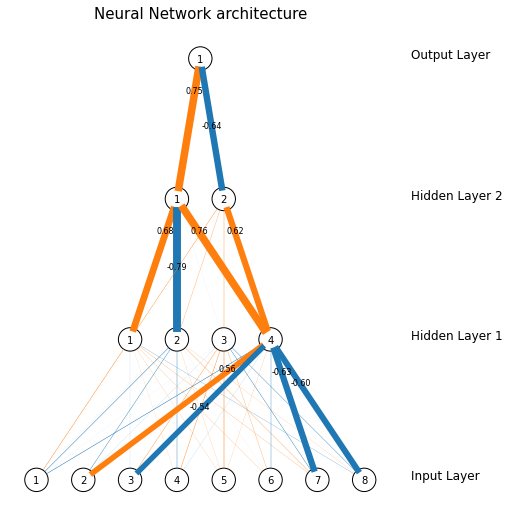

71/71 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.5549 - val_loss: 0.6882 - val_accuracy: 0.5275
Epoch 12/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6824 - accuracy: 0.5651

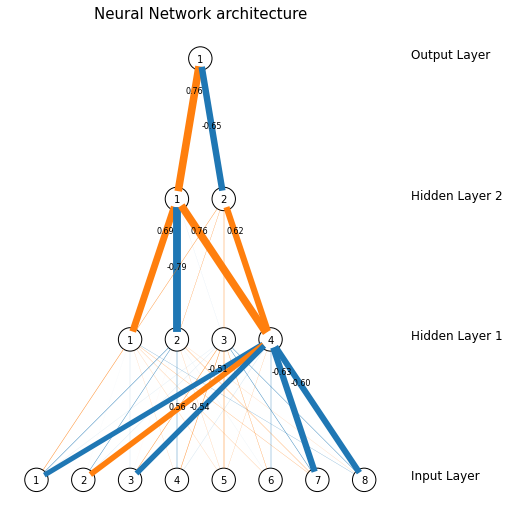

71/71 [==============================] - 0s 4ms/step - loss: 0.6828 - accuracy: 0.5585 - val_loss: 0.6861 - val_accuracy: 0.5382
Epoch 13/200
39/71 [===============>..............] - ETA: 0s - loss: 0.6820 - accuracy: 0.5521

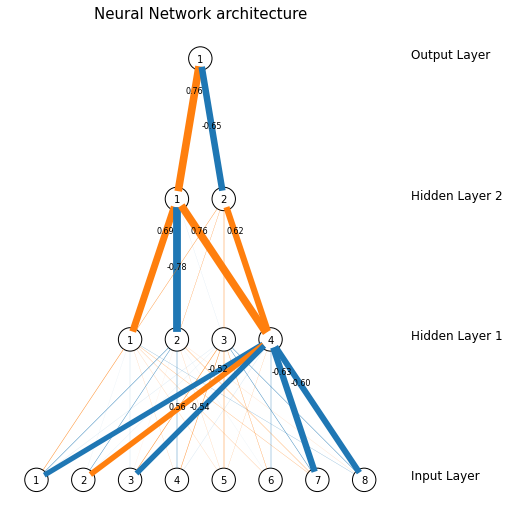

71/71 [==============================] - 0s 5ms/step - loss: 0.6802 - accuracy: 0.5700 - val_loss: 0.6842 - val_accuracy: 0.5400
Epoch 14/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6767 - accuracy: 0.5835

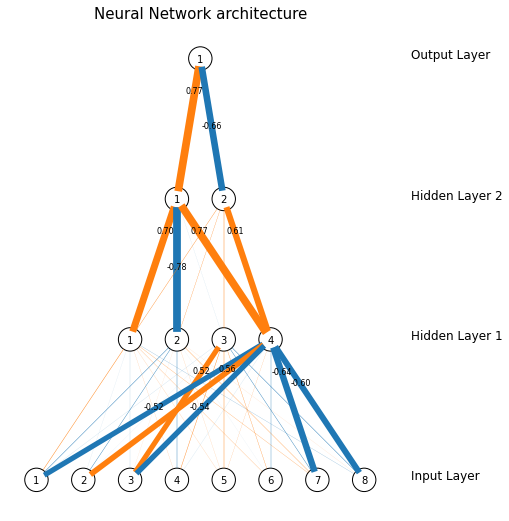

71/71 [==============================] - 1s 8ms/step - loss: 0.6774 - accuracy: 0.5811 - val_loss: 0.6816 - val_accuracy: 0.5346
Epoch 15/200
44/71 [=================>............] - ETA: 0s - loss: 0.6744 - accuracy: 0.5710

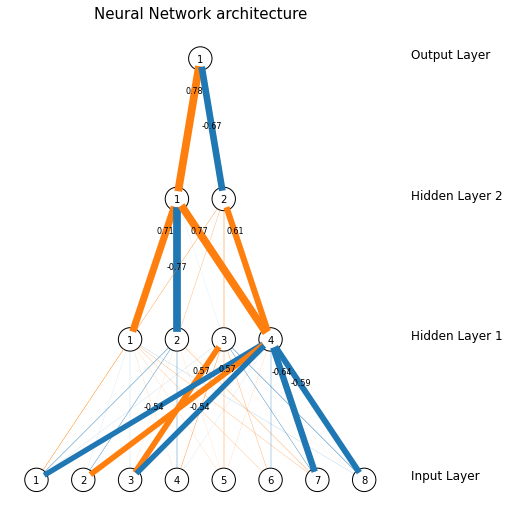

71/71 [==============================] - 0s 4ms/step - loss: 0.6747 - accuracy: 0.5740 - val_loss: 0.6792 - val_accuracy: 0.5400
Epoch 16/200
51/71 [====================>.........] - ETA: 0s - loss: 0.6735 - accuracy: 0.5778

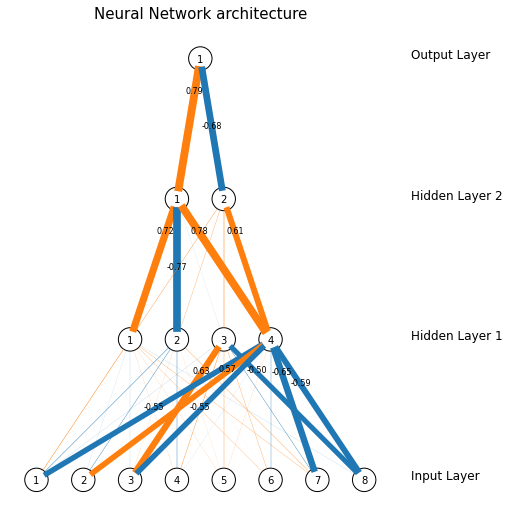

71/71 [==============================] - 0s 4ms/step - loss: 0.6715 - accuracy: 0.5865 - val_loss: 0.6764 - val_accuracy: 0.5631
Epoch 17/200
51/71 [====================>.........] - ETA: 0s - loss: 0.6688 - accuracy: 0.5919

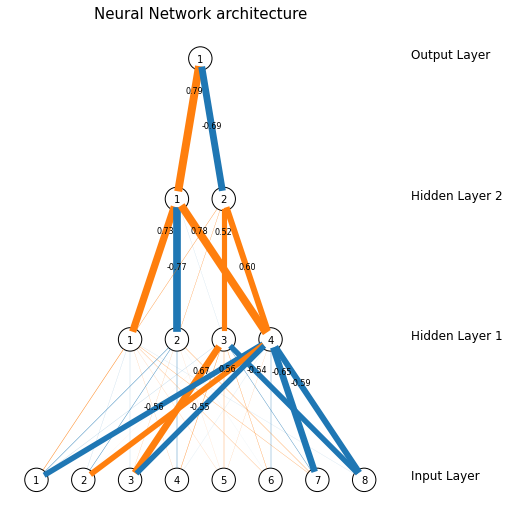

71/71 [==============================] - 0s 5ms/step - loss: 0.6686 - accuracy: 0.5869 - val_loss: 0.6741 - val_accuracy: 0.5577
Epoch 18/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6660 - accuracy: 0.5931

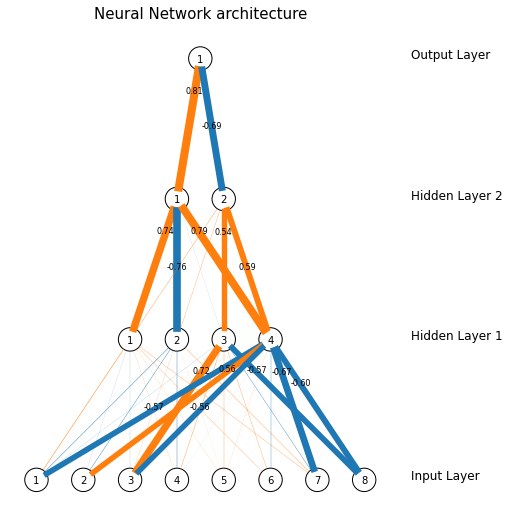

71/71 [==============================] - 0s 4ms/step - loss: 0.6659 - accuracy: 0.5949 - val_loss: 0.6716 - val_accuracy: 0.5542
Epoch 19/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6612 - accuracy: 0.6174

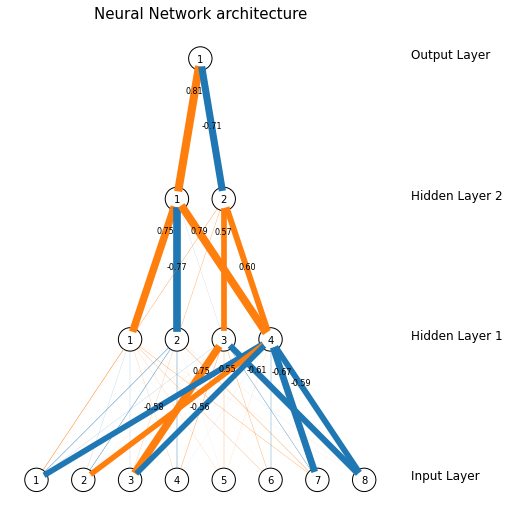

71/71 [==============================] - 0s 4ms/step - loss: 0.6625 - accuracy: 0.6074 - val_loss: 0.6688 - val_accuracy: 0.5613
Epoch 20/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6583 - accuracy: 0.6016

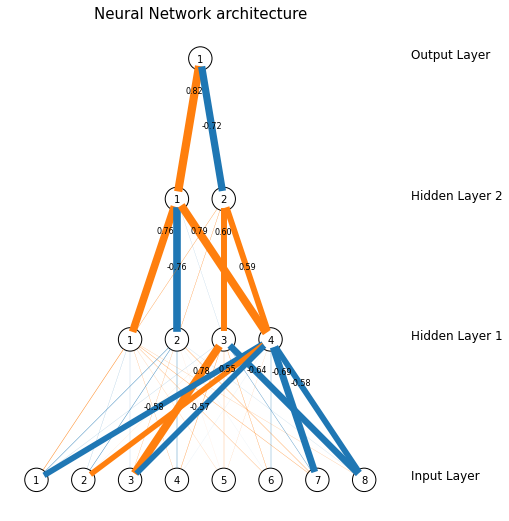

71/71 [==============================] - 0s 4ms/step - loss: 0.6585 - accuracy: 0.6060 - val_loss: 0.6649 - val_accuracy: 0.5702
Epoch 21/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6533 - accuracy: 0.6102

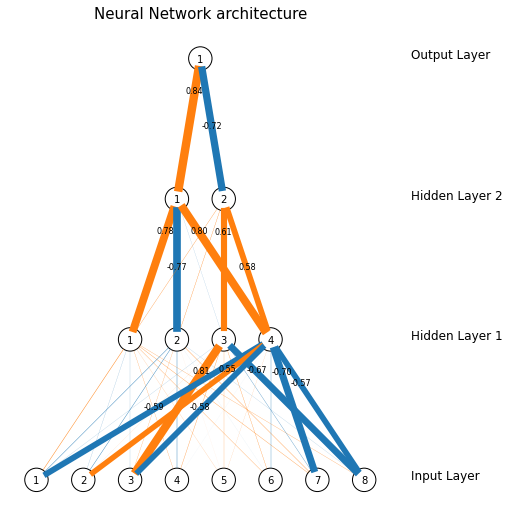

71/71 [==============================] - 0s 4ms/step - loss: 0.6538 - accuracy: 0.6105 - val_loss: 0.6600 - val_accuracy: 0.5719
Epoch 22/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6508 - accuracy: 0.6073

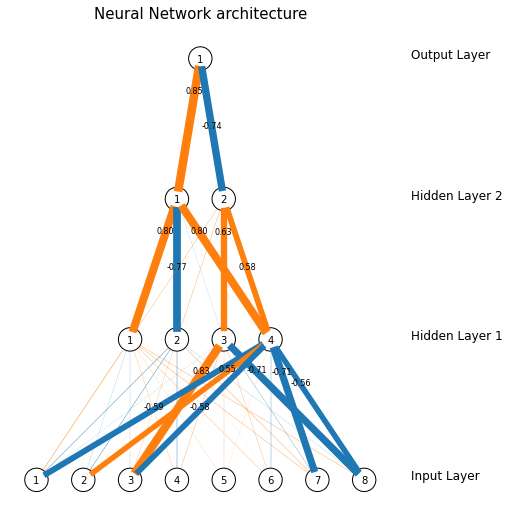

71/71 [==============================] - 0s 5ms/step - loss: 0.6494 - accuracy: 0.6132 - val_loss: 0.6570 - val_accuracy: 0.5737
Epoch 23/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6474 - accuracy: 0.6140

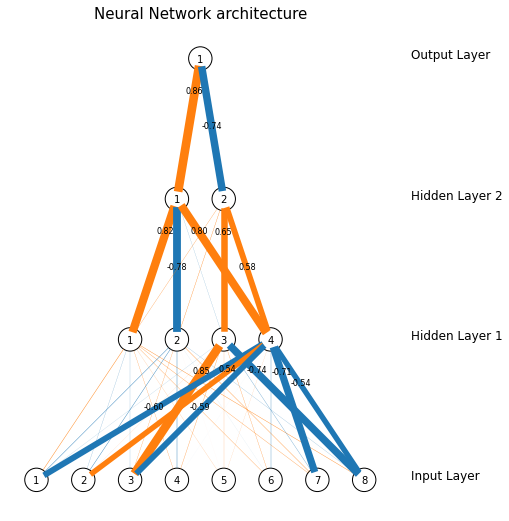

71/71 [==============================] - 0s 4ms/step - loss: 0.6456 - accuracy: 0.6158 - val_loss: 0.6545 - val_accuracy: 0.5719
Epoch 24/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6411 - accuracy: 0.6175

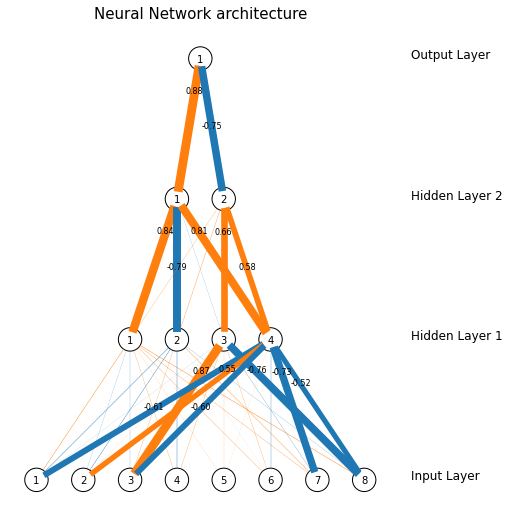

71/71 [==============================] - 1s 8ms/step - loss: 0.6420 - accuracy: 0.6198 - val_loss: 0.6519 - val_accuracy: 0.5737
Epoch 25/200
50/71 [====================>.........] - ETA: 0s - loss: 0.6370 - accuracy: 0.6288

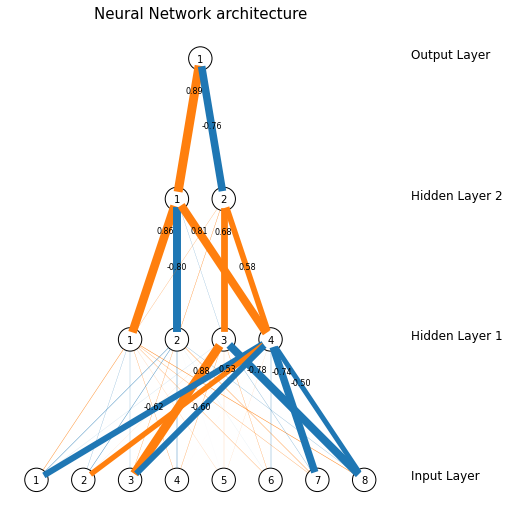

71/71 [==============================] - 0s 4ms/step - loss: 0.6390 - accuracy: 0.6261 - val_loss: 0.6504 - val_accuracy: 0.5773
Epoch 26/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6348 - accuracy: 0.6243

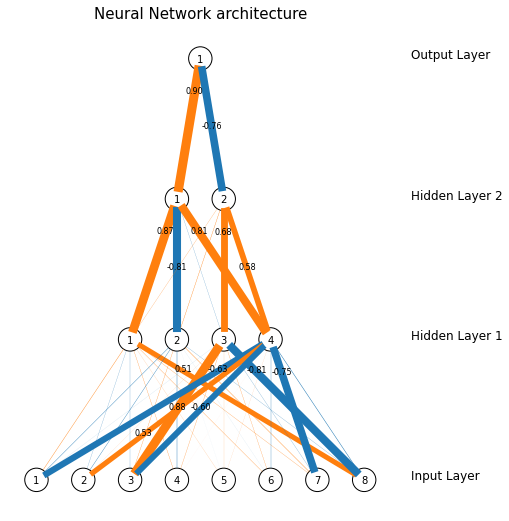

71/71 [==============================] - 0s 4ms/step - loss: 0.6364 - accuracy: 0.6265 - val_loss: 0.6492 - val_accuracy: 0.5844
Epoch 27/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6365 - accuracy: 0.6243

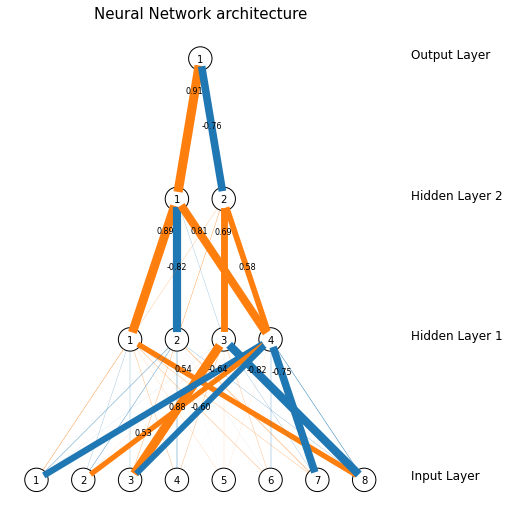

71/71 [==============================] - 0s 4ms/step - loss: 0.6344 - accuracy: 0.6296 - val_loss: 0.6481 - val_accuracy: 0.5933
Epoch 28/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6316 - accuracy: 0.6343

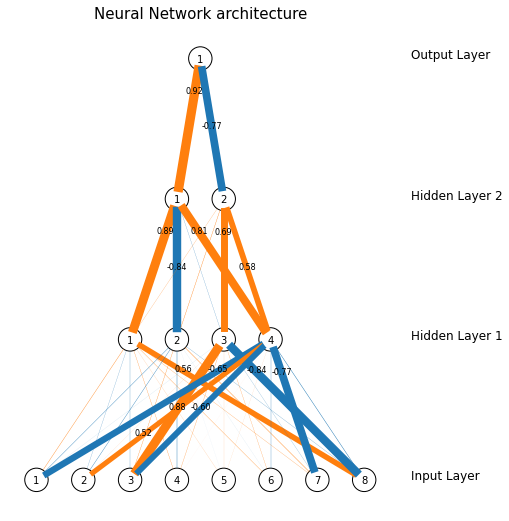

71/71 [==============================] - 0s 4ms/step - loss: 0.6330 - accuracy: 0.6345 - val_loss: 0.6476 - val_accuracy: 0.5986
Epoch 29/200
50/71 [====================>.........] - ETA: 0s - loss: 0.6283 - accuracy: 0.6400

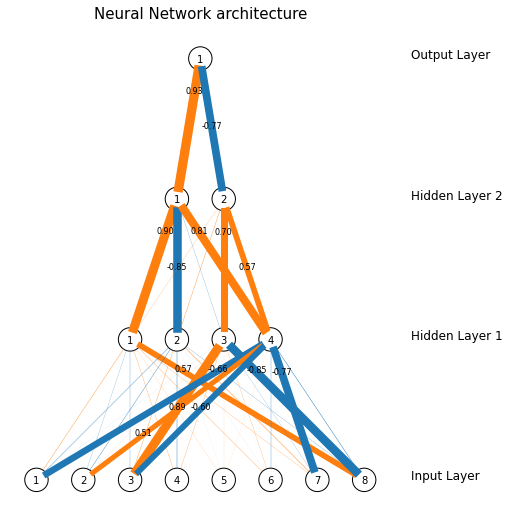

71/71 [==============================] - 0s 4ms/step - loss: 0.6322 - accuracy: 0.6354 - val_loss: 0.6472 - val_accuracy: 0.5968
Epoch 30/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6272 - accuracy: 0.6333

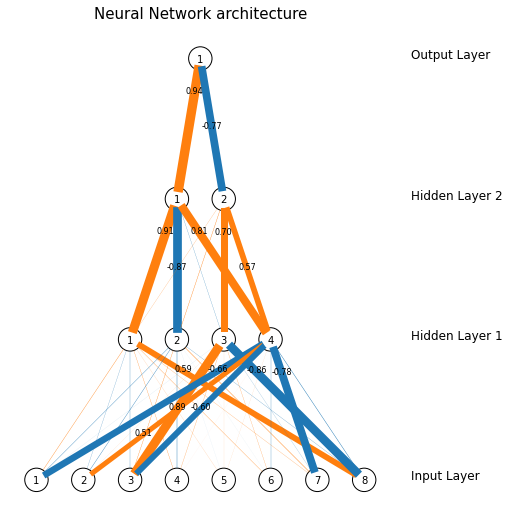

71/71 [==============================] - 0s 4ms/step - loss: 0.6310 - accuracy: 0.6336 - val_loss: 0.6467 - val_accuracy: 0.6075
Epoch 31/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6270 - accuracy: 0.6390

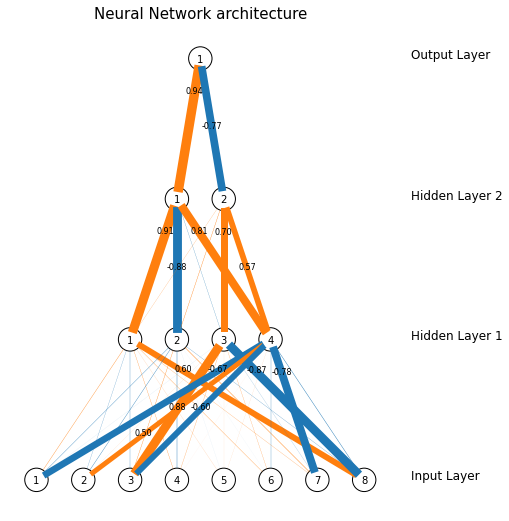

71/71 [==============================] - 0s 4ms/step - loss: 0.6304 - accuracy: 0.6318 - val_loss: 0.6462 - val_accuracy: 0.6039
Epoch 32/200
39/71 [===============>..............] - ETA: 0s - loss: 0.6291 - accuracy: 0.6370

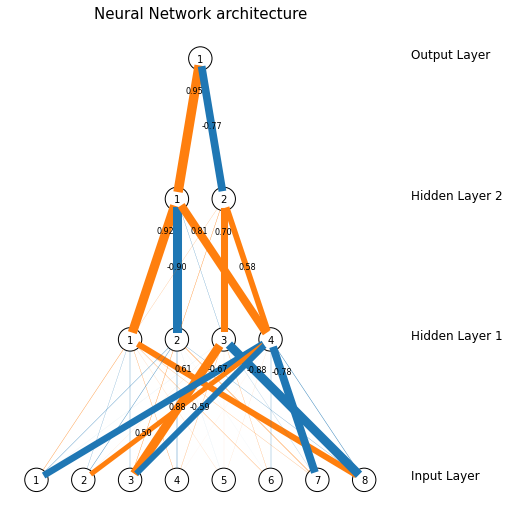

71/71 [==============================] - 0s 4ms/step - loss: 0.6300 - accuracy: 0.6323 - val_loss: 0.6457 - val_accuracy: 0.6057
Epoch 33/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6282 - accuracy: 0.6364

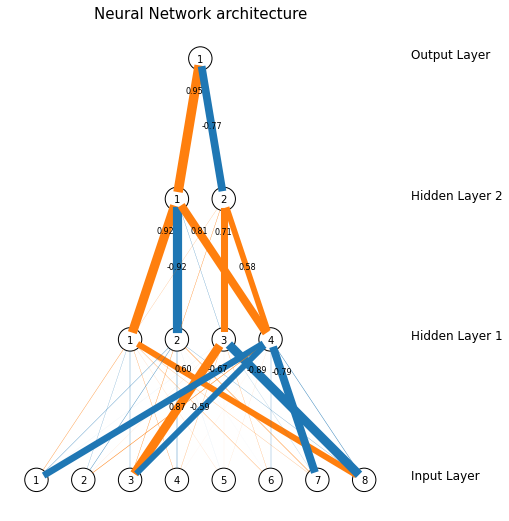

71/71 [==============================] - 0s 4ms/step - loss: 0.6293 - accuracy: 0.6363 - val_loss: 0.6453 - val_accuracy: 0.6092
Epoch 34/200
39/71 [===============>..............] - ETA: 0s - loss: 0.6293 - accuracy: 0.6330

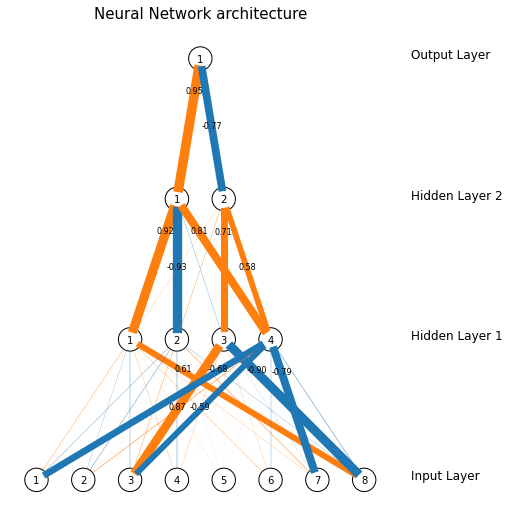

71/71 [==============================] - 1s 9ms/step - loss: 0.6290 - accuracy: 0.6327 - val_loss: 0.6448 - val_accuracy: 0.6128
Epoch 35/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6314 - accuracy: 0.6368

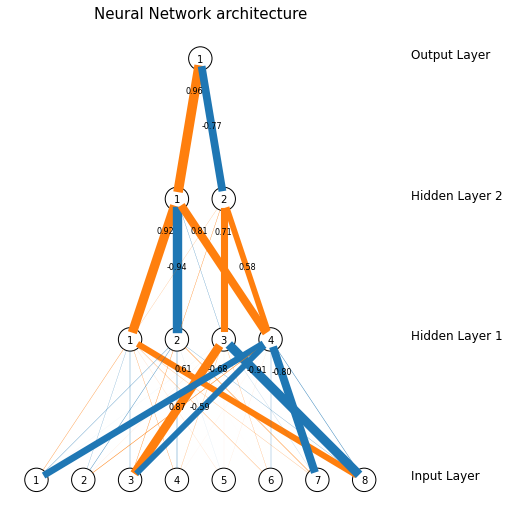

71/71 [==============================] - 0s 4ms/step - loss: 0.6283 - accuracy: 0.6345 - val_loss: 0.6444 - val_accuracy: 0.6092
Epoch 36/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6300 - accuracy: 0.6377

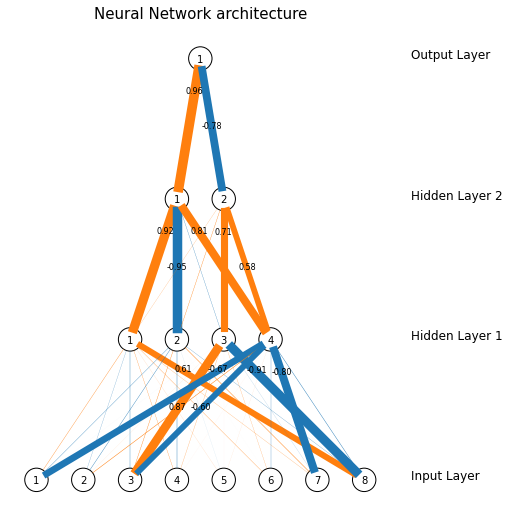

71/71 [==============================] - 0s 4ms/step - loss: 0.6281 - accuracy: 0.6376 - val_loss: 0.6441 - val_accuracy: 0.6181
Epoch 37/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6275 - accuracy: 0.6373

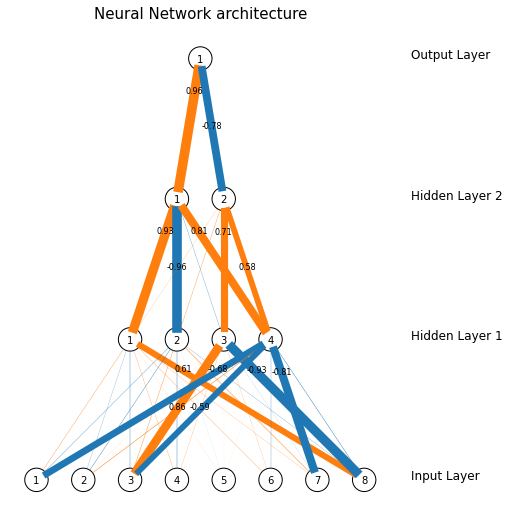

71/71 [==============================] - 0s 4ms/step - loss: 0.6278 - accuracy: 0.6358 - val_loss: 0.6440 - val_accuracy: 0.6146
Epoch 38/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6263 - accuracy: 0.6424

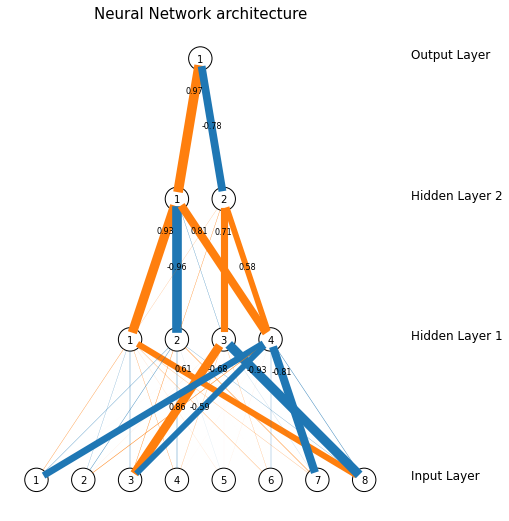

71/71 [==============================] - 0s 4ms/step - loss: 0.6277 - accuracy: 0.6358 - val_loss: 0.6439 - val_accuracy: 0.6092
Epoch 39/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6272 - accuracy: 0.6368

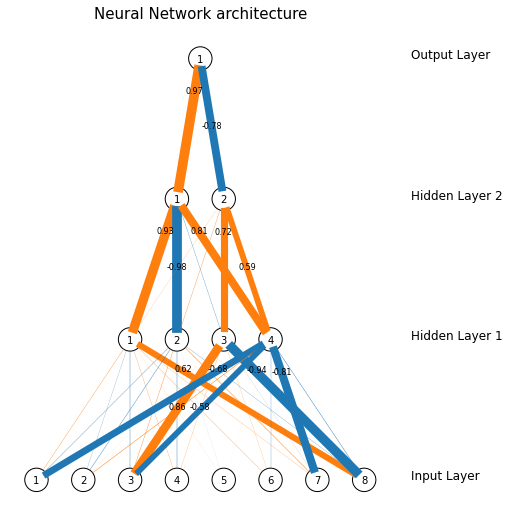

71/71 [==============================] - 0s 4ms/step - loss: 0.6273 - accuracy: 0.6367 - val_loss: 0.6437 - val_accuracy: 0.6181
Epoch 40/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6274 - accuracy: 0.6366

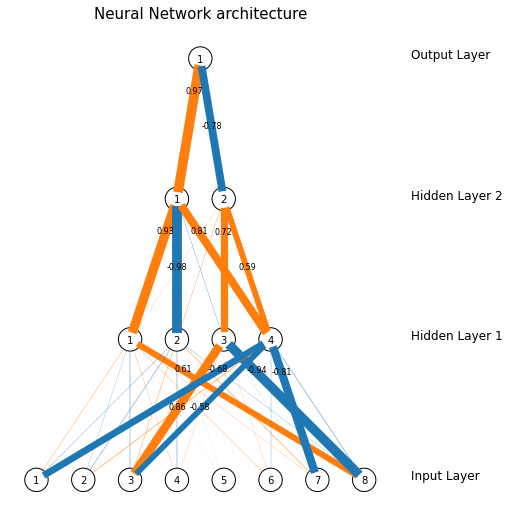

71/71 [==============================] - 0s 4ms/step - loss: 0.6270 - accuracy: 0.6376 - val_loss: 0.6435 - val_accuracy: 0.6181
Epoch 41/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6213 - accuracy: 0.6450

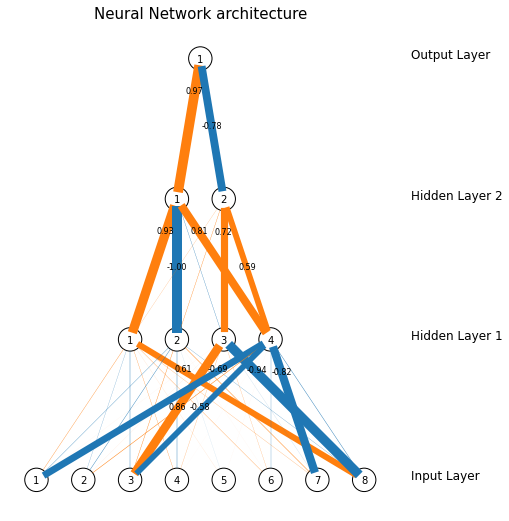

71/71 [==============================] - 0s 4ms/step - loss: 0.6269 - accuracy: 0.6398 - val_loss: 0.6436 - val_accuracy: 0.6163
Epoch 42/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6273 - accuracy: 0.6369

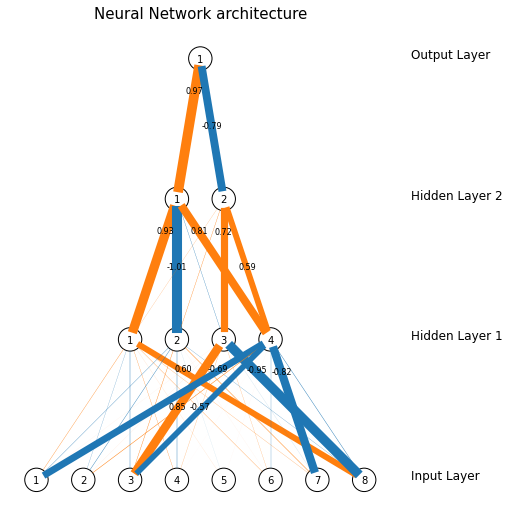

71/71 [==============================] - 0s 4ms/step - loss: 0.6270 - accuracy: 0.6354 - val_loss: 0.6436 - val_accuracy: 0.6146
Epoch 43/200
37/71 [==============>...............] - ETA: 0s - loss: 0.6250 - accuracy: 0.6284

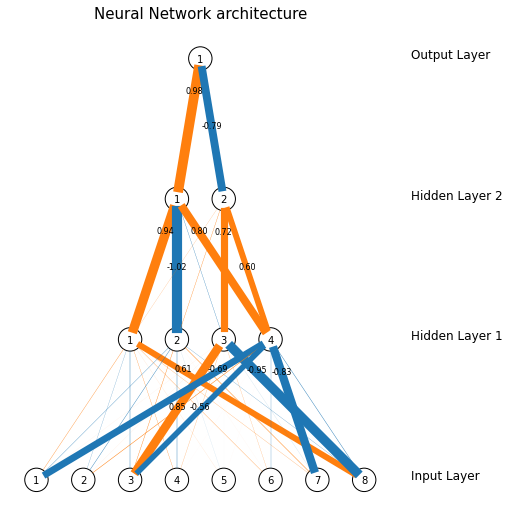

71/71 [==============================] - 0s 4ms/step - loss: 0.6267 - accuracy: 0.6394 - val_loss: 0.6432 - val_accuracy: 0.6181
Epoch 44/200
58/71 [=======================>......] - ETA: 0s - loss: 0.6216 - accuracy: 0.6471

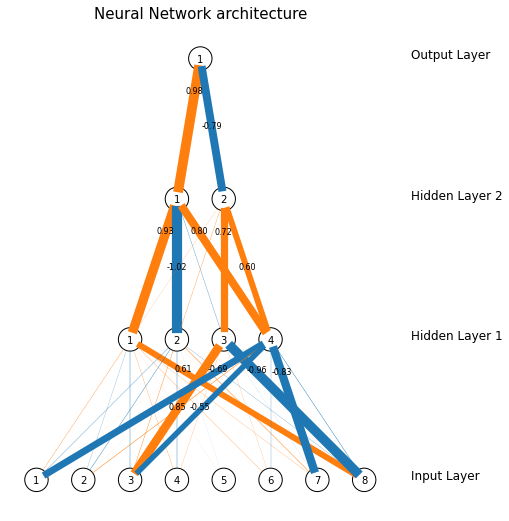

71/71 [==============================] - 1s 8ms/step - loss: 0.6266 - accuracy: 0.6358 - val_loss: 0.6436 - val_accuracy: 0.6181
Epoch 45/200
37/71 [==============>...............] - ETA: 0s - loss: 0.6386 - accuracy: 0.6318

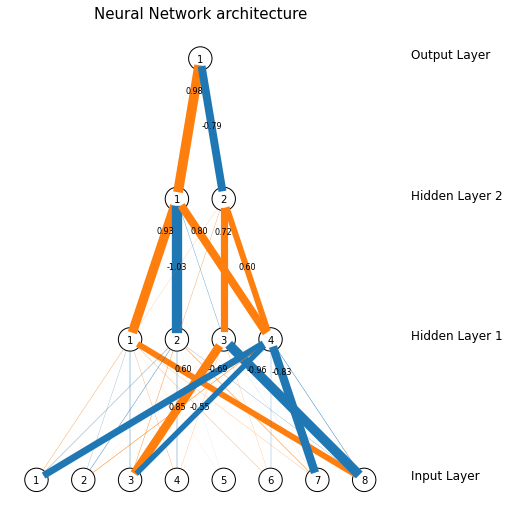

71/71 [==============================] - 0s 4ms/step - loss: 0.6264 - accuracy: 0.6403 - val_loss: 0.6429 - val_accuracy: 0.6163
Epoch 46/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6258 - accuracy: 0.6417

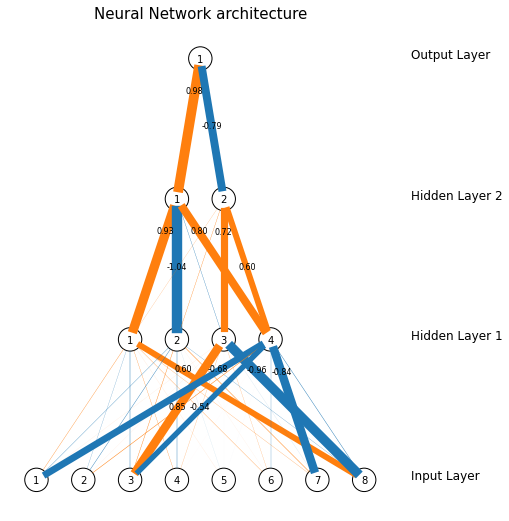

71/71 [==============================] - 0s 5ms/step - loss: 0.6262 - accuracy: 0.6390 - val_loss: 0.6427 - val_accuracy: 0.6181
Epoch 47/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6211 - accuracy: 0.6443

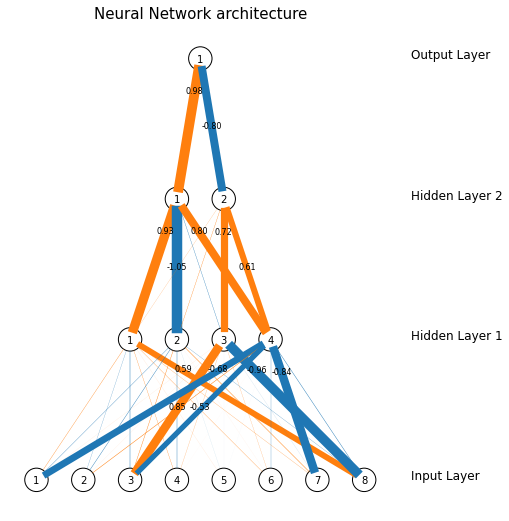

71/71 [==============================] - 0s 4ms/step - loss: 0.6260 - accuracy: 0.6376 - val_loss: 0.6425 - val_accuracy: 0.6217
Epoch 48/200
39/71 [===============>..............] - ETA: 0s - loss: 0.6276 - accuracy: 0.6370

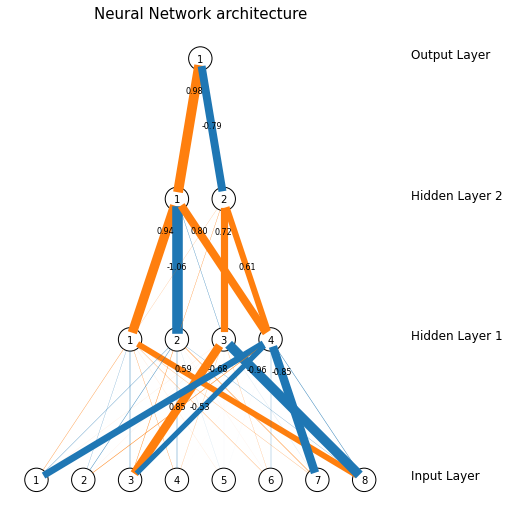

71/71 [==============================] - 0s 5ms/step - loss: 0.6261 - accuracy: 0.6416 - val_loss: 0.6421 - val_accuracy: 0.6217
Epoch 49/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6230 - accuracy: 0.6406

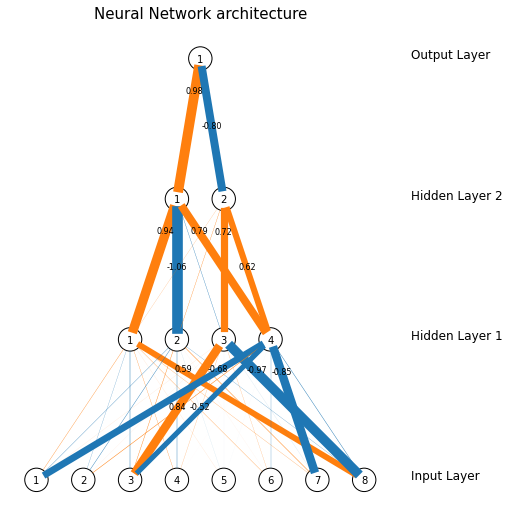

71/71 [==============================] - 0s 5ms/step - loss: 0.6260 - accuracy: 0.6376 - val_loss: 0.6425 - val_accuracy: 0.6163
Epoch 50/200
43/71 [=================>............] - ETA: 0s - loss: 0.6244 - accuracy: 0.6403

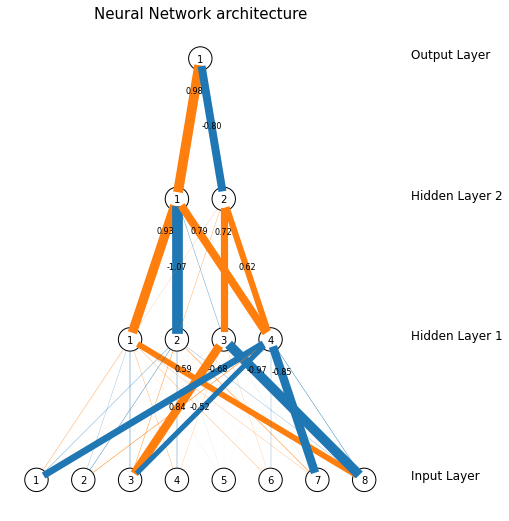

71/71 [==============================] - 0s 5ms/step - loss: 0.6257 - accuracy: 0.6398 - val_loss: 0.6422 - val_accuracy: 0.6181
Epoch 51/200
31/71 [============>.................] - ETA: 0s - loss: 0.6340 - accuracy: 0.6270

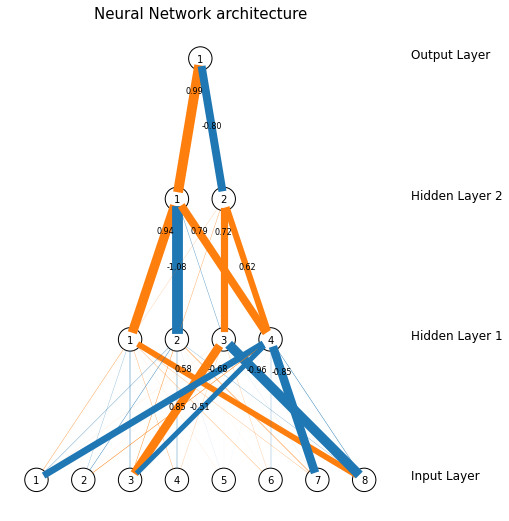

71/71 [==============================] - 0s 5ms/step - loss: 0.6257 - accuracy: 0.6381 - val_loss: 0.6417 - val_accuracy: 0.6181
Epoch 52/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6234 - accuracy: 0.6486

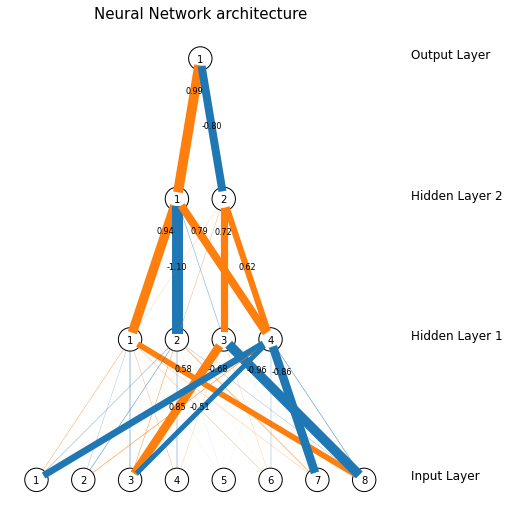

71/71 [==============================] - 0s 5ms/step - loss: 0.6257 - accuracy: 0.6425 - val_loss: 0.6416 - val_accuracy: 0.6163
Epoch 53/200
50/71 [====================>.........] - ETA: 0s - loss: 0.6211 - accuracy: 0.6350

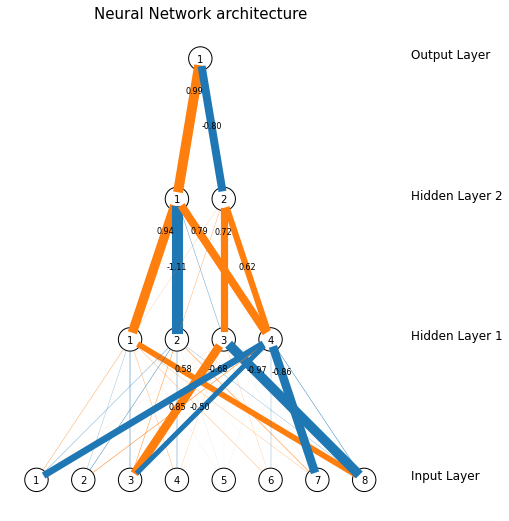

71/71 [==============================] - 0s 5ms/step - loss: 0.6256 - accuracy: 0.6381 - val_loss: 0.6412 - val_accuracy: 0.6199
Epoch 54/200
40/71 [===============>..............] - ETA: 0s - loss: 0.6318 - accuracy: 0.6320

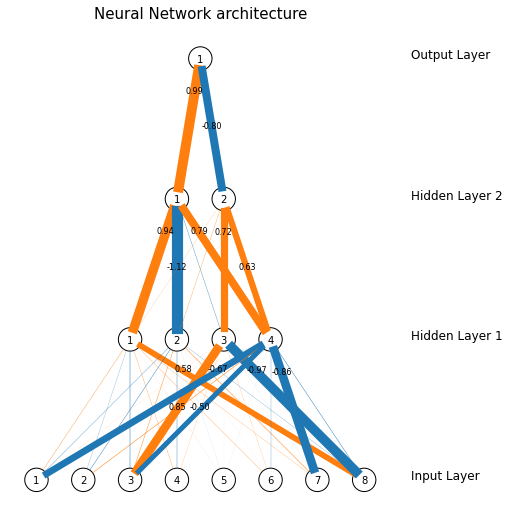

71/71 [==============================] - 1s 7ms/step - loss: 0.6254 - accuracy: 0.6452 - val_loss: 0.6412 - val_accuracy: 0.6181
Epoch 55/200
36/71 [==============>...............] - ETA: 0s - loss: 0.6210 - accuracy: 0.6502

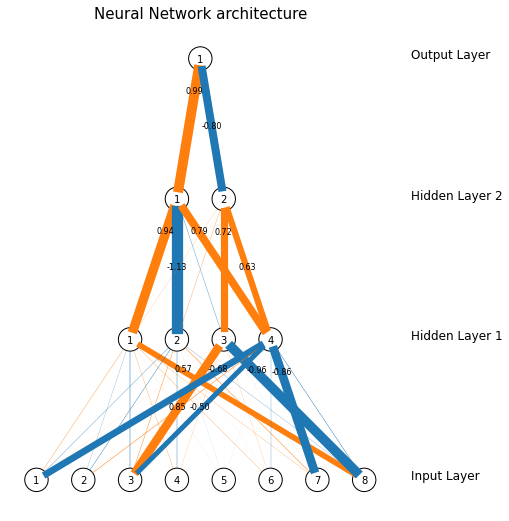

71/71 [==============================] - 0s 5ms/step - loss: 0.6253 - accuracy: 0.6430 - val_loss: 0.6411 - val_accuracy: 0.6163
Epoch 56/200
41/71 [================>.............] - ETA: 0s - loss: 0.6228 - accuracy: 0.6486

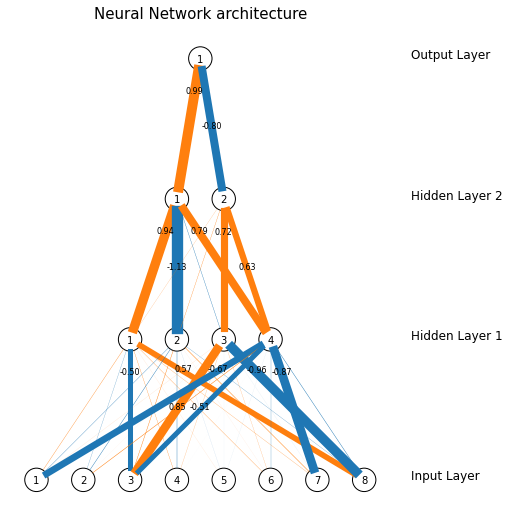

71/71 [==============================] - 0s 5ms/step - loss: 0.6253 - accuracy: 0.6434 - val_loss: 0.6412 - val_accuracy: 0.6181
Epoch 57/200
40/71 [===============>..............] - ETA: 0s - loss: 0.6269 - accuracy: 0.6398

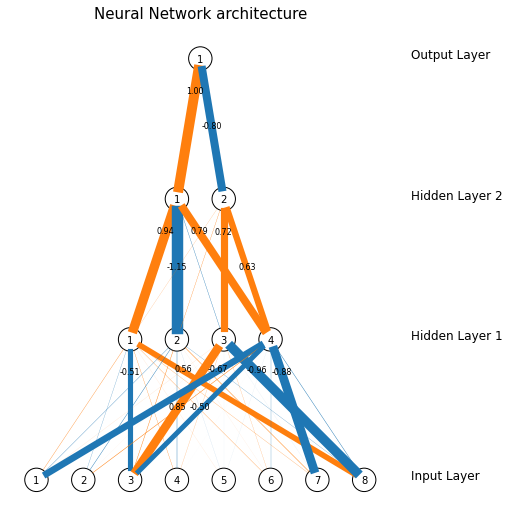

71/71 [==============================] - 0s 5ms/step - loss: 0.6252 - accuracy: 0.6394 - val_loss: 0.6409 - val_accuracy: 0.6146
Epoch 58/200
37/71 [==============>...............] - ETA: 0s - loss: 0.6234 - accuracy: 0.6436

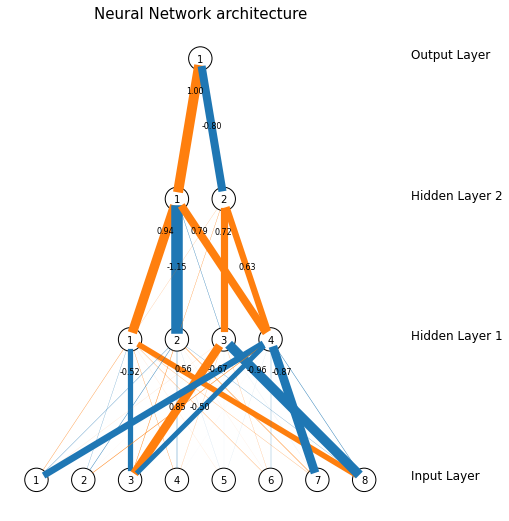

71/71 [==============================] - 0s 5ms/step - loss: 0.6250 - accuracy: 0.6434 - val_loss: 0.6406 - val_accuracy: 0.6181
Epoch 59/200
44/71 [=================>............] - ETA: 0s - loss: 0.6255 - accuracy: 0.6477

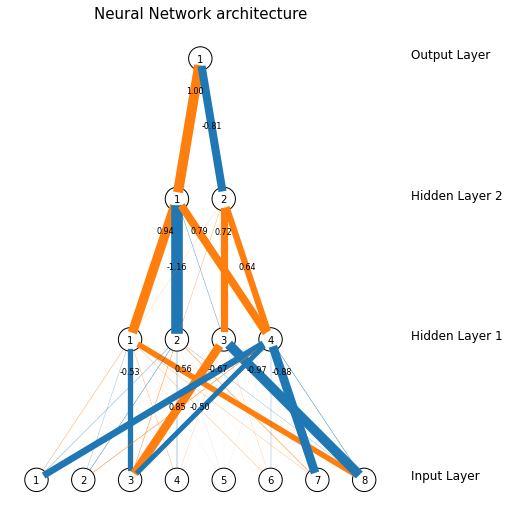

71/71 [==============================] - 0s 5ms/step - loss: 0.6252 - accuracy: 0.6421 - val_loss: 0.6409 - val_accuracy: 0.6181
Epoch 60/200
36/71 [==============>...............] - ETA: 0s - loss: 0.6243 - accuracy: 0.6458

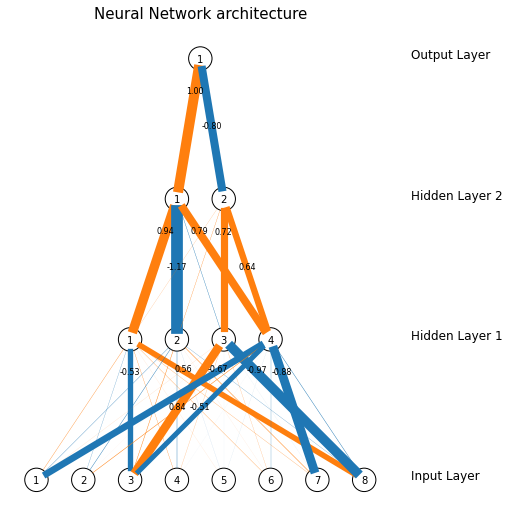

71/71 [==============================] - 0s 5ms/step - loss: 0.6249 - accuracy: 0.6461 - val_loss: 0.6407 - val_accuracy: 0.6181
Epoch 61/200
37/71 [==============>...............] - ETA: 0s - loss: 0.6160 - accuracy: 0.6495

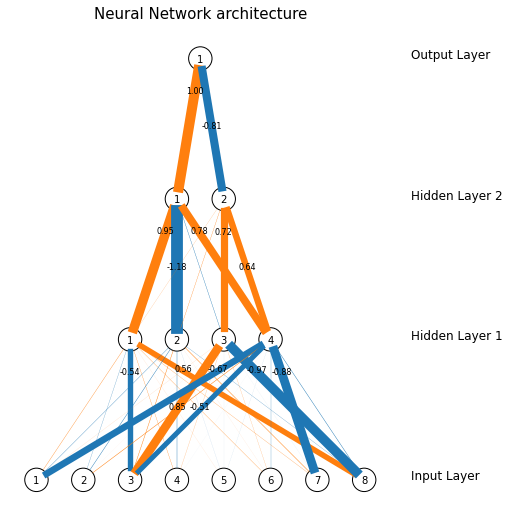

71/71 [==============================] - 0s 5ms/step - loss: 0.6247 - accuracy: 0.6461 - val_loss: 0.6408 - val_accuracy: 0.6146
Epoch 62/200
40/71 [===============>..............] - ETA: 0s - loss: 0.6313 - accuracy: 0.6367

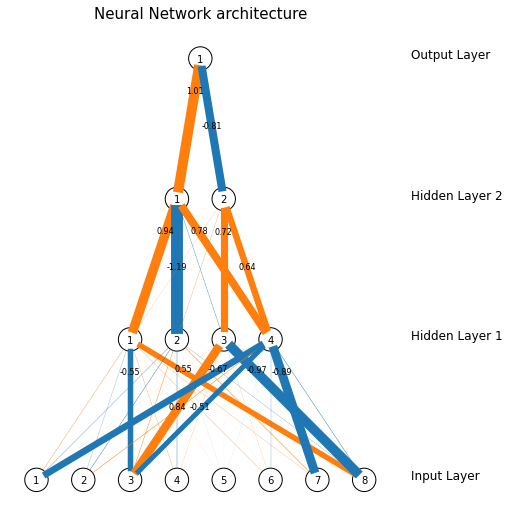

71/71 [==============================] - 0s 5ms/step - loss: 0.6247 - accuracy: 0.6434 - val_loss: 0.6403 - val_accuracy: 0.6146
Epoch 63/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6254 - accuracy: 0.6456

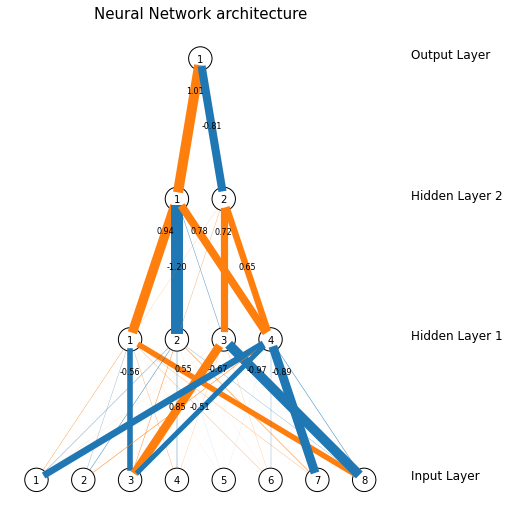

71/71 [==============================] - 0s 5ms/step - loss: 0.6248 - accuracy: 0.6443 - val_loss: 0.6403 - val_accuracy: 0.6163
Epoch 64/200
41/71 [================>.............] - ETA: 0s - loss: 0.6161 - accuracy: 0.6471

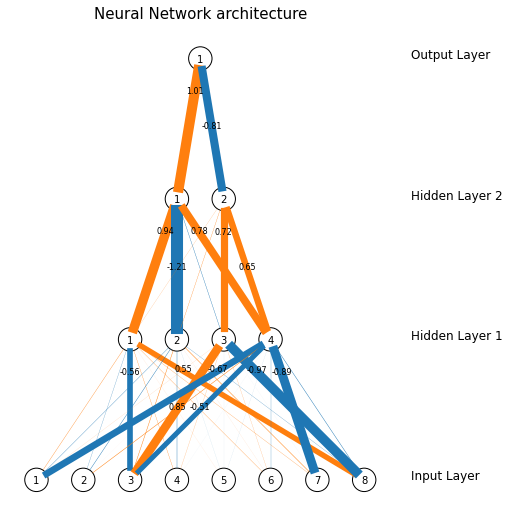

71/71 [==============================] - 0s 7ms/step - loss: 0.6247 - accuracy: 0.6447 - val_loss: 0.6401 - val_accuracy: 0.6146
Epoch 65/200
39/71 [===============>..............] - ETA: 0s - loss: 0.6308 - accuracy: 0.6466

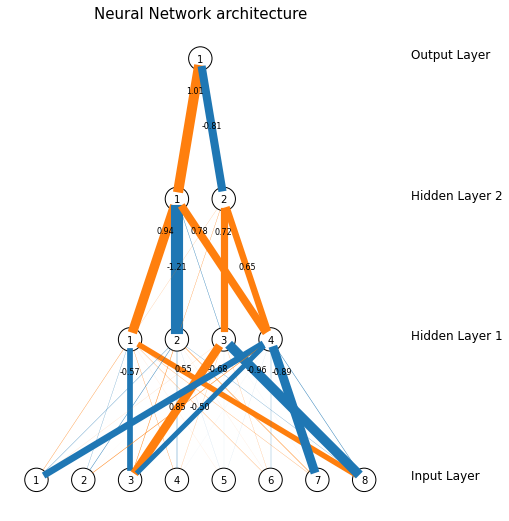

71/71 [==============================] - 0s 4ms/step - loss: 0.6244 - accuracy: 0.6421 - val_loss: 0.6405 - val_accuracy: 0.6234
Epoch 66/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6262 - accuracy: 0.6393

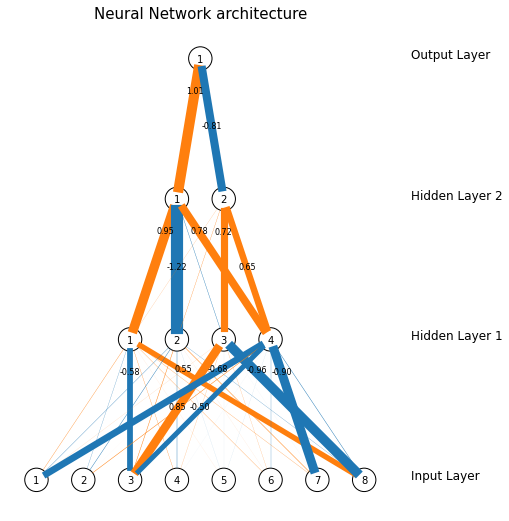

71/71 [==============================] - 0s 4ms/step - loss: 0.6246 - accuracy: 0.6425 - val_loss: 0.6399 - val_accuracy: 0.6181
Epoch 67/200
44/71 [=================>............] - ETA: 0s - loss: 0.6268 - accuracy: 0.6456

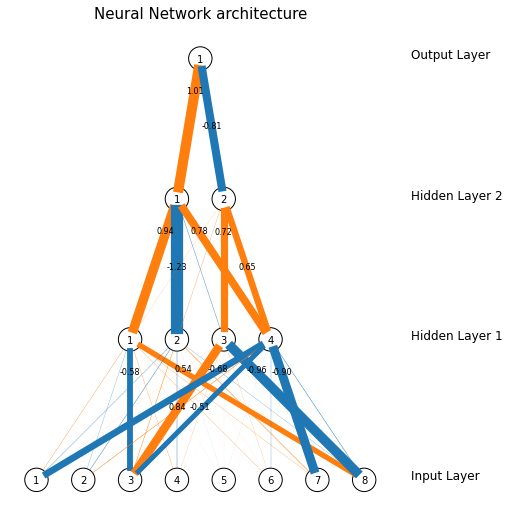

71/71 [==============================] - 0s 4ms/step - loss: 0.6245 - accuracy: 0.6438 - val_loss: 0.6396 - val_accuracy: 0.6181
Epoch 68/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6226 - accuracy: 0.6490

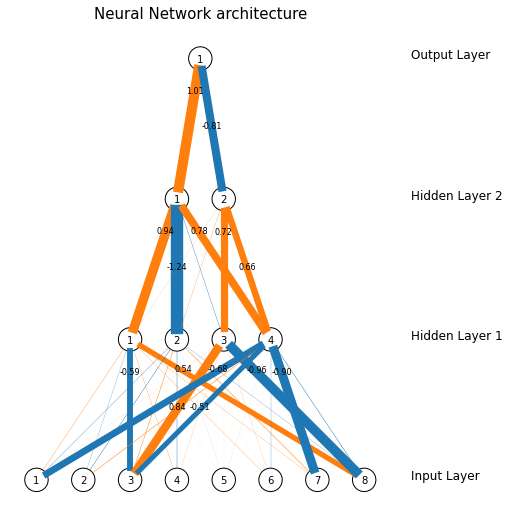

71/71 [==============================] - 0s 4ms/step - loss: 0.6245 - accuracy: 0.6447 - val_loss: 0.6398 - val_accuracy: 0.6199
Epoch 69/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6158 - accuracy: 0.6597

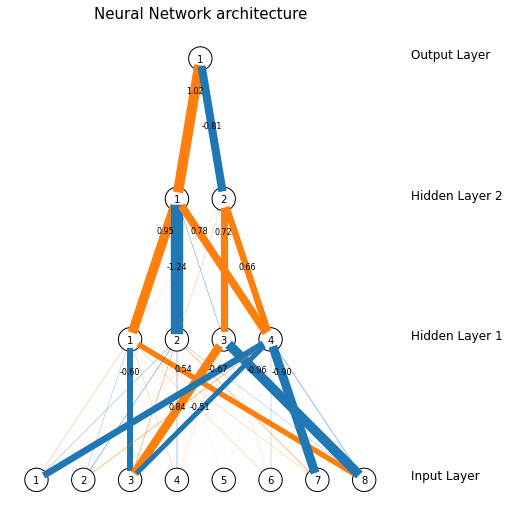

71/71 [==============================] - 0s 5ms/step - loss: 0.6246 - accuracy: 0.6447 - val_loss: 0.6396 - val_accuracy: 0.6146
Epoch 70/200
42/71 [================>.............] - ETA: 0s - loss: 0.6210 - accuracy: 0.6488

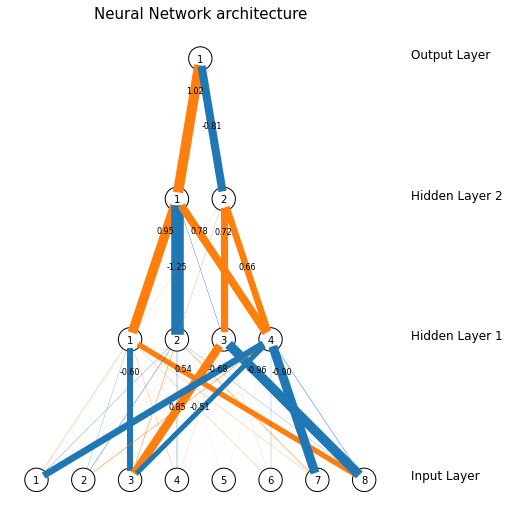

71/71 [==============================] - 0s 5ms/step - loss: 0.6245 - accuracy: 0.6421 - val_loss: 0.6394 - val_accuracy: 0.6163
Epoch 71/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6186 - accuracy: 0.6540

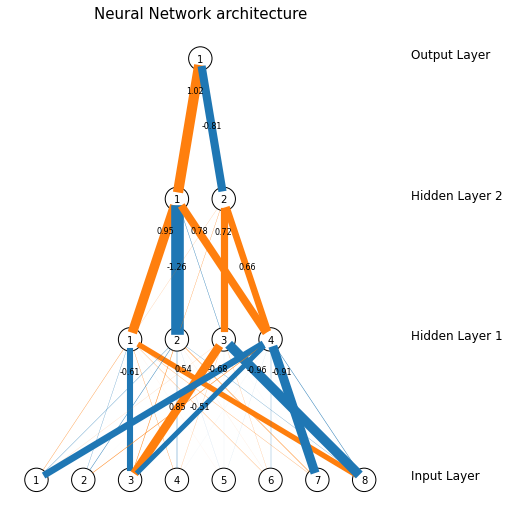

71/71 [==============================] - 0s 4ms/step - loss: 0.6243 - accuracy: 0.6434 - val_loss: 0.6393 - val_accuracy: 0.6146
Epoch 72/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6178 - accuracy: 0.6497

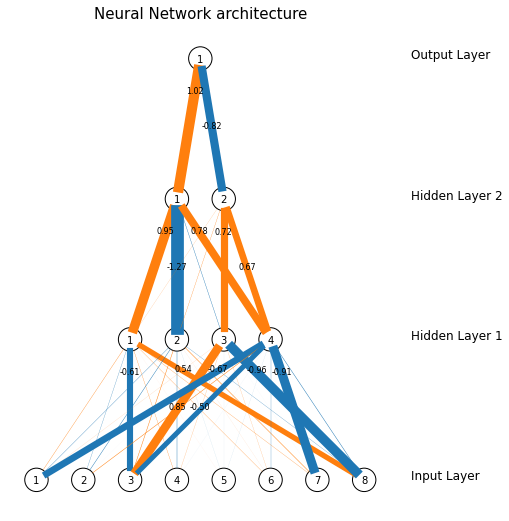

71/71 [==============================] - 0s 4ms/step - loss: 0.6240 - accuracy: 0.6425 - val_loss: 0.6391 - val_accuracy: 0.6163
Epoch 73/200
50/71 [====================>.........] - ETA: 0s - loss: 0.6166 - accuracy: 0.6469

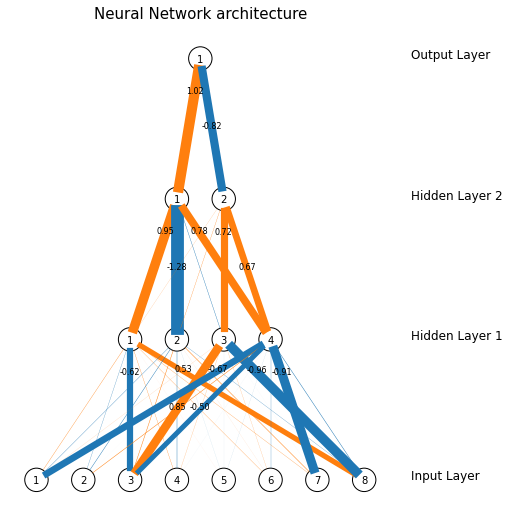

71/71 [==============================] - 0s 5ms/step - loss: 0.6242 - accuracy: 0.6412 - val_loss: 0.6386 - val_accuracy: 0.6146
Epoch 74/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6198 - accuracy: 0.6505

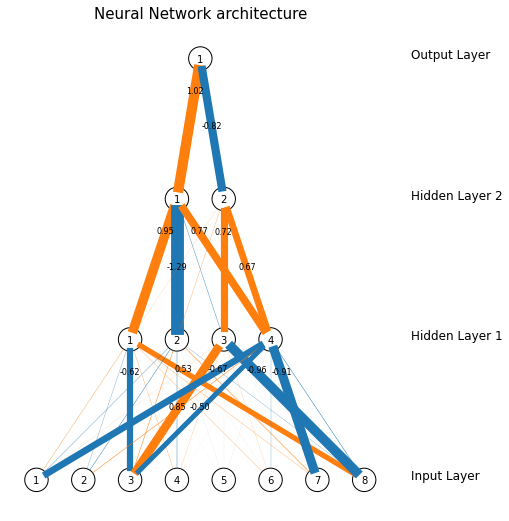

71/71 [==============================] - 1s 8ms/step - loss: 0.6242 - accuracy: 0.6452 - val_loss: 0.6392 - val_accuracy: 0.6181
Epoch 75/200
35/71 [=============>................] - ETA: 0s - loss: 0.6193 - accuracy: 0.6527

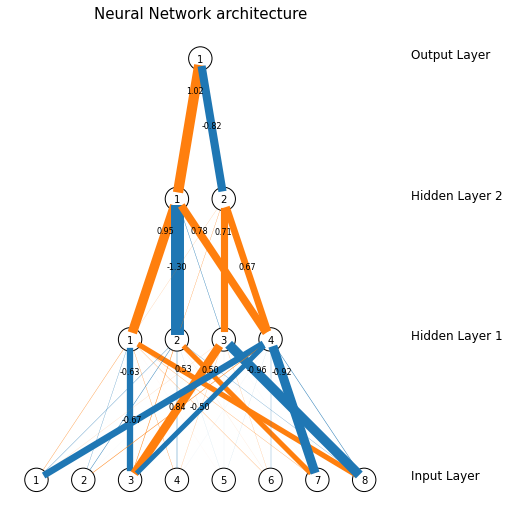

71/71 [==============================] - 0s 4ms/step - loss: 0.6240 - accuracy: 0.6438 - val_loss: 0.6386 - val_accuracy: 0.6163
Epoch 76/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6190 - accuracy: 0.6533

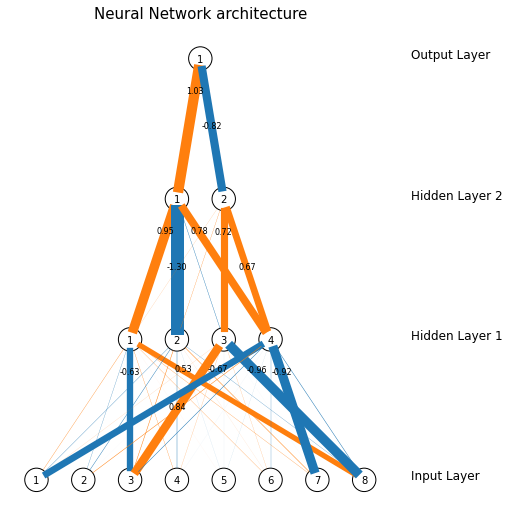

71/71 [==============================] - 0s 5ms/step - loss: 0.6239 - accuracy: 0.6474 - val_loss: 0.6387 - val_accuracy: 0.6181
Epoch 77/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6265 - accuracy: 0.6480

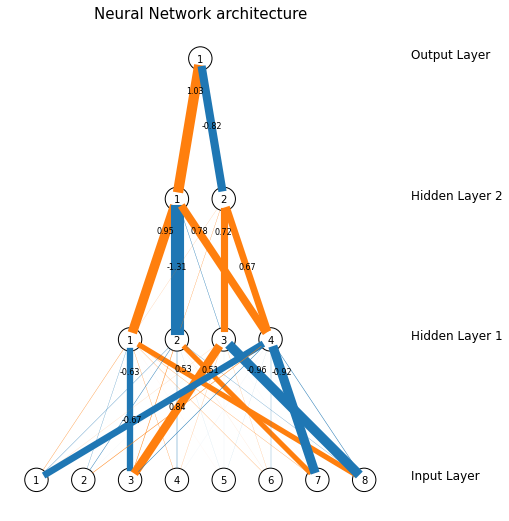

71/71 [==============================] - 0s 4ms/step - loss: 0.6238 - accuracy: 0.6483 - val_loss: 0.6391 - val_accuracy: 0.6163
Epoch 78/200
57/71 [=======================>......] - ETA: 0s - loss: 0.6228 - accuracy: 0.6502

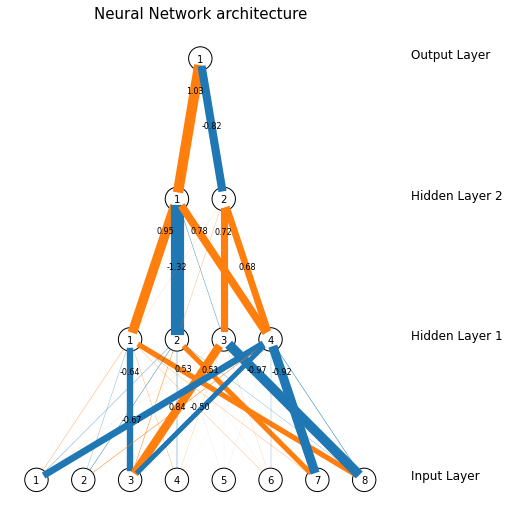

71/71 [==============================] - 0s 4ms/step - loss: 0.6238 - accuracy: 0.6447 - val_loss: 0.6388 - val_accuracy: 0.6199
Epoch 79/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6261 - accuracy: 0.6403

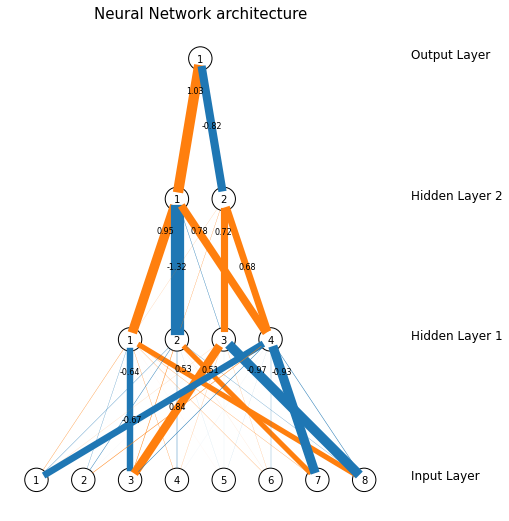

71/71 [==============================] - 0s 4ms/step - loss: 0.6237 - accuracy: 0.6434 - val_loss: 0.6391 - val_accuracy: 0.6252
Epoch 80/200
44/71 [=================>............] - ETA: 0s - loss: 0.6250 - accuracy: 0.6470

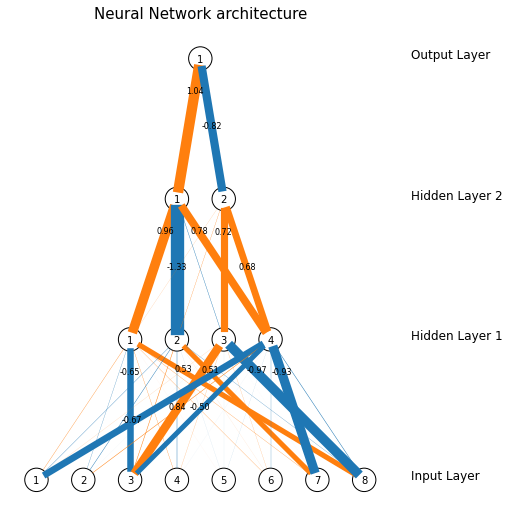

71/71 [==============================] - 0s 4ms/step - loss: 0.6237 - accuracy: 0.6447 - val_loss: 0.6385 - val_accuracy: 0.6181
Epoch 81/200
44/71 [=================>............] - ETA: 0s - loss: 0.6327 - accuracy: 0.6420

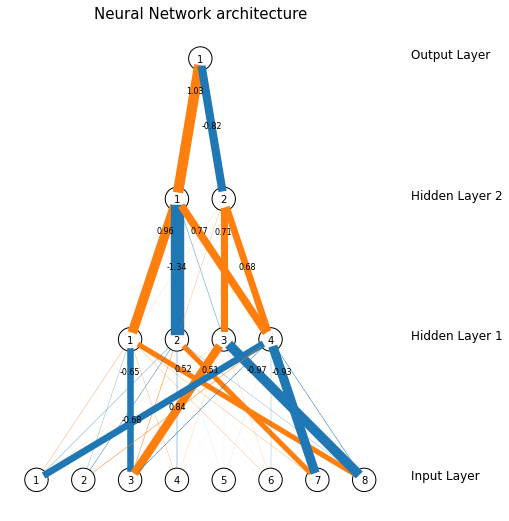

71/71 [==============================] - 0s 4ms/step - loss: 0.6237 - accuracy: 0.6443 - val_loss: 0.6384 - val_accuracy: 0.6217
Epoch 82/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6253 - accuracy: 0.6430

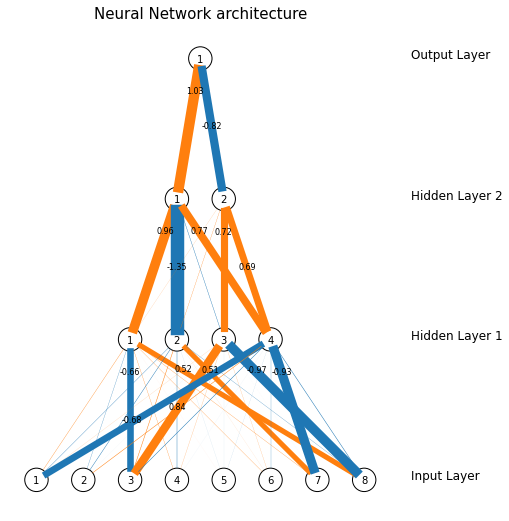

71/71 [==============================] - 0s 4ms/step - loss: 0.6236 - accuracy: 0.6470 - val_loss: 0.6384 - val_accuracy: 0.6181
Epoch 83/200
44/71 [=================>............] - ETA: 0s - loss: 0.6234 - accuracy: 0.6491

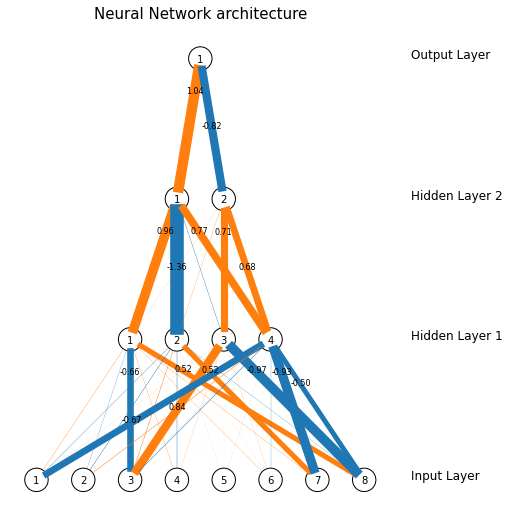

71/71 [==============================] - 0s 4ms/step - loss: 0.6235 - accuracy: 0.6434 - val_loss: 0.6384 - val_accuracy: 0.6252
Epoch 84/200
44/71 [=================>............] - ETA: 0s - loss: 0.6267 - accuracy: 0.6349

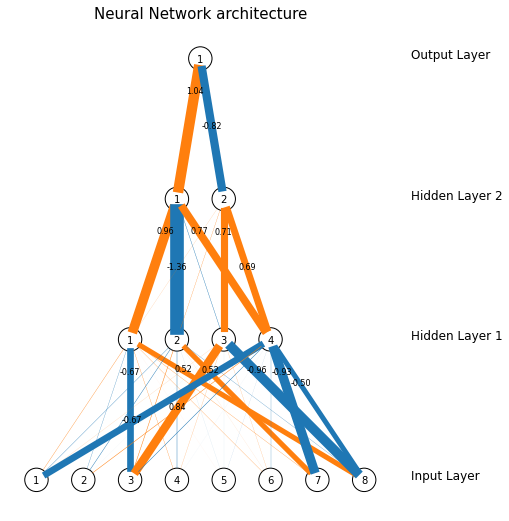

71/71 [==============================] - 1s 7ms/step - loss: 0.6236 - accuracy: 0.6443 - val_loss: 0.6379 - val_accuracy: 0.6199
Epoch 85/200
39/71 [===============>..............] - ETA: 0s - loss: 0.6188 - accuracy: 0.6554

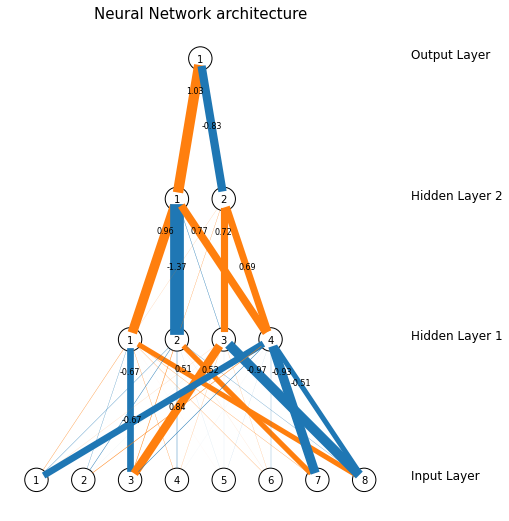

71/71 [==============================] - 0s 4ms/step - loss: 0.6234 - accuracy: 0.6438 - val_loss: 0.6383 - val_accuracy: 0.6234
Epoch 86/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6182 - accuracy: 0.6586

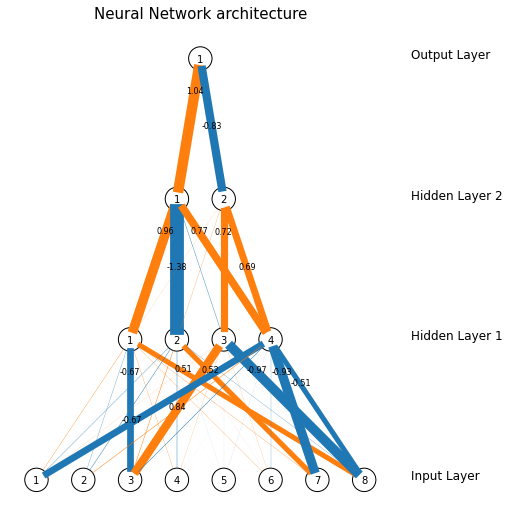

71/71 [==============================] - 0s 4ms/step - loss: 0.6236 - accuracy: 0.6447 - val_loss: 0.6385 - val_accuracy: 0.6199
Epoch 87/200
44/71 [=================>............] - ETA: 0s - loss: 0.6152 - accuracy: 0.6605

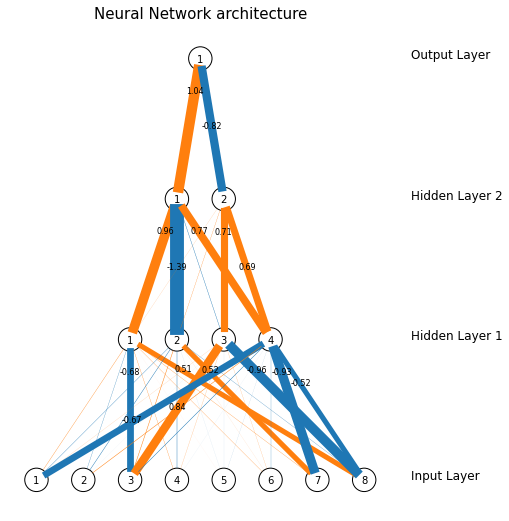

71/71 [==============================] - 0s 5ms/step - loss: 0.6235 - accuracy: 0.6474 - val_loss: 0.6378 - val_accuracy: 0.6163
Epoch 88/200
44/71 [=================>............] - ETA: 0s - loss: 0.6182 - accuracy: 0.6491

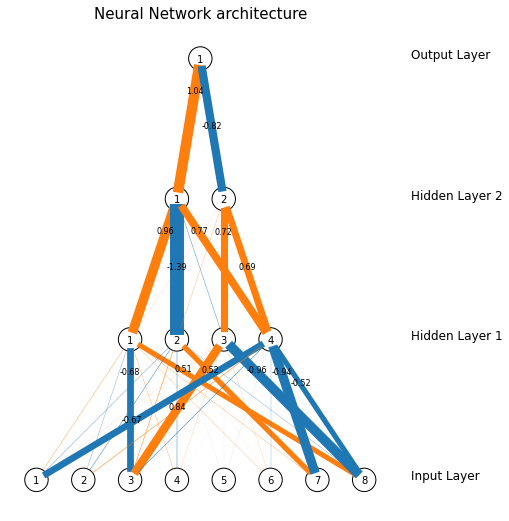

71/71 [==============================] - 0s 5ms/step - loss: 0.6233 - accuracy: 0.6465 - val_loss: 0.6378 - val_accuracy: 0.6181
Epoch 89/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6298 - accuracy: 0.6352

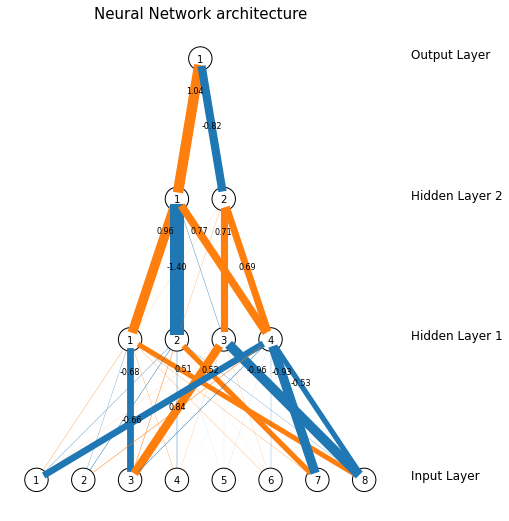

71/71 [==============================] - 0s 5ms/step - loss: 0.6234 - accuracy: 0.6443 - val_loss: 0.6379 - val_accuracy: 0.6217
Epoch 90/200
44/71 [=================>............] - ETA: 0s - loss: 0.6311 - accuracy: 0.6399

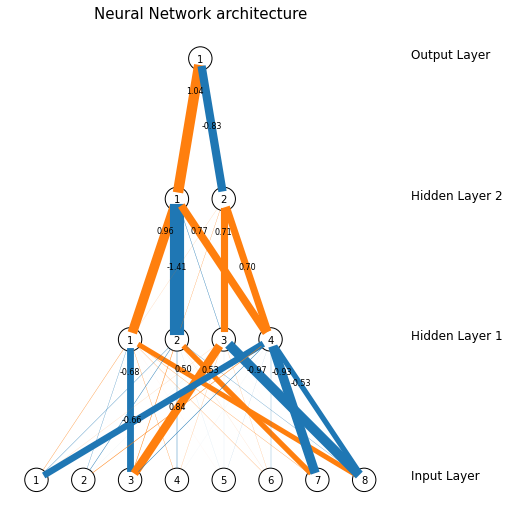

71/71 [==============================] - 0s 4ms/step - loss: 0.6236 - accuracy: 0.6438 - val_loss: 0.6375 - val_accuracy: 0.6234
Epoch 91/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6296 - accuracy: 0.6332

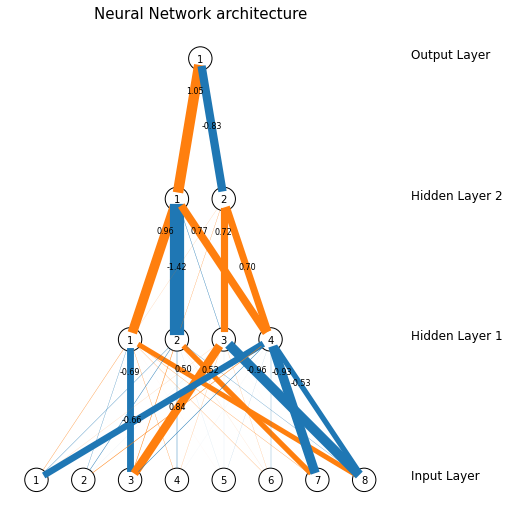

71/71 [==============================] - 0s 4ms/step - loss: 0.6235 - accuracy: 0.6412 - val_loss: 0.6374 - val_accuracy: 0.6270
Epoch 92/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6262 - accuracy: 0.6356

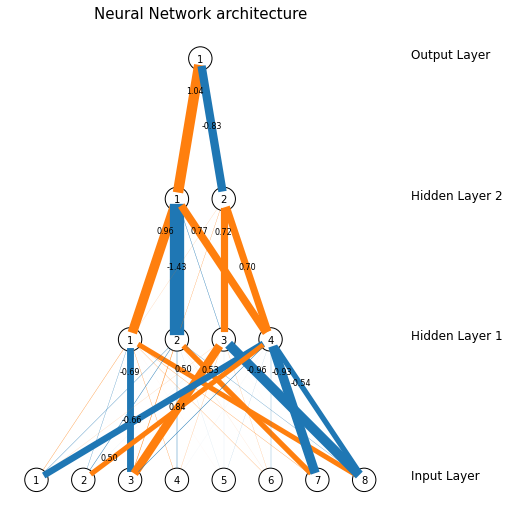

71/71 [==============================] - 0s 4ms/step - loss: 0.6232 - accuracy: 0.6443 - val_loss: 0.6378 - val_accuracy: 0.6270
Epoch 93/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6265 - accuracy: 0.6387

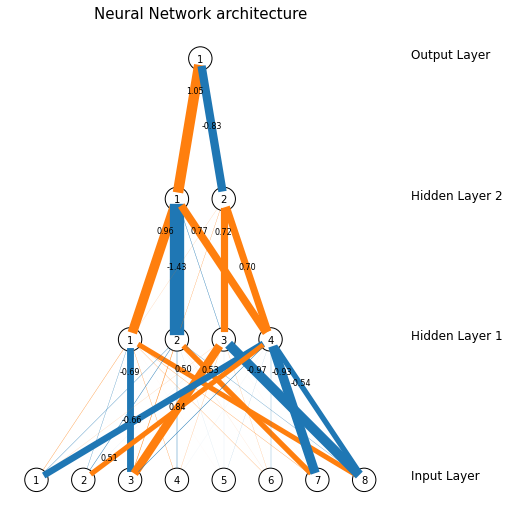

71/71 [==============================] - 0s 5ms/step - loss: 0.6234 - accuracy: 0.6438 - val_loss: 0.6379 - val_accuracy: 0.6252
Epoch 94/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6228 - accuracy: 0.6466

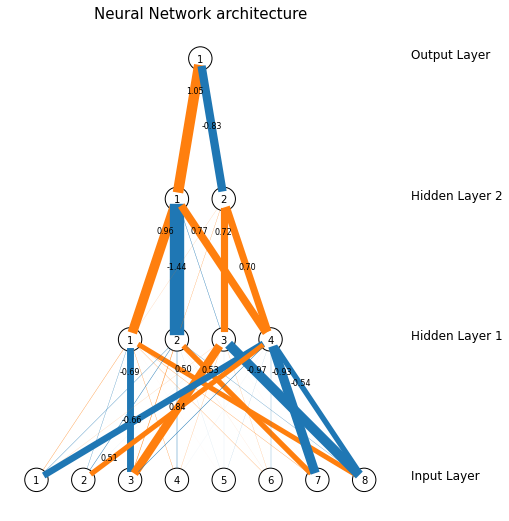

71/71 [==============================] - 0s 7ms/step - loss: 0.6231 - accuracy: 0.6447 - val_loss: 0.6377 - val_accuracy: 0.6288
Epoch 95/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6324 - accuracy: 0.6361

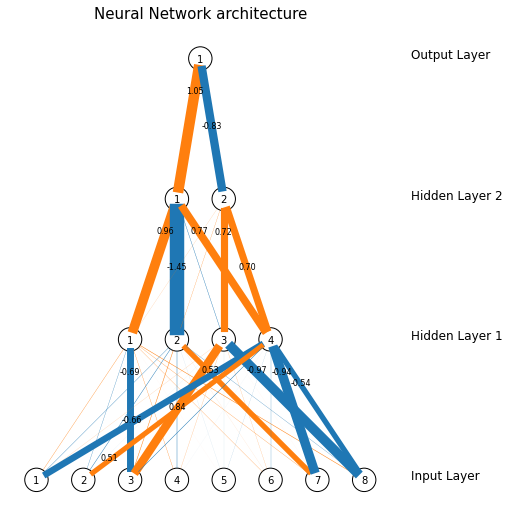

71/71 [==============================] - 0s 4ms/step - loss: 0.6234 - accuracy: 0.6434 - val_loss: 0.6374 - val_accuracy: 0.6234
Epoch 96/200
59/71 [=======================>......] - ETA: 0s - loss: 0.6223 - accuracy: 0.6488

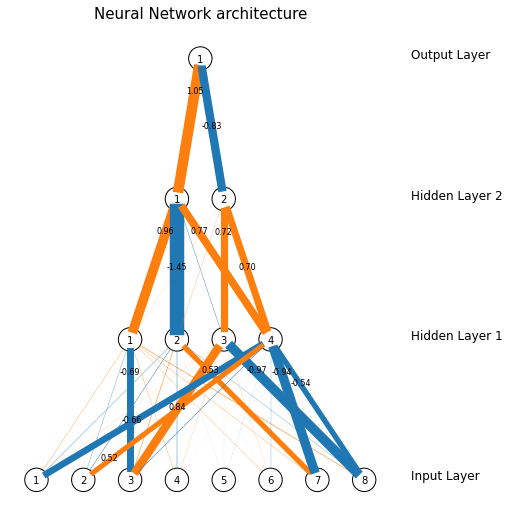

71/71 [==============================] - 0s 4ms/step - loss: 0.6233 - accuracy: 0.6470 - val_loss: 0.6376 - val_accuracy: 0.6217
Epoch 97/200
38/71 [===============>..............] - ETA: 0s - loss: 0.6276 - accuracy: 0.6472

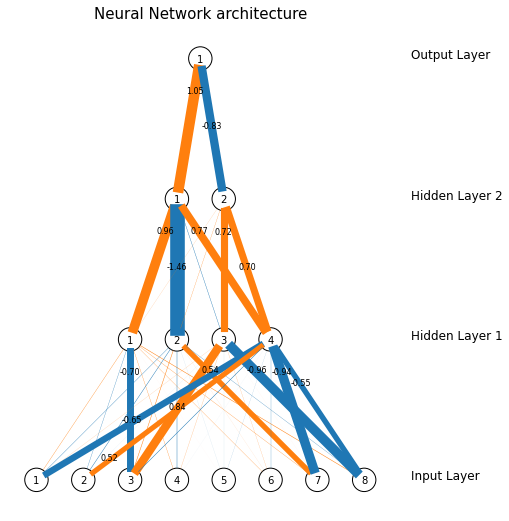

71/71 [==============================] - 0s 4ms/step - loss: 0.6230 - accuracy: 0.6434 - val_loss: 0.6377 - val_accuracy: 0.6217
Epoch 98/200
38/71 [===============>..............] - ETA: 0s - loss: 0.6129 - accuracy: 0.6637

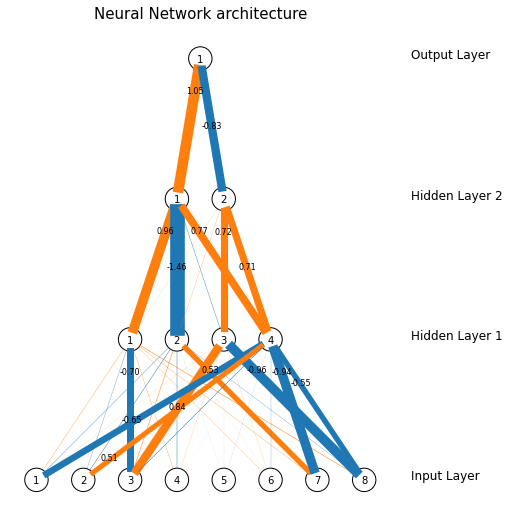

71/71 [==============================] - 0s 4ms/step - loss: 0.6232 - accuracy: 0.6447 - val_loss: 0.6377 - val_accuracy: 0.6288
Epoch 99/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6264 - accuracy: 0.6413

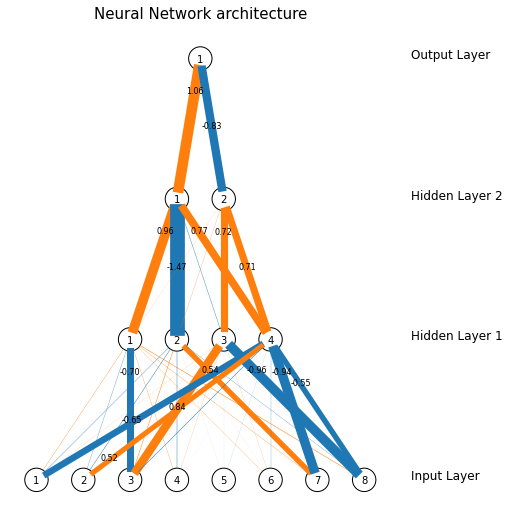

71/71 [==============================] - 0s 4ms/step - loss: 0.6233 - accuracy: 0.6425 - val_loss: 0.6373 - val_accuracy: 0.6306
Epoch 100/200
44/71 [=================>............] - ETA: 0s - loss: 0.6193 - accuracy: 0.6513

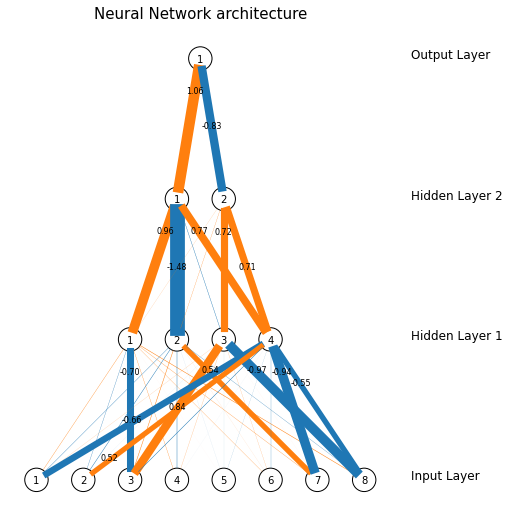

71/71 [==============================] - 0s 4ms/step - loss: 0.6230 - accuracy: 0.6456 - val_loss: 0.6374 - val_accuracy: 0.6270
Epoch 101/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6303 - accuracy: 0.6297

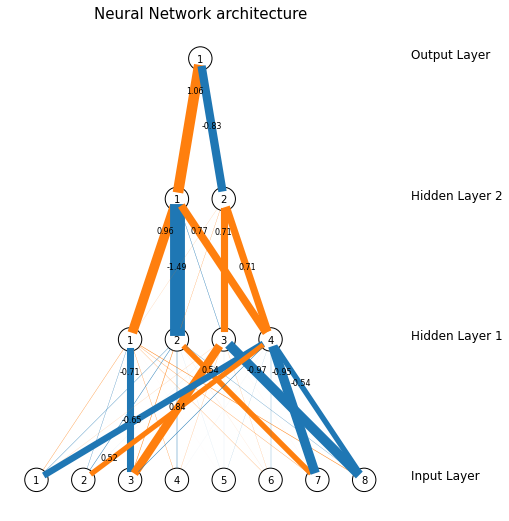

71/71 [==============================] - 0s 4ms/step - loss: 0.6229 - accuracy: 0.6407 - val_loss: 0.6373 - val_accuracy: 0.6181
Epoch 102/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6132 - accuracy: 0.6598

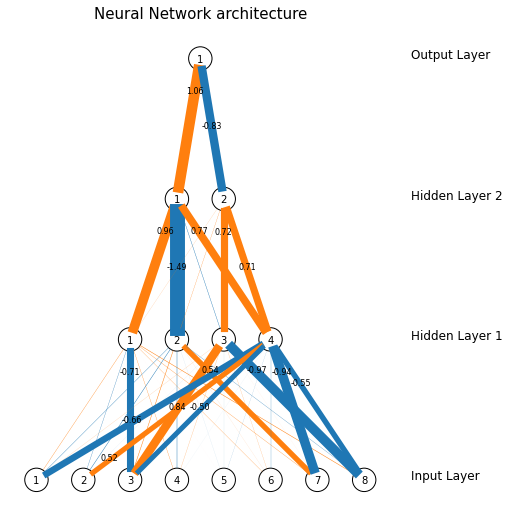

71/71 [==============================] - 0s 4ms/step - loss: 0.6233 - accuracy: 0.6425 - val_loss: 0.6374 - val_accuracy: 0.6252
Epoch 103/200
57/71 [=======================>......] - ETA: 0s - loss: 0.6254 - accuracy: 0.6508

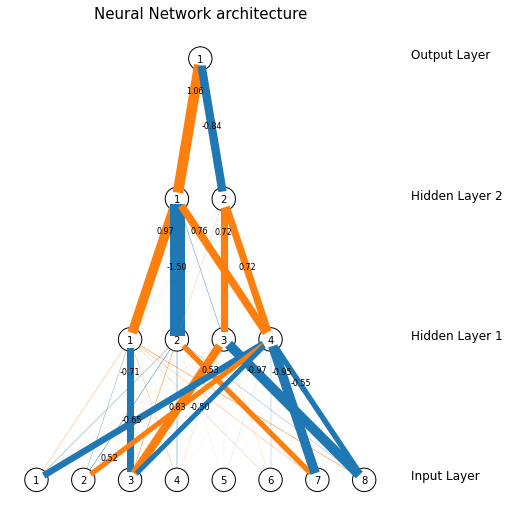

71/71 [==============================] - 0s 4ms/step - loss: 0.6230 - accuracy: 0.6456 - val_loss: 0.6374 - val_accuracy: 0.6252
Epoch 104/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6264 - accuracy: 0.6443

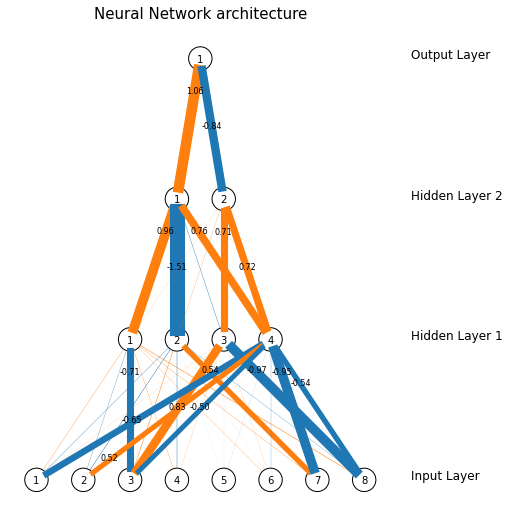

71/71 [==============================] - 1s 7ms/step - loss: 0.6231 - accuracy: 0.6470 - val_loss: 0.6375 - val_accuracy: 0.6252
Epoch 105/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6274 - accuracy: 0.6393

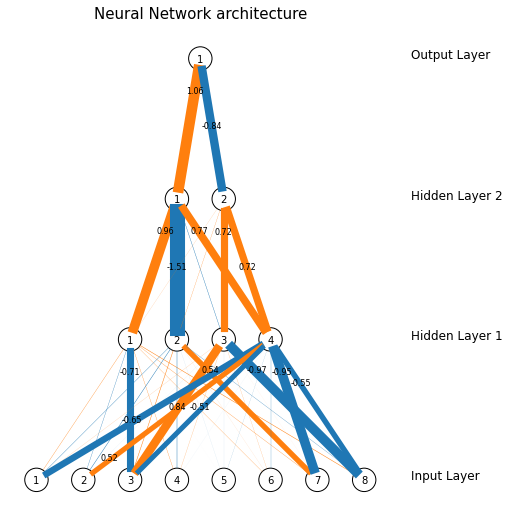

71/71 [==============================] - 0s 4ms/step - loss: 0.6230 - accuracy: 0.6465 - val_loss: 0.6375 - val_accuracy: 0.6252
Epoch 106/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6313 - accuracy: 0.6299

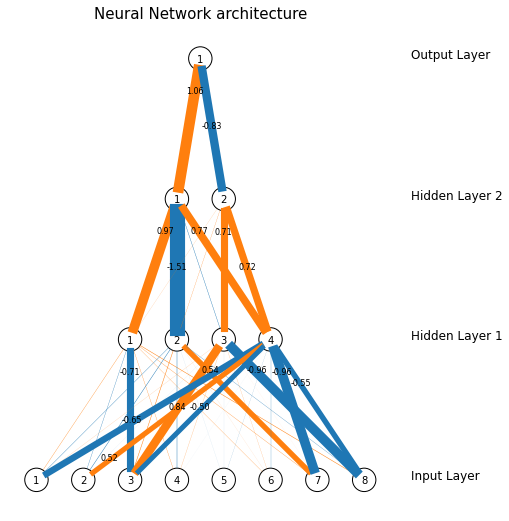

71/71 [==============================] - 0s 5ms/step - loss: 0.6228 - accuracy: 0.6443 - val_loss: 0.6372 - val_accuracy: 0.6217
Epoch 107/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6244 - accuracy: 0.6500

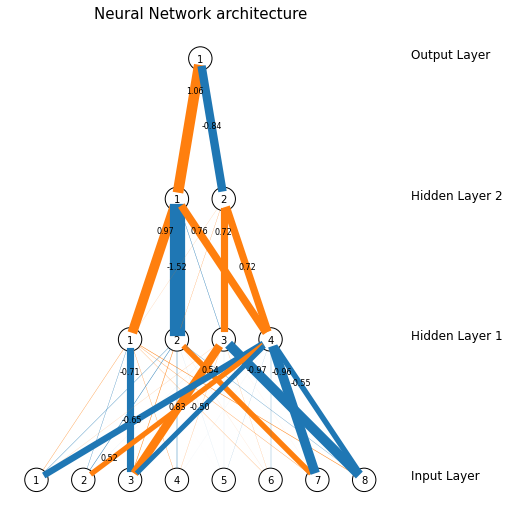

71/71 [==============================] - 0s 5ms/step - loss: 0.6229 - accuracy: 0.6434 - val_loss: 0.6377 - val_accuracy: 0.6270
Epoch 108/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6210 - accuracy: 0.6469

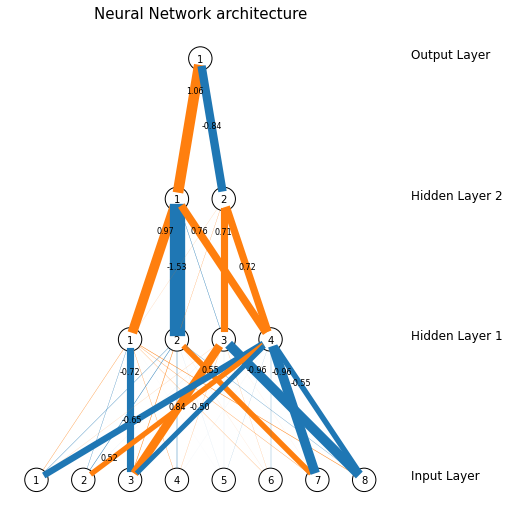

71/71 [==============================] - 0s 4ms/step - loss: 0.6230 - accuracy: 0.6447 - val_loss: 0.6370 - val_accuracy: 0.6252
Epoch 109/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6240 - accuracy: 0.6480

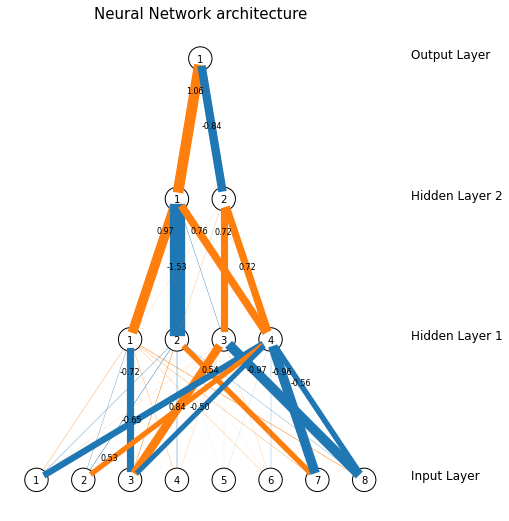

71/71 [==============================] - 0s 4ms/step - loss: 0.6229 - accuracy: 0.6438 - val_loss: 0.6372 - val_accuracy: 0.6252
Epoch 110/200
44/71 [=================>............] - ETA: 0s - loss: 0.6148 - accuracy: 0.6463

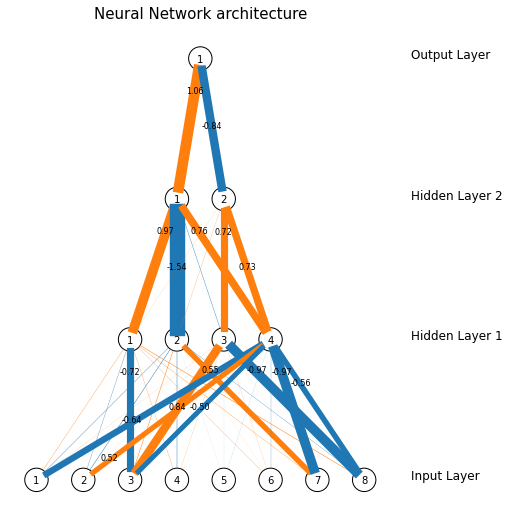

71/71 [==============================] - 0s 4ms/step - loss: 0.6227 - accuracy: 0.6434 - val_loss: 0.6373 - val_accuracy: 0.6252
Epoch 111/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6268 - accuracy: 0.6345

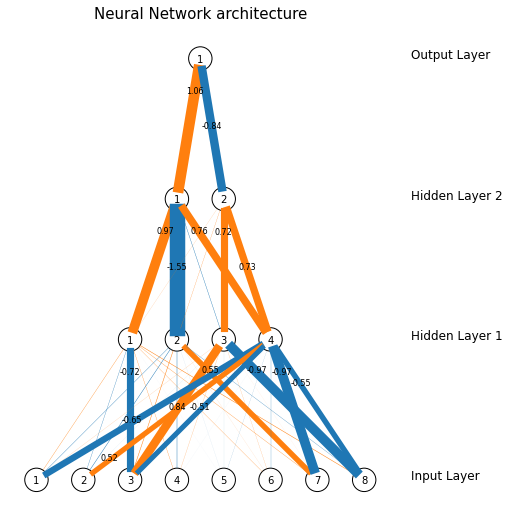

71/71 [==============================] - 0s 4ms/step - loss: 0.6227 - accuracy: 0.6421 - val_loss: 0.6373 - val_accuracy: 0.6252
Epoch 112/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6185 - accuracy: 0.6499

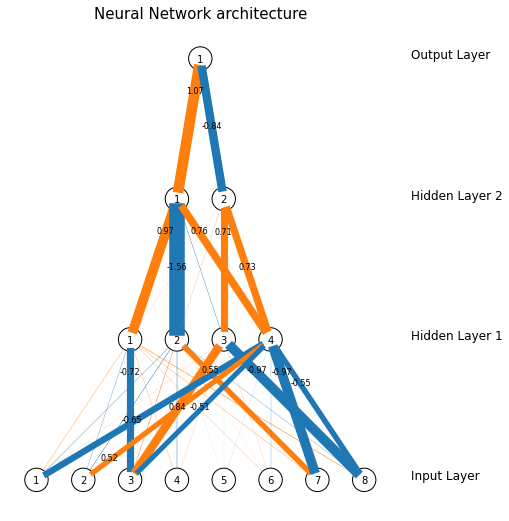

71/71 [==============================] - 0s 4ms/step - loss: 0.6229 - accuracy: 0.6434 - val_loss: 0.6372 - val_accuracy: 0.6252
Epoch 113/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6225 - accuracy: 0.6384

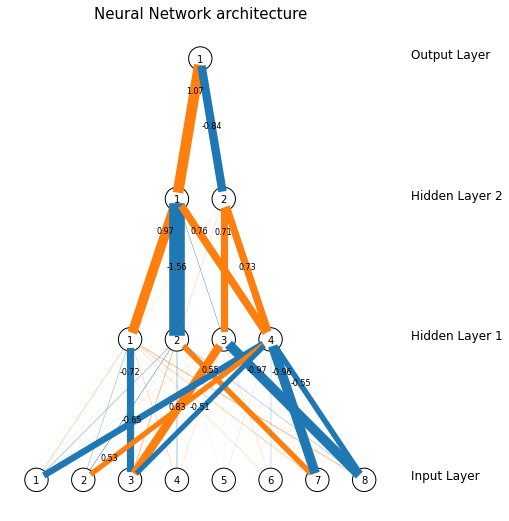

71/71 [==============================] - 0s 5ms/step - loss: 0.6228 - accuracy: 0.6416 - val_loss: 0.6374 - val_accuracy: 0.6270
Epoch 114/200
37/71 [==============>...............] - ETA: 0s - loss: 0.6197 - accuracy: 0.6410

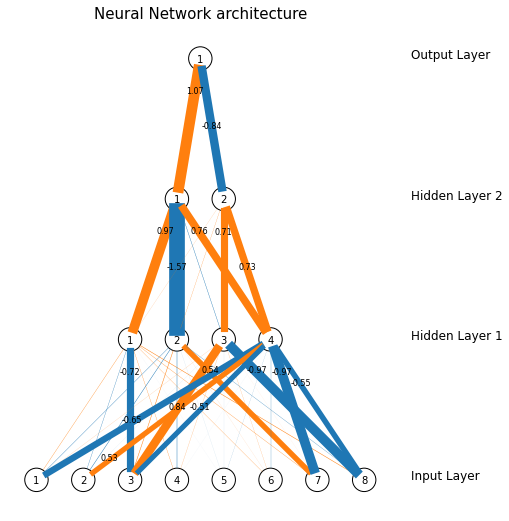

71/71 [==============================] - 1s 9ms/step - loss: 0.6228 - accuracy: 0.6443 - val_loss: 0.6374 - val_accuracy: 0.6306
Epoch 115/200
44/71 [=================>............] - ETA: 0s - loss: 0.6201 - accuracy: 0.6499

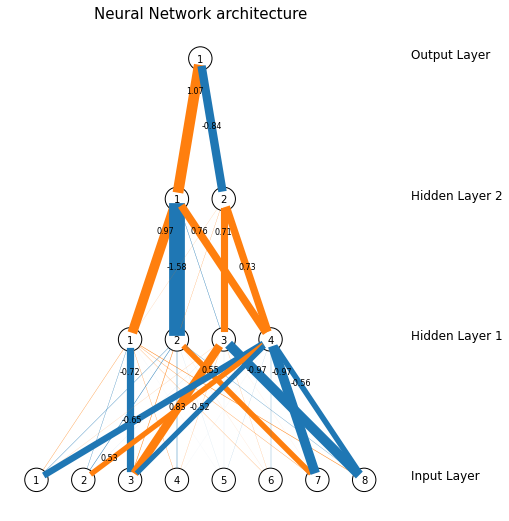

71/71 [==============================] - 0s 4ms/step - loss: 0.6227 - accuracy: 0.6438 - val_loss: 0.6375 - val_accuracy: 0.6252
Epoch 116/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6235 - accuracy: 0.6396

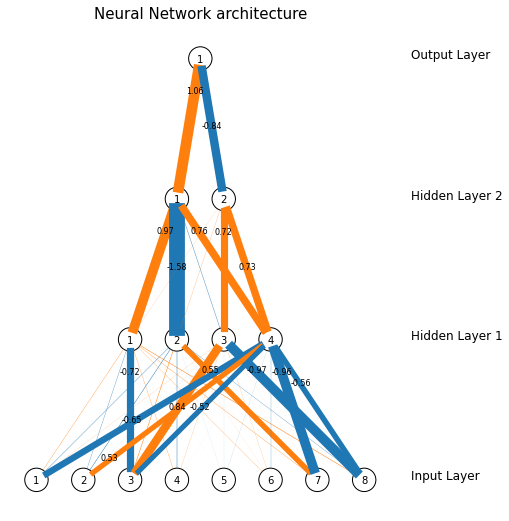

71/71 [==============================] - 0s 4ms/step - loss: 0.6226 - accuracy: 0.6430 - val_loss: 0.6376 - val_accuracy: 0.6270
Epoch 117/200
39/71 [===============>..............] - ETA: 0s - loss: 0.6185 - accuracy: 0.6498

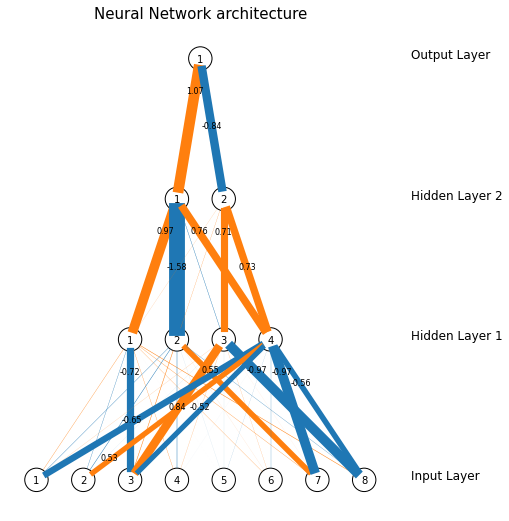

71/71 [==============================] - 0s 4ms/step - loss: 0.6231 - accuracy: 0.6438 - val_loss: 0.6376 - val_accuracy: 0.6234
Epoch 118/200
58/71 [=======================>......] - ETA: 0s - loss: 0.6253 - accuracy: 0.6428

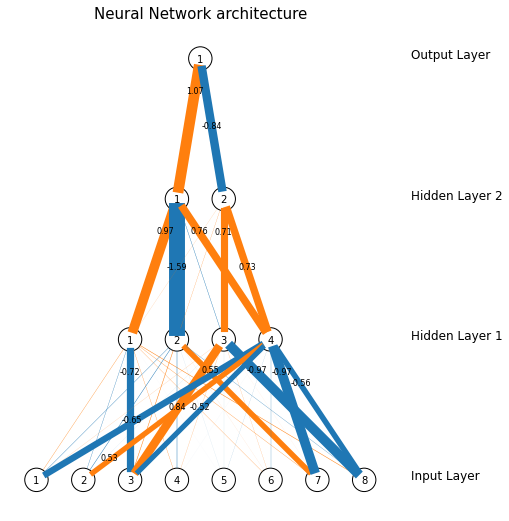

71/71 [==============================] - 0s 4ms/step - loss: 0.6227 - accuracy: 0.6416 - val_loss: 0.6375 - val_accuracy: 0.6252
Epoch 119/200
44/71 [=================>............] - ETA: 0s - loss: 0.6193 - accuracy: 0.6541

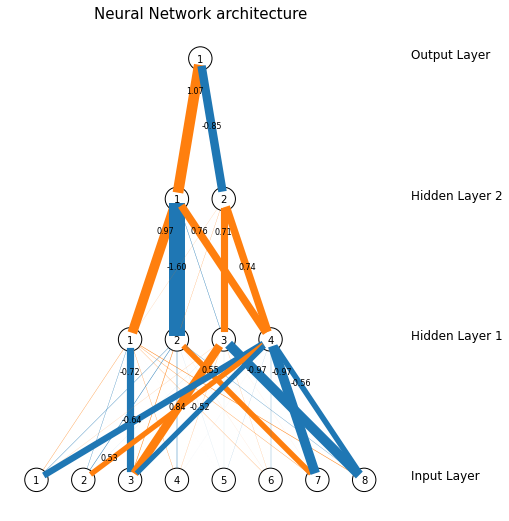

71/71 [==============================] - 0s 5ms/step - loss: 0.6228 - accuracy: 0.6456 - val_loss: 0.6379 - val_accuracy: 0.6252
Epoch 120/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6205 - accuracy: 0.6431

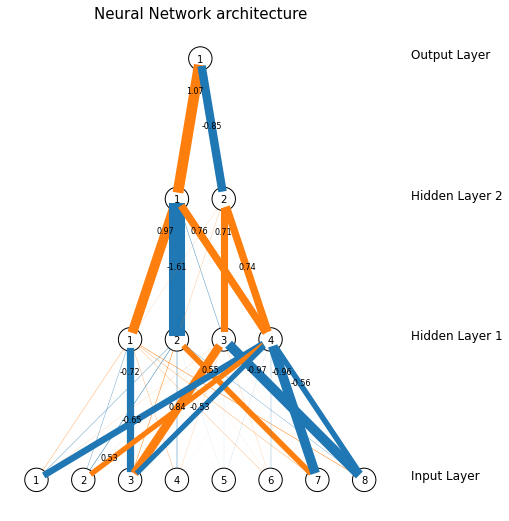

71/71 [==============================] - 0s 5ms/step - loss: 0.6229 - accuracy: 0.6465 - val_loss: 0.6377 - val_accuracy: 0.6217
Epoch 121/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6237 - accuracy: 0.6424

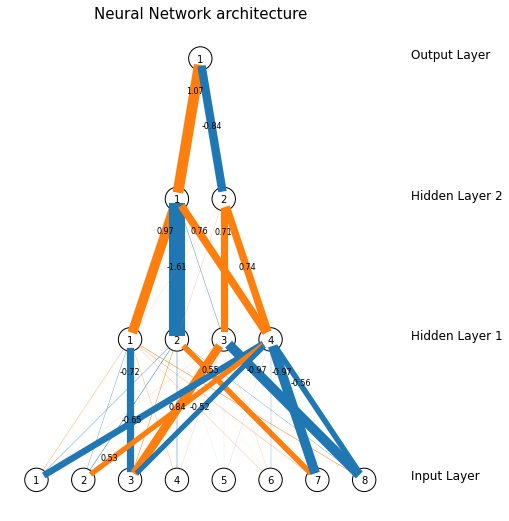

71/71 [==============================] - 0s 4ms/step - loss: 0.6227 - accuracy: 0.6447 - val_loss: 0.6377 - val_accuracy: 0.6181
Epoch 122/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6165 - accuracy: 0.6523

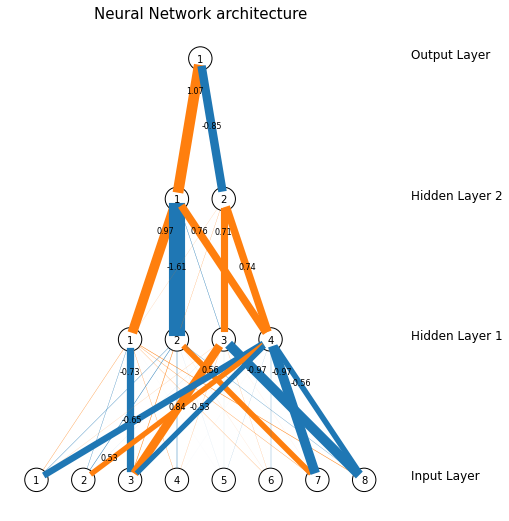

71/71 [==============================] - 0s 4ms/step - loss: 0.6226 - accuracy: 0.6461 - val_loss: 0.6374 - val_accuracy: 0.6217
Epoch 123/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6131 - accuracy: 0.6590

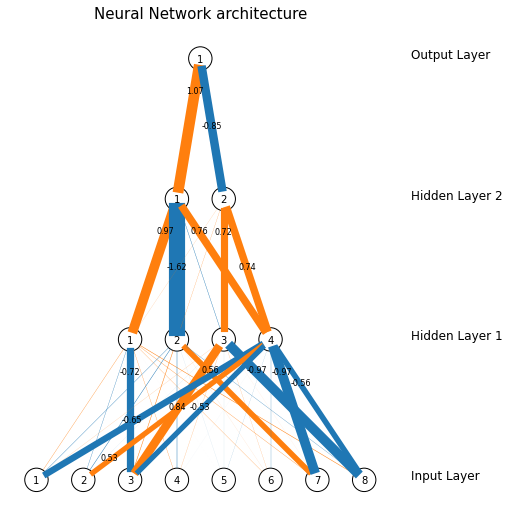

71/71 [==============================] - 0s 4ms/step - loss: 0.6229 - accuracy: 0.6438 - val_loss: 0.6380 - val_accuracy: 0.6252
Epoch 124/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6205 - accuracy: 0.6434

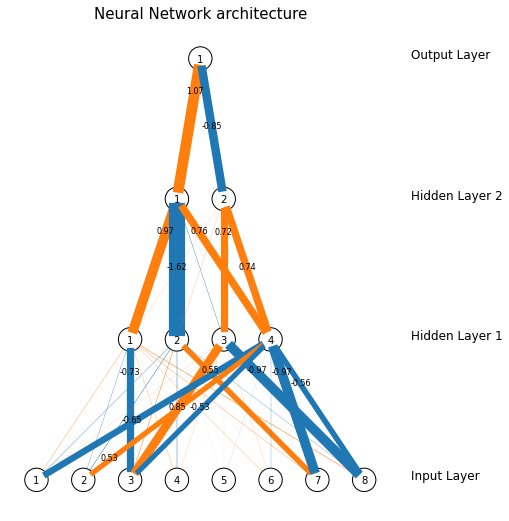

71/71 [==============================] - 0s 7ms/step - loss: 0.6226 - accuracy: 0.6447 - val_loss: 0.6375 - val_accuracy: 0.6234
Epoch 125/200
38/71 [===============>..............] - ETA: 0s - loss: 0.6282 - accuracy: 0.6308

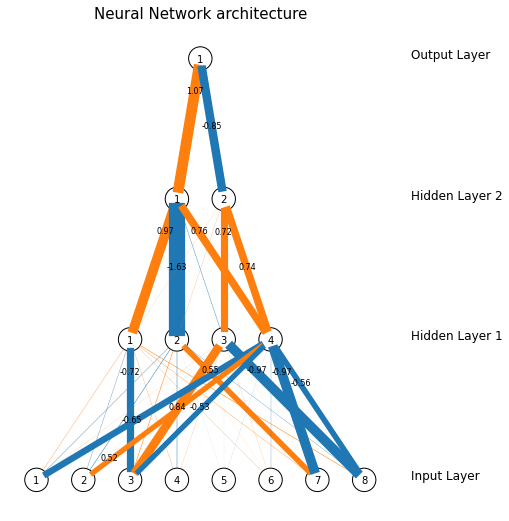

71/71 [==============================] - 0s 4ms/step - loss: 0.6227 - accuracy: 0.6443 - val_loss: 0.6377 - val_accuracy: 0.6270
Epoch 126/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6193 - accuracy: 0.6376

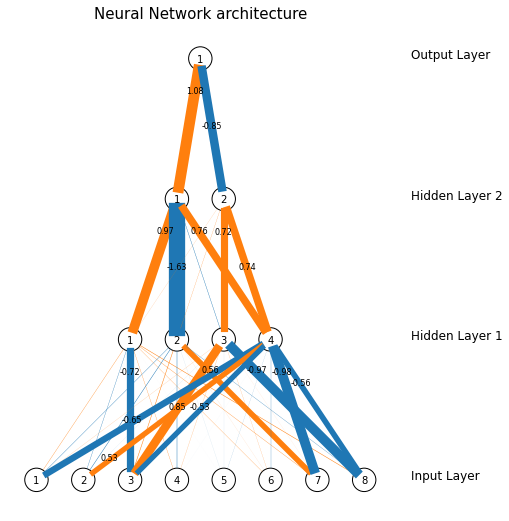

71/71 [==============================] - 0s 4ms/step - loss: 0.6226 - accuracy: 0.6412 - val_loss: 0.6376 - val_accuracy: 0.6199
Epoch 127/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6210 - accuracy: 0.6406

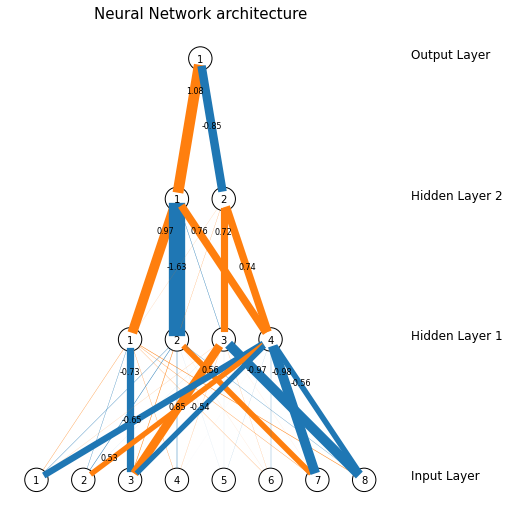

71/71 [==============================] - 0s 4ms/step - loss: 0.6227 - accuracy: 0.6390 - val_loss: 0.6375 - val_accuracy: 0.6181
Epoch 128/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6203 - accuracy: 0.6436

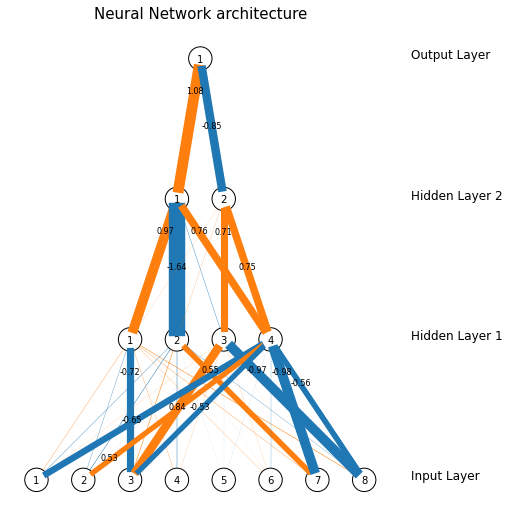

71/71 [==============================] - 0s 4ms/step - loss: 0.6229 - accuracy: 0.6416 - val_loss: 0.6378 - val_accuracy: 0.6252
Epoch 129/200
42/71 [================>.............] - ETA: 0s - loss: 0.6316 - accuracy: 0.6406

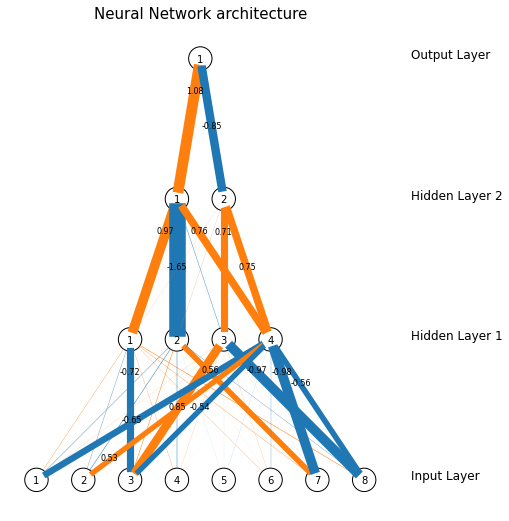

71/71 [==============================] - 0s 5ms/step - loss: 0.6226 - accuracy: 0.6452 - val_loss: 0.6383 - val_accuracy: 0.6252
Epoch 130/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6242 - accuracy: 0.6460

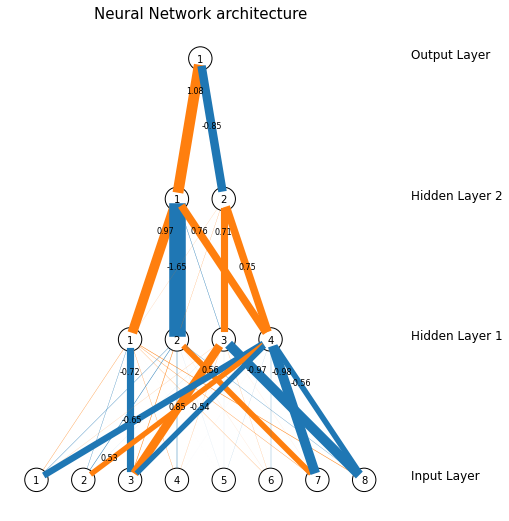

71/71 [==============================] - 0s 4ms/step - loss: 0.6226 - accuracy: 0.6456 - val_loss: 0.6379 - val_accuracy: 0.6234
Epoch 131/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6249 - accuracy: 0.6424

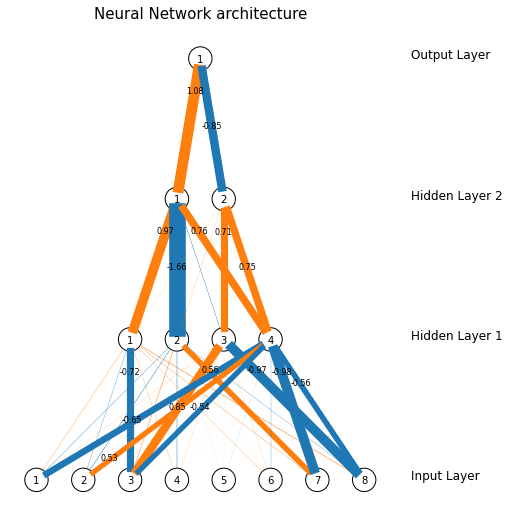

71/71 [==============================] - 0s 5ms/step - loss: 0.6226 - accuracy: 0.6478 - val_loss: 0.6381 - val_accuracy: 0.6252
Epoch 132/200
44/71 [=================>............] - ETA: 0s - loss: 0.6203 - accuracy: 0.6449

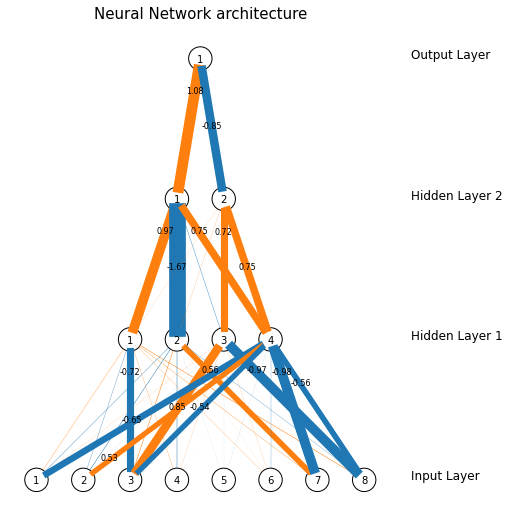

71/71 [==============================] - 0s 4ms/step - loss: 0.6224 - accuracy: 0.6434 - val_loss: 0.6383 - val_accuracy: 0.6234
Epoch 133/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6207 - accuracy: 0.6447

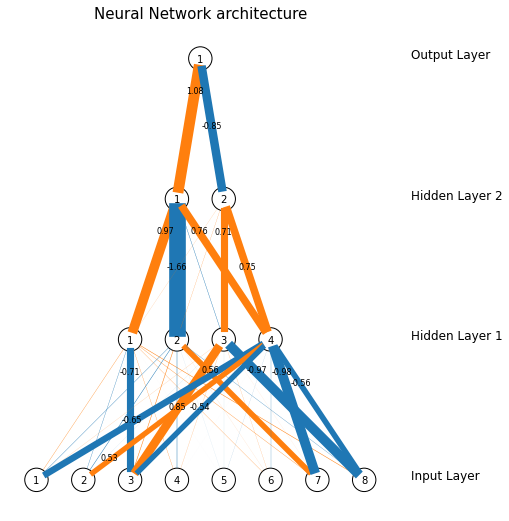

71/71 [==============================] - 0s 4ms/step - loss: 0.6226 - accuracy: 0.6434 - val_loss: 0.6380 - val_accuracy: 0.6163
Epoch 134/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6196 - accuracy: 0.6477

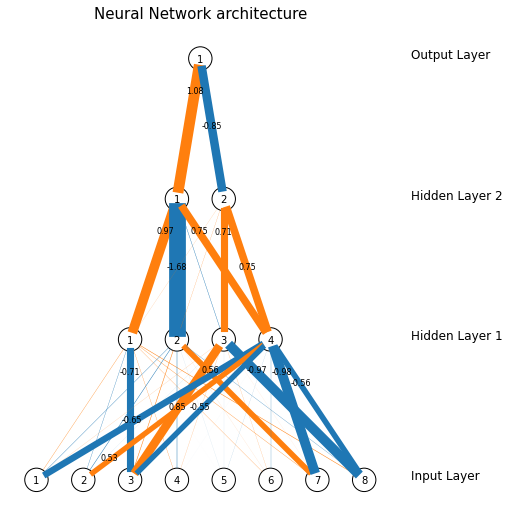

71/71 [==============================] - 0s 7ms/step - loss: 0.6224 - accuracy: 0.6443 - val_loss: 0.6382 - val_accuracy: 0.6163
Epoch 135/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6254 - accuracy: 0.6373

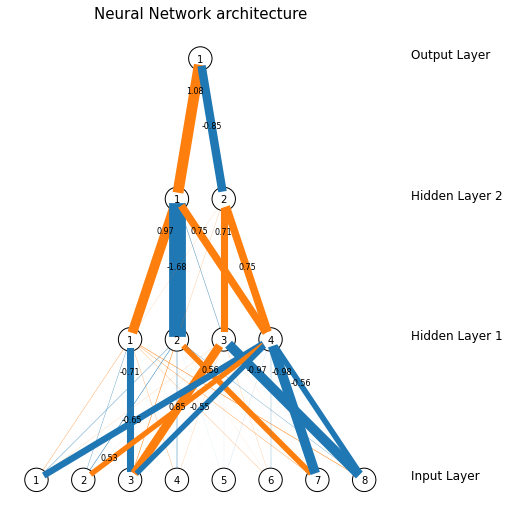

71/71 [==============================] - 0s 4ms/step - loss: 0.6225 - accuracy: 0.6434 - val_loss: 0.6381 - val_accuracy: 0.6181
Epoch 136/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6206 - accuracy: 0.6442

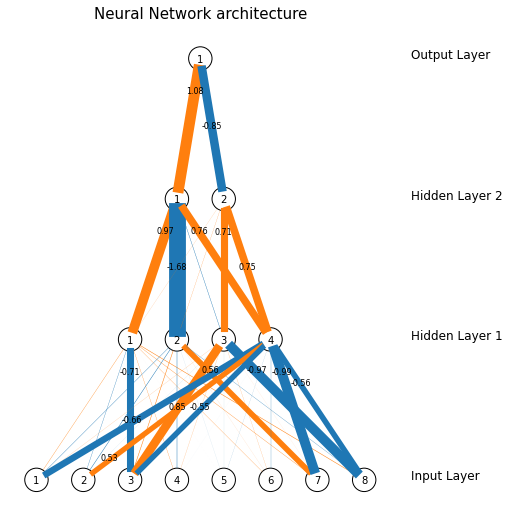

71/71 [==============================] - 0s 5ms/step - loss: 0.6225 - accuracy: 0.6470 - val_loss: 0.6382 - val_accuracy: 0.6163
Epoch 137/200
44/71 [=================>............] - ETA: 0s - loss: 0.6191 - accuracy: 0.6456

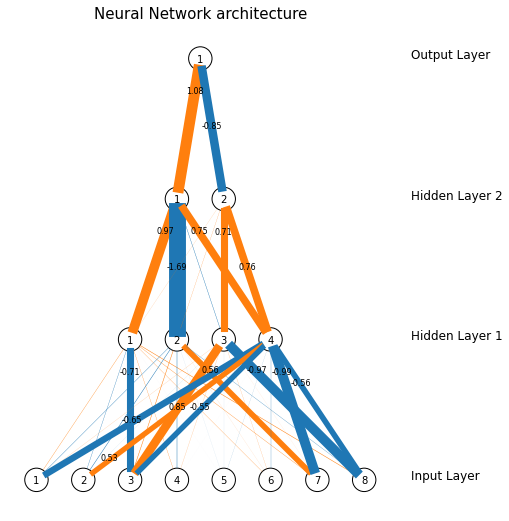

71/71 [==============================] - 0s 4ms/step - loss: 0.6225 - accuracy: 0.6434 - val_loss: 0.6380 - val_accuracy: 0.6163
Epoch 138/200
51/71 [====================>.........] - ETA: 0s - loss: 0.6255 - accuracy: 0.6440

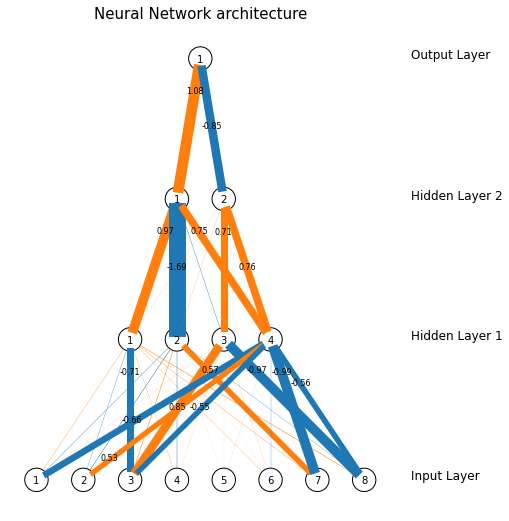

71/71 [==============================] - 0s 4ms/step - loss: 0.6224 - accuracy: 0.6434 - val_loss: 0.6382 - val_accuracy: 0.6181
Epoch 139/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6269 - accuracy: 0.6365

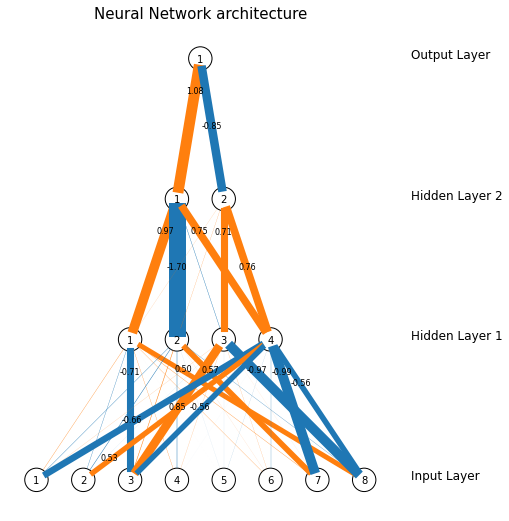

71/71 [==============================] - 0s 5ms/step - loss: 0.6223 - accuracy: 0.6438 - val_loss: 0.6383 - val_accuracy: 0.6163
Epoch 140/200
40/71 [===============>..............] - ETA: 0s - loss: 0.6193 - accuracy: 0.6453

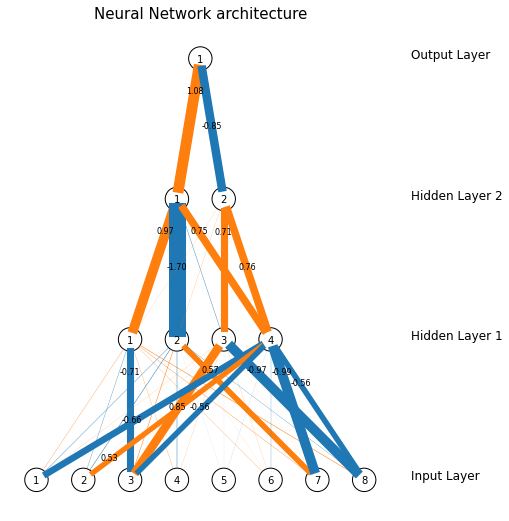

71/71 [==============================] - 0s 5ms/step - loss: 0.6224 - accuracy: 0.6421 - val_loss: 0.6382 - val_accuracy: 0.6146
Epoch 141/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6225 - accuracy: 0.6439

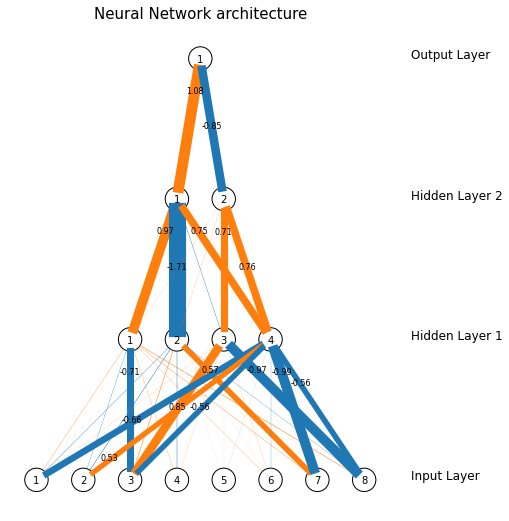

71/71 [==============================] - 0s 4ms/step - loss: 0.6224 - accuracy: 0.6465 - val_loss: 0.6387 - val_accuracy: 0.6128
Epoch 142/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6208 - accuracy: 0.6454

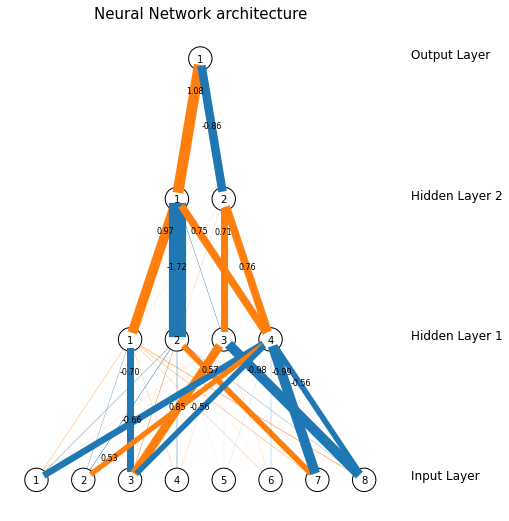

71/71 [==============================] - 0s 4ms/step - loss: 0.6223 - accuracy: 0.6447 - val_loss: 0.6389 - val_accuracy: 0.6146
Epoch 143/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6195 - accuracy: 0.6540

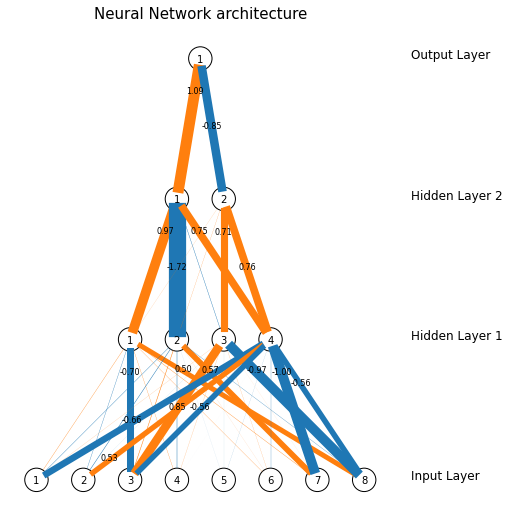

71/71 [==============================] - 0s 4ms/step - loss: 0.6224 - accuracy: 0.6438 - val_loss: 0.6388 - val_accuracy: 0.6146
Epoch 144/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6222 - accuracy: 0.6386

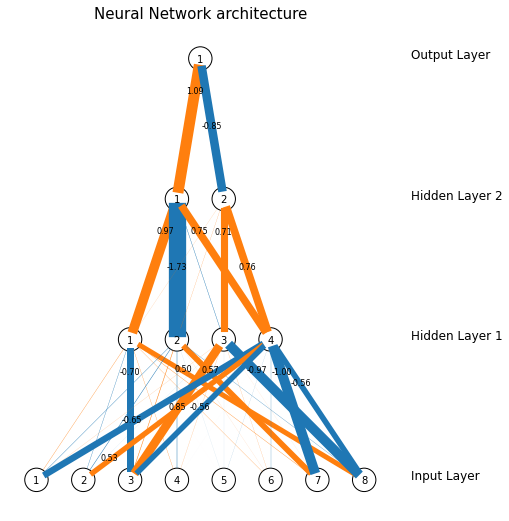

71/71 [==============================] - 0s 7ms/step - loss: 0.6224 - accuracy: 0.6443 - val_loss: 0.6388 - val_accuracy: 0.6163
Epoch 145/200
31/71 [============>.................] - ETA: 0s - loss: 0.6078 - accuracy: 0.6643

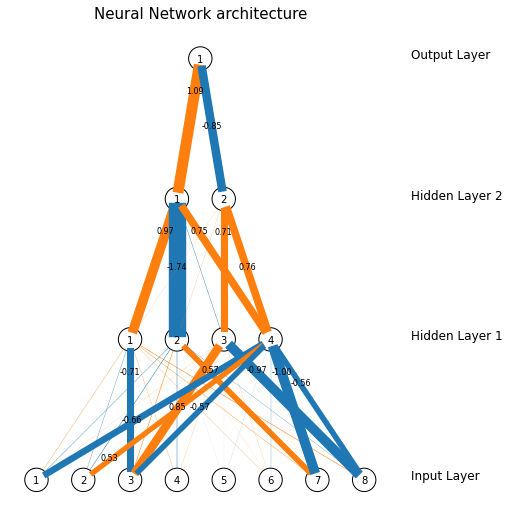

71/71 [==============================] - 0s 5ms/step - loss: 0.6223 - accuracy: 0.6456 - val_loss: 0.6387 - val_accuracy: 0.6181
Epoch 146/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6197 - accuracy: 0.6448

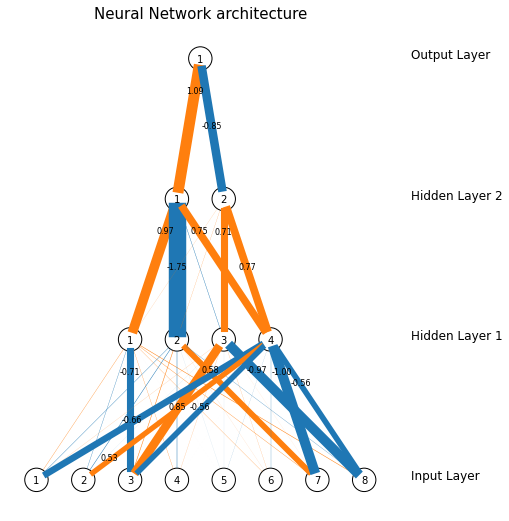

71/71 [==============================] - 0s 4ms/step - loss: 0.6223 - accuracy: 0.6461 - val_loss: 0.6387 - val_accuracy: 0.6146
Epoch 147/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6177 - accuracy: 0.6445

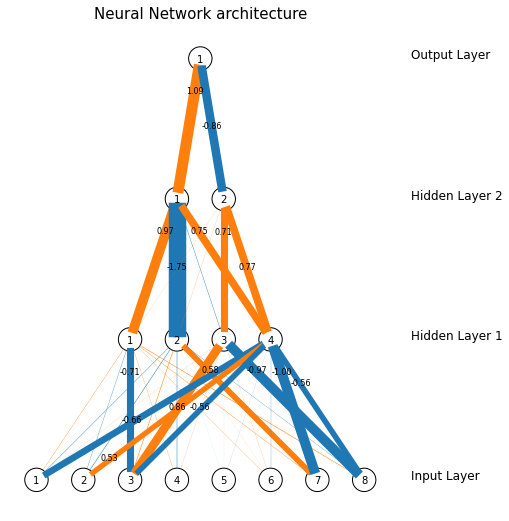

71/71 [==============================] - 0s 4ms/step - loss: 0.6226 - accuracy: 0.6430 - val_loss: 0.6383 - val_accuracy: 0.6163
Epoch 148/200
44/71 [=================>............] - ETA: 0s - loss: 0.6190 - accuracy: 0.6470

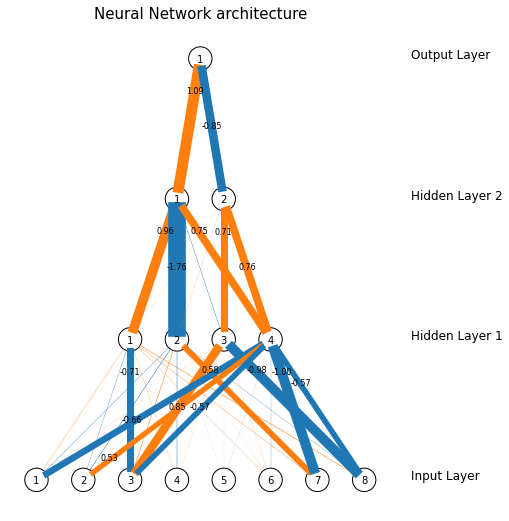

71/71 [==============================] - 0s 5ms/step - loss: 0.6224 - accuracy: 0.6434 - val_loss: 0.6391 - val_accuracy: 0.6146
Epoch 149/200
51/71 [====================>.........] - ETA: 0s - loss: 0.6274 - accuracy: 0.6434

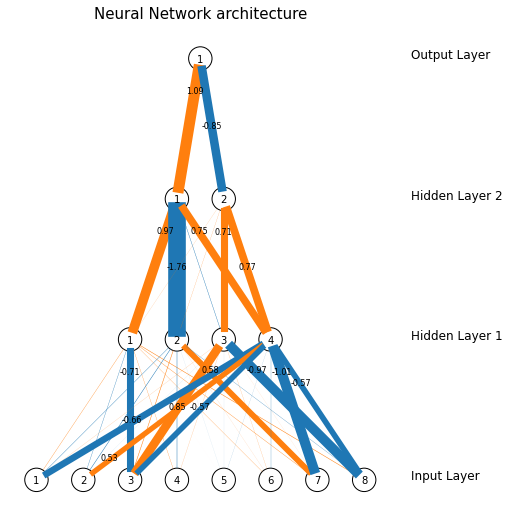

71/71 [==============================] - 0s 5ms/step - loss: 0.6223 - accuracy: 0.6452 - val_loss: 0.6390 - val_accuracy: 0.6181
Epoch 150/200
38/71 [===============>..............] - ETA: 0s - loss: 0.6163 - accuracy: 0.6554

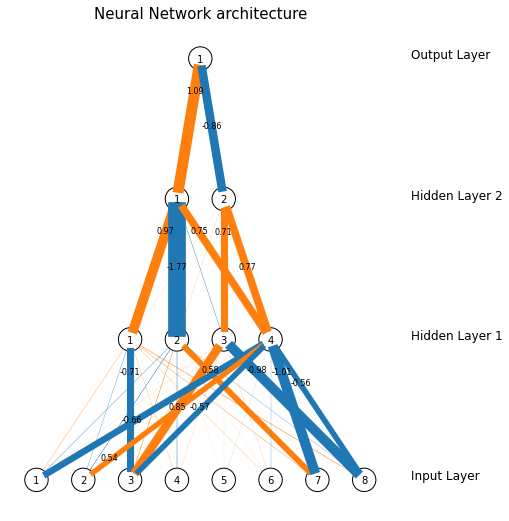

71/71 [==============================] - 0s 5ms/step - loss: 0.6224 - accuracy: 0.6412 - val_loss: 0.6389 - val_accuracy: 0.6163
Epoch 151/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6230 - accuracy: 0.6465

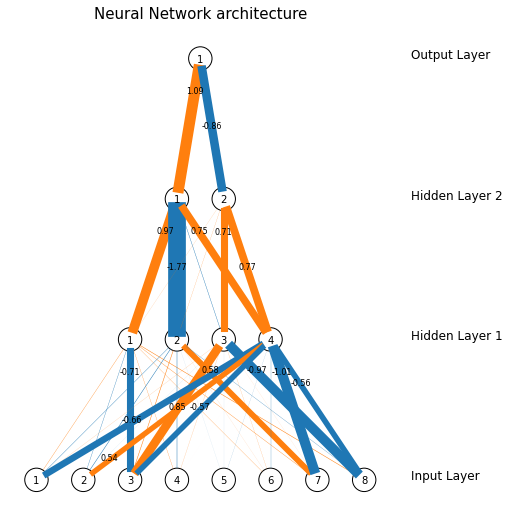

71/71 [==============================] - 0s 4ms/step - loss: 0.6222 - accuracy: 0.6447 - val_loss: 0.6386 - val_accuracy: 0.6146
Epoch 152/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6166 - accuracy: 0.6569

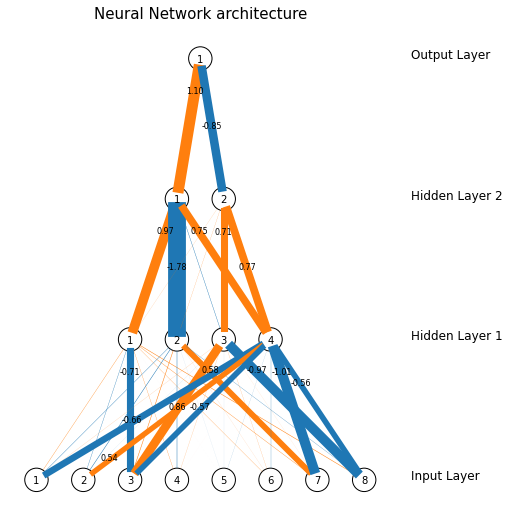

71/71 [==============================] - 0s 4ms/step - loss: 0.6224 - accuracy: 0.6434 - val_loss: 0.6381 - val_accuracy: 0.6234
Epoch 153/200
57/71 [=======================>......] - ETA: 0s - loss: 0.6263 - accuracy: 0.6327

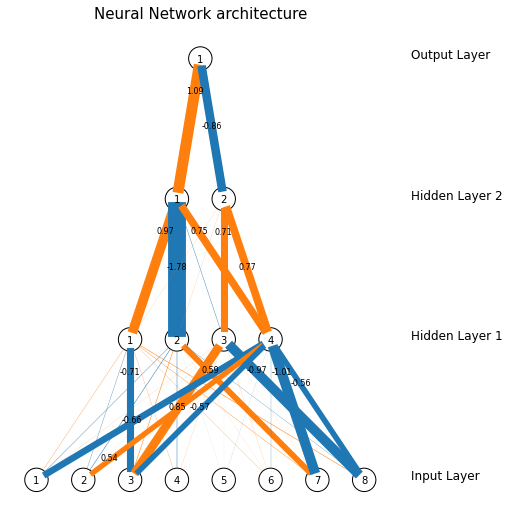

71/71 [==============================] - 0s 4ms/step - loss: 0.6224 - accuracy: 0.6438 - val_loss: 0.6385 - val_accuracy: 0.6146
Epoch 154/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6213 - accuracy: 0.6465

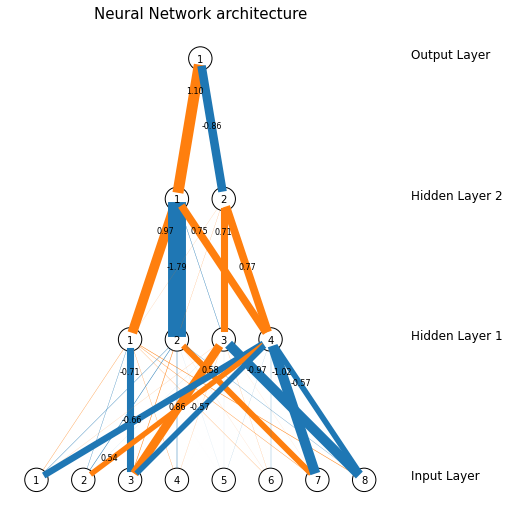

71/71 [==============================] - 1s 7ms/step - loss: 0.6223 - accuracy: 0.6434 - val_loss: 0.6389 - val_accuracy: 0.6128
Epoch 155/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6265 - accuracy: 0.6352

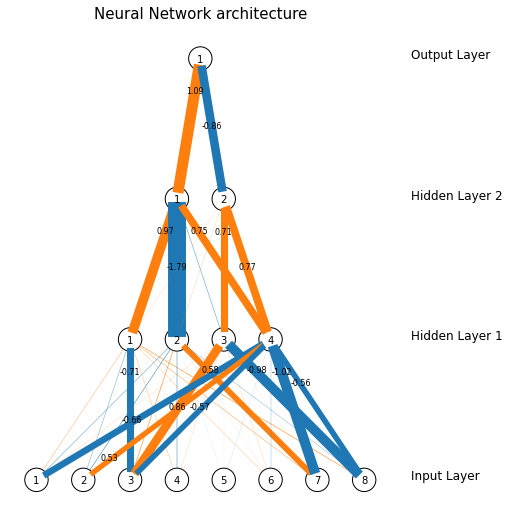

71/71 [==============================] - 0s 4ms/step - loss: 0.6222 - accuracy: 0.6412 - val_loss: 0.6389 - val_accuracy: 0.6128
Epoch 156/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6189 - accuracy: 0.6456

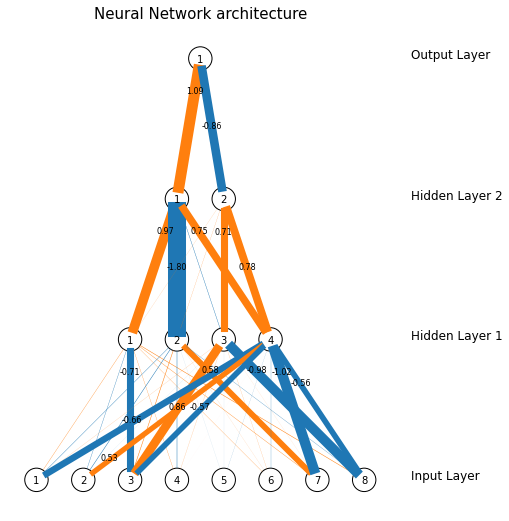

71/71 [==============================] - 0s 4ms/step - loss: 0.6225 - accuracy: 0.6430 - val_loss: 0.6388 - val_accuracy: 0.6128
Epoch 157/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6184 - accuracy: 0.6520

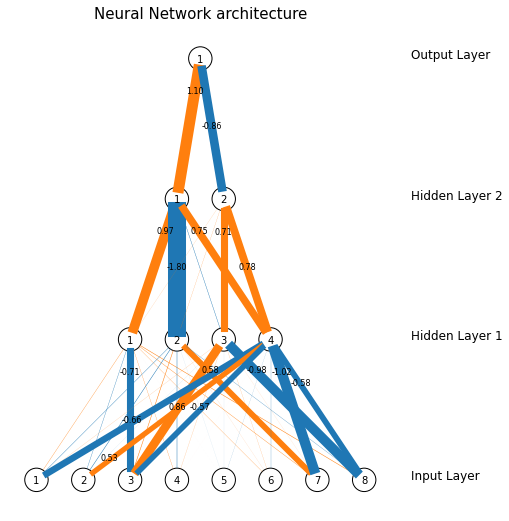

71/71 [==============================] - 0s 5ms/step - loss: 0.6223 - accuracy: 0.6443 - val_loss: 0.6391 - val_accuracy: 0.6110
Epoch 158/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6234 - accuracy: 0.6424

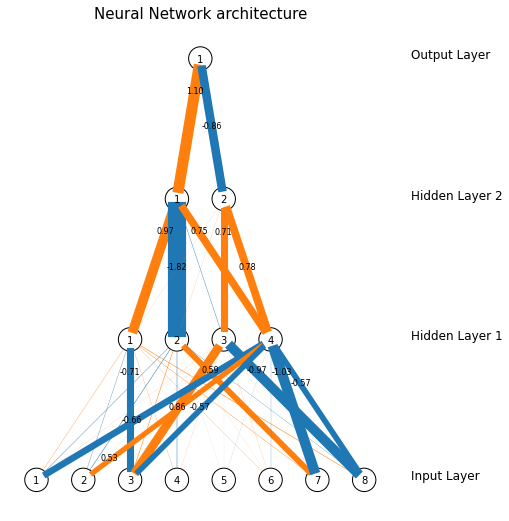

71/71 [==============================] - 0s 5ms/step - loss: 0.6222 - accuracy: 0.6443 - val_loss: 0.6389 - val_accuracy: 0.6110
Epoch 159/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6188 - accuracy: 0.6491

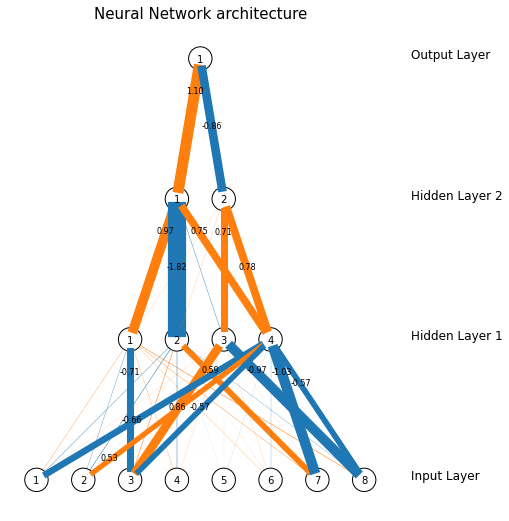

71/71 [==============================] - 0s 5ms/step - loss: 0.6221 - accuracy: 0.6403 - val_loss: 0.6389 - val_accuracy: 0.6146
Epoch 160/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6252 - accuracy: 0.6376

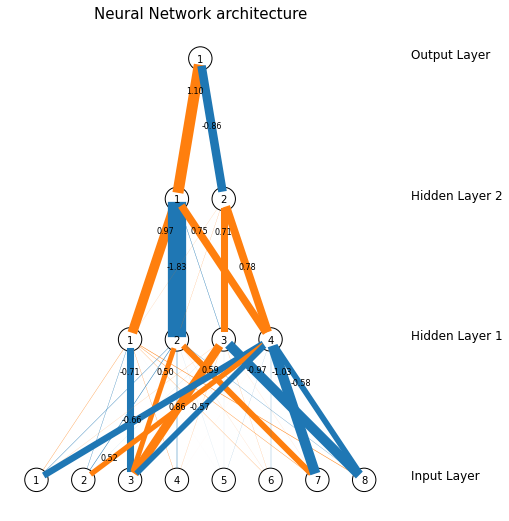

71/71 [==============================] - 0s 4ms/step - loss: 0.6223 - accuracy: 0.6456 - val_loss: 0.6390 - val_accuracy: 0.6110
Epoch 161/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6203 - accuracy: 0.6406

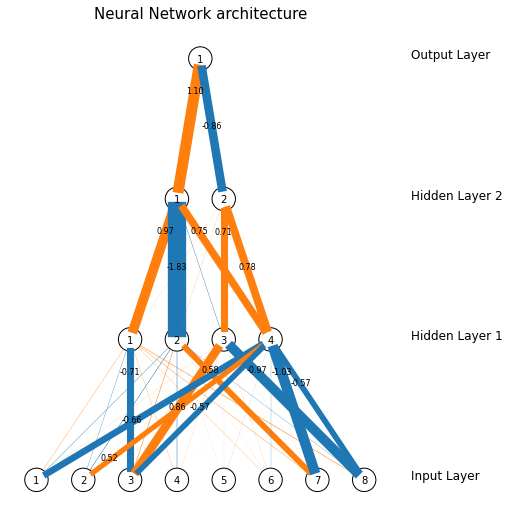

71/71 [==============================] - 0s 4ms/step - loss: 0.6221 - accuracy: 0.6456 - val_loss: 0.6389 - val_accuracy: 0.6110
Epoch 162/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6153 - accuracy: 0.6453

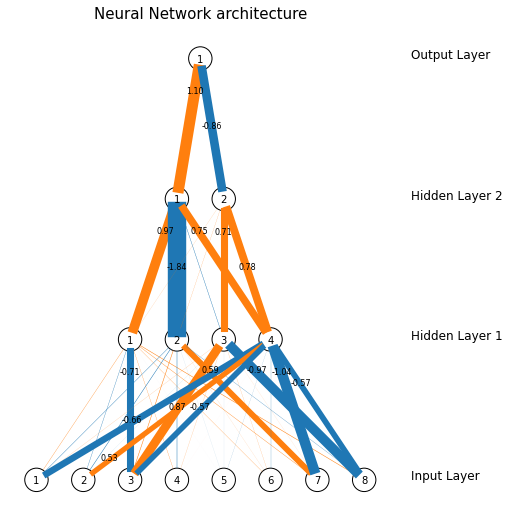

71/71 [==============================] - 0s 4ms/step - loss: 0.6222 - accuracy: 0.6434 - val_loss: 0.6391 - val_accuracy: 0.6128
Epoch 163/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6140 - accuracy: 0.6505

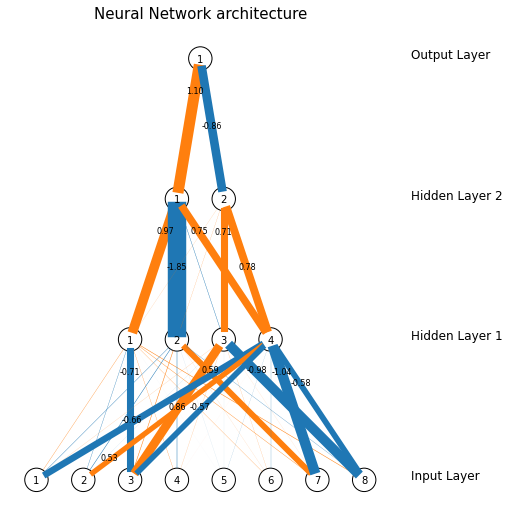

71/71 [==============================] - 0s 5ms/step - loss: 0.6224 - accuracy: 0.6443 - val_loss: 0.6391 - val_accuracy: 0.6110
Epoch 164/200
41/71 [================>.............] - ETA: 0s - loss: 0.6189 - accuracy: 0.6402

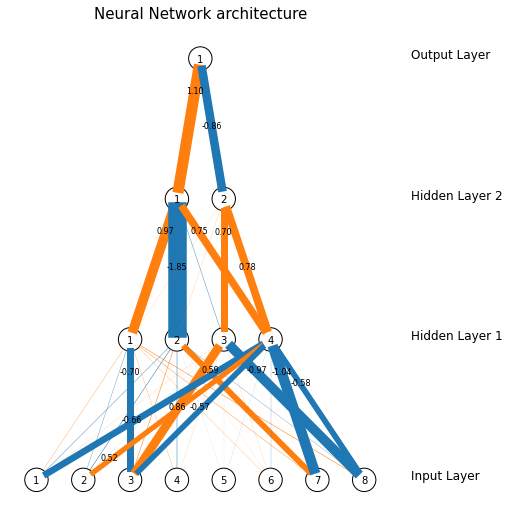

71/71 [==============================] - 1s 9ms/step - loss: 0.6220 - accuracy: 0.6438 - val_loss: 0.6392 - val_accuracy: 0.6234
Epoch 165/200
42/71 [================>.............] - ETA: 0s - loss: 0.6271 - accuracy: 0.6414

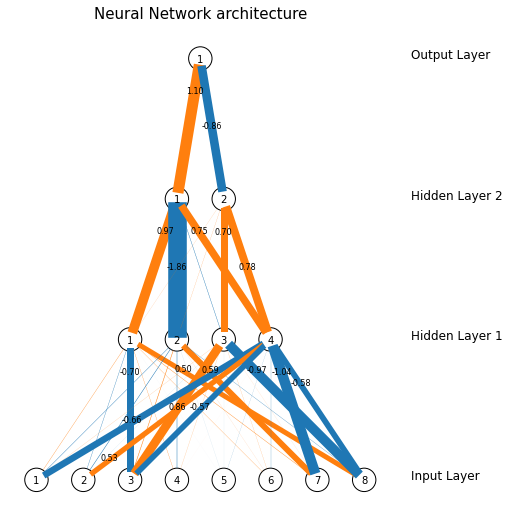

71/71 [==============================] - 0s 4ms/step - loss: 0.6219 - accuracy: 0.6452 - val_loss: 0.6392 - val_accuracy: 0.6075
Epoch 166/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6226 - accuracy: 0.6352

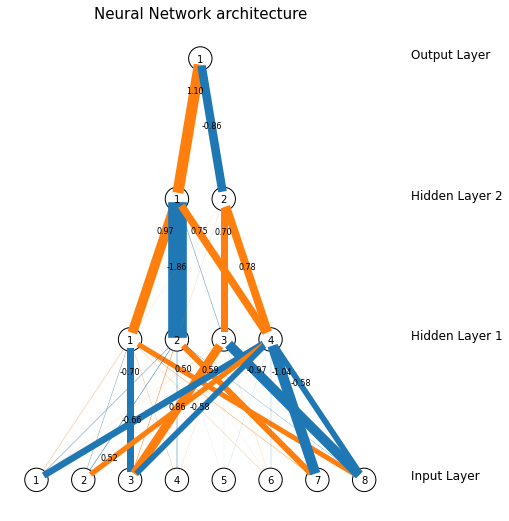

71/71 [==============================] - 0s 5ms/step - loss: 0.6222 - accuracy: 0.6421 - val_loss: 0.6394 - val_accuracy: 0.6092
Epoch 167/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6262 - accuracy: 0.6363

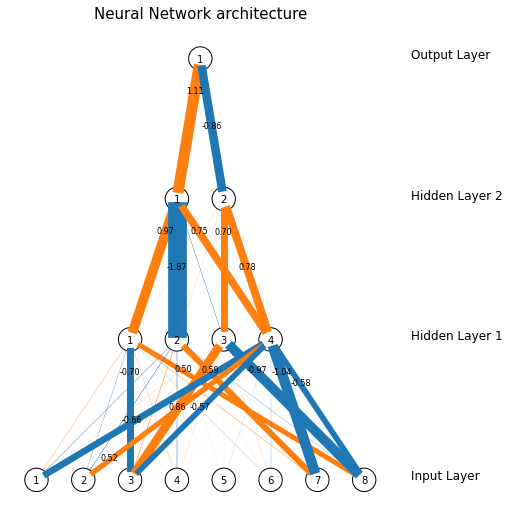

71/71 [==============================] - 0s 4ms/step - loss: 0.6222 - accuracy: 0.6434 - val_loss: 0.6394 - val_accuracy: 0.6217
Epoch 168/200
44/71 [=================>............] - ETA: 0s - loss: 0.6193 - accuracy: 0.6484

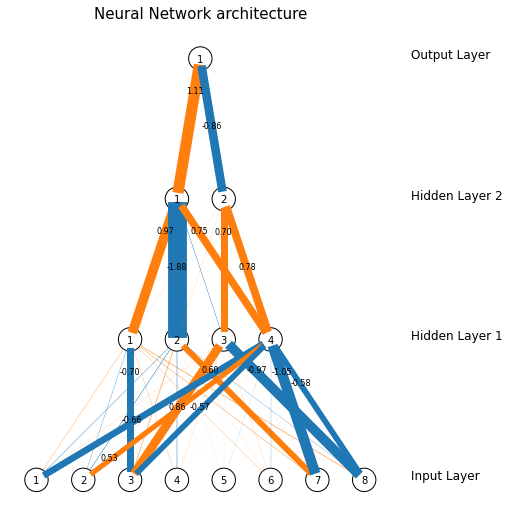

71/71 [==============================] - 0s 4ms/step - loss: 0.6222 - accuracy: 0.6416 - val_loss: 0.6395 - val_accuracy: 0.6181
Epoch 169/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6197 - accuracy: 0.6470

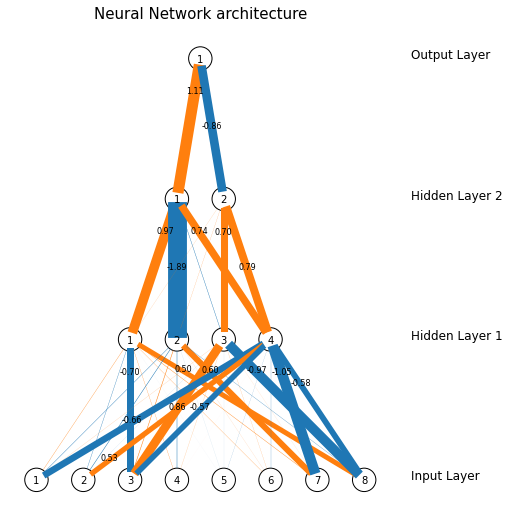

71/71 [==============================] - 0s 4ms/step - loss: 0.6222 - accuracy: 0.6412 - val_loss: 0.6396 - val_accuracy: 0.6110
Epoch 170/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6182 - accuracy: 0.6535

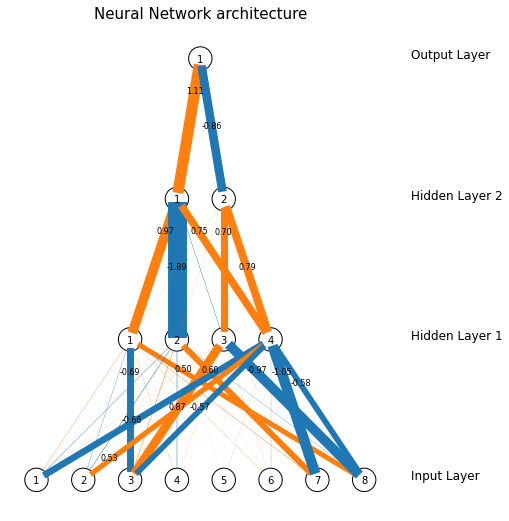

71/71 [==============================] - 0s 4ms/step - loss: 0.6225 - accuracy: 0.6465 - val_loss: 0.6400 - val_accuracy: 0.6128
Epoch 171/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6205 - accuracy: 0.6429

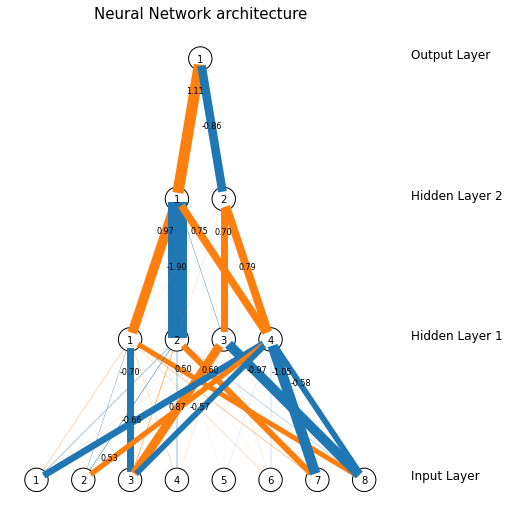

71/71 [==============================] - 0s 4ms/step - loss: 0.6219 - accuracy: 0.6434 - val_loss: 0.6399 - val_accuracy: 0.6092
Epoch 172/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6181 - accuracy: 0.6521

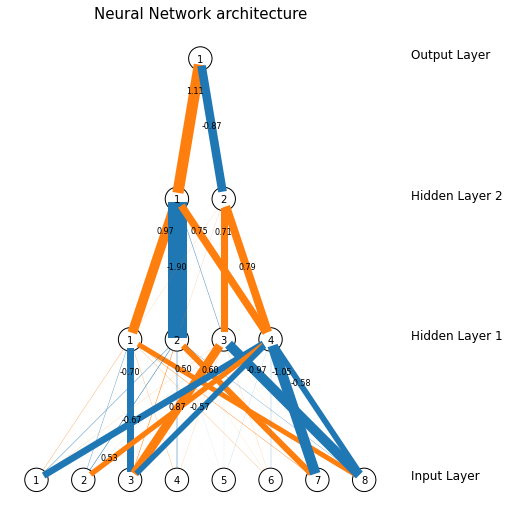

71/71 [==============================] - 0s 5ms/step - loss: 0.6219 - accuracy: 0.6456 - val_loss: 0.6402 - val_accuracy: 0.6110
Epoch 173/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6253 - accuracy: 0.6399

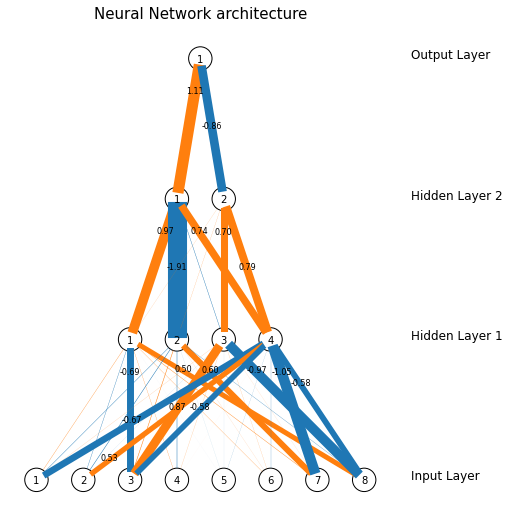

71/71 [==============================] - 0s 4ms/step - loss: 0.6218 - accuracy: 0.6412 - val_loss: 0.6401 - val_accuracy: 0.6057
Epoch 174/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6196 - accuracy: 0.6556

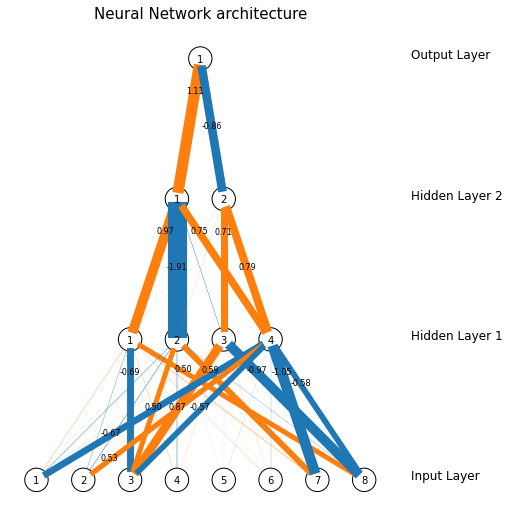

71/71 [==============================] - 1s 9ms/step - loss: 0.6221 - accuracy: 0.6447 - val_loss: 0.6403 - val_accuracy: 0.6092
Epoch 175/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6159 - accuracy: 0.6530

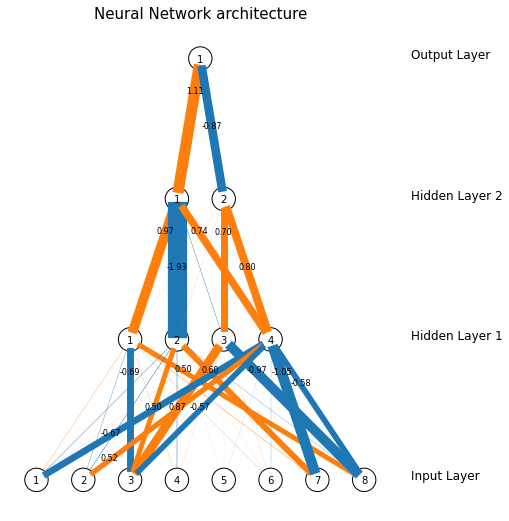

71/71 [==============================] - 0s 5ms/step - loss: 0.6219 - accuracy: 0.6447 - val_loss: 0.6403 - val_accuracy: 0.6092
Epoch 176/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6225 - accuracy: 0.6474

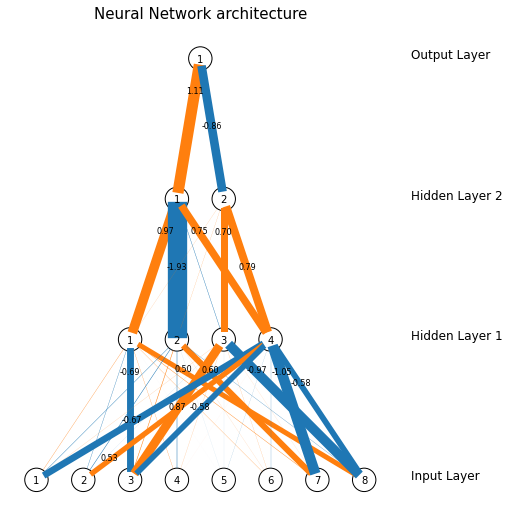

71/71 [==============================] - 0s 4ms/step - loss: 0.6220 - accuracy: 0.6487 - val_loss: 0.6401 - val_accuracy: 0.6217
Epoch 177/200
48/71 [===================>..........] - ETA: 0s - loss: 0.6144 - accuracy: 0.6536

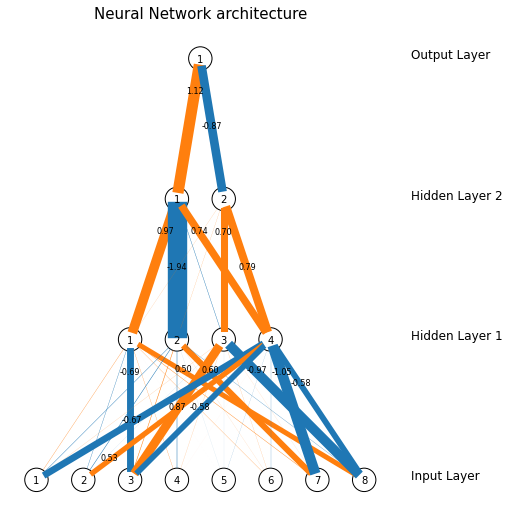

71/71 [==============================] - 0s 5ms/step - loss: 0.6218 - accuracy: 0.6425 - val_loss: 0.6406 - val_accuracy: 0.6039
Epoch 178/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6169 - accuracy: 0.6478

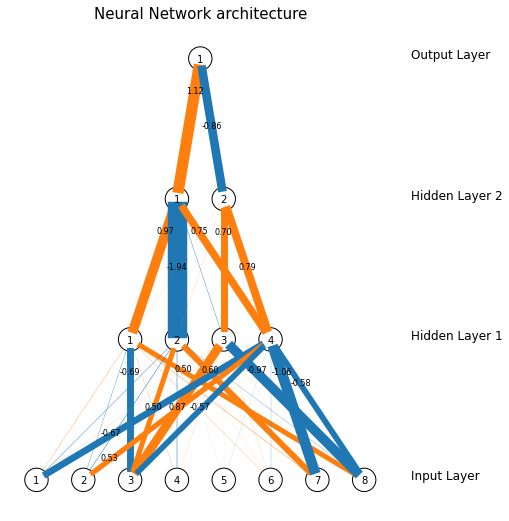

71/71 [==============================] - 0s 4ms/step - loss: 0.6219 - accuracy: 0.6438 - val_loss: 0.6401 - val_accuracy: 0.6199
Epoch 179/200
56/71 [======================>.......] - ETA: 0s - loss: 0.6179 - accuracy: 0.6473

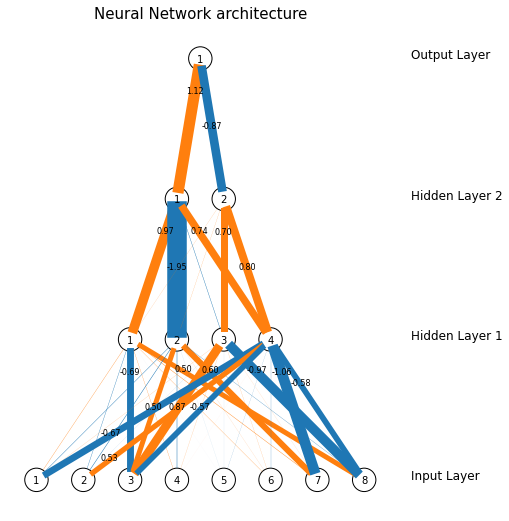

71/71 [==============================] - 0s 5ms/step - loss: 0.6220 - accuracy: 0.6452 - val_loss: 0.6403 - val_accuracy: 0.6039
Epoch 180/200
44/71 [=================>............] - ETA: 0s - loss: 0.6196 - accuracy: 0.6470

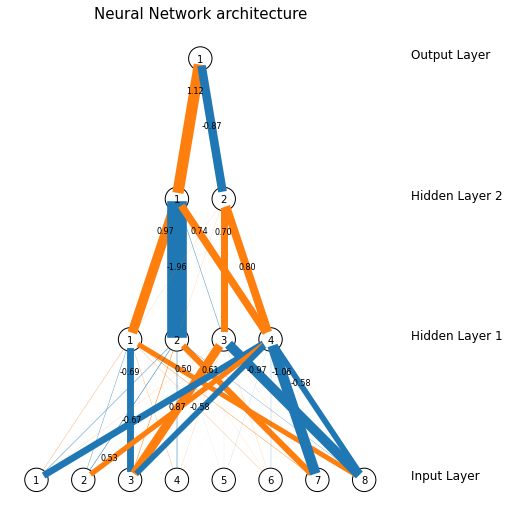

71/71 [==============================] - 0s 5ms/step - loss: 0.6217 - accuracy: 0.6430 - val_loss: 0.6401 - val_accuracy: 0.6110
Epoch 181/200
41/71 [================>.............] - ETA: 0s - loss: 0.6266 - accuracy: 0.6425

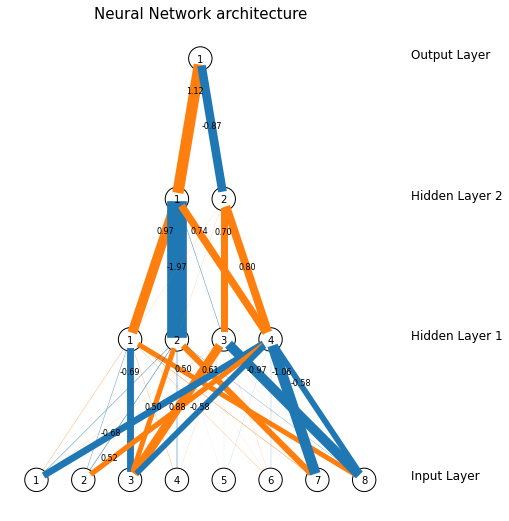

71/71 [==============================] - 0s 5ms/step - loss: 0.6216 - accuracy: 0.6470 - val_loss: 0.6402 - val_accuracy: 0.6128
Epoch 182/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6279 - accuracy: 0.6430

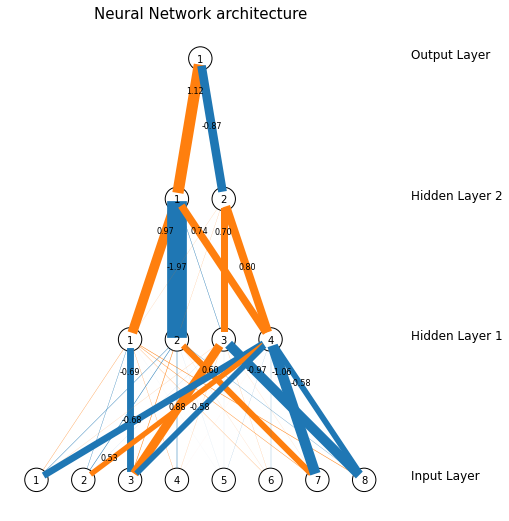

71/71 [==============================] - 0s 5ms/step - loss: 0.6218 - accuracy: 0.6452 - val_loss: 0.6403 - val_accuracy: 0.6092
Epoch 183/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6145 - accuracy: 0.6479

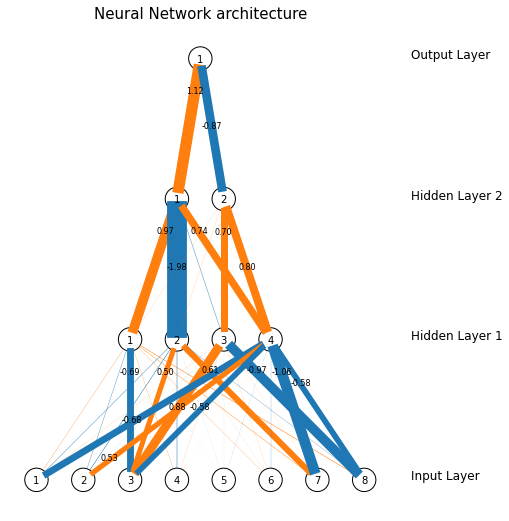

71/71 [==============================] - 0s 4ms/step - loss: 0.6218 - accuracy: 0.6430 - val_loss: 0.6402 - val_accuracy: 0.6146
Epoch 184/200
42/71 [================>.............] - ETA: 0s - loss: 0.6142 - accuracy: 0.6473

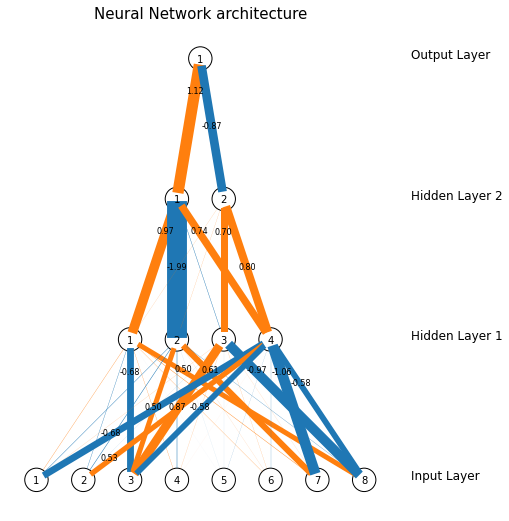

71/71 [==============================] - 1s 7ms/step - loss: 0.6219 - accuracy: 0.6438 - val_loss: 0.6406 - val_accuracy: 0.6075
Epoch 185/200
32/71 [============>.................] - ETA: 0s - loss: 0.6162 - accuracy: 0.6289

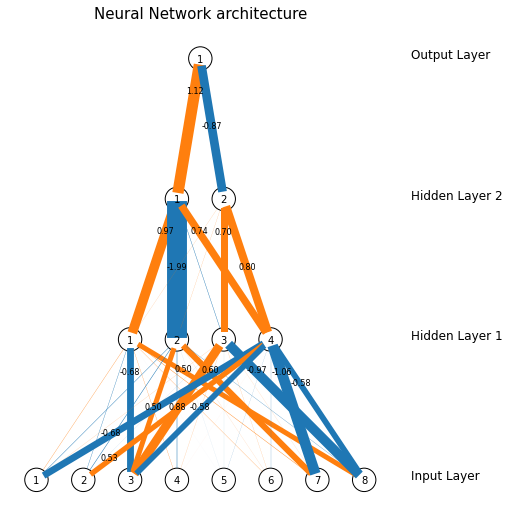

71/71 [==============================] - 0s 5ms/step - loss: 0.6216 - accuracy: 0.6474 - val_loss: 0.6407 - val_accuracy: 0.6057
Epoch 186/200
53/71 [=====================>........] - ETA: 0s - loss: 0.6209 - accuracy: 0.6445

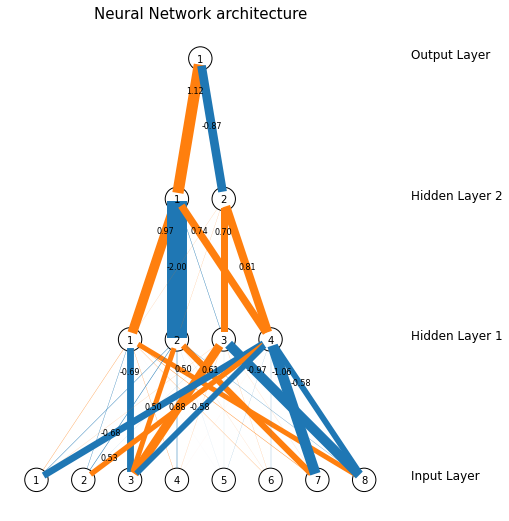

71/71 [==============================] - 0s 5ms/step - loss: 0.6217 - accuracy: 0.6443 - val_loss: 0.6407 - val_accuracy: 0.6021
Epoch 187/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6189 - accuracy: 0.6556

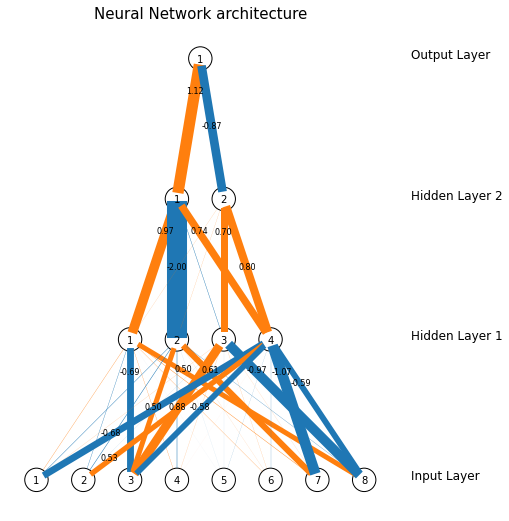

71/71 [==============================] - 0s 4ms/step - loss: 0.6217 - accuracy: 0.6447 - val_loss: 0.6405 - val_accuracy: 0.6181
Epoch 188/200
46/71 [==================>...........] - ETA: 0s - loss: 0.6196 - accuracy: 0.6535

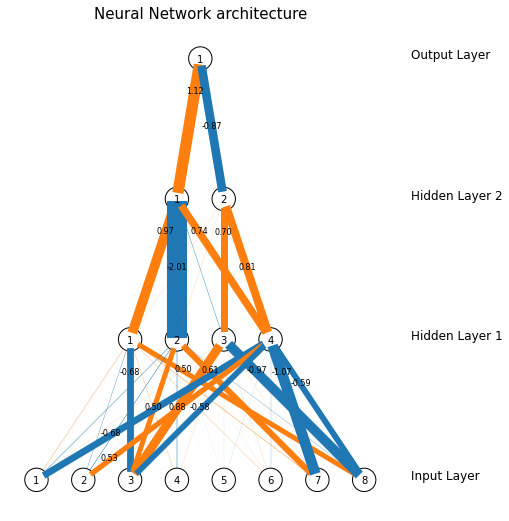

71/71 [==============================] - 0s 4ms/step - loss: 0.6219 - accuracy: 0.6470 - val_loss: 0.6408 - val_accuracy: 0.6146
Epoch 189/200
55/71 [======================>.......] - ETA: 0s - loss: 0.6225 - accuracy: 0.6432

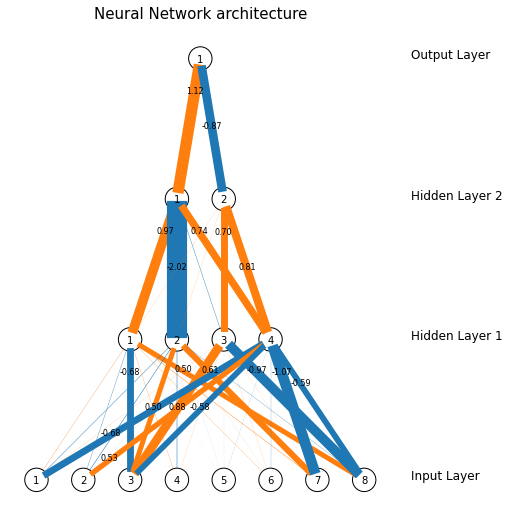

71/71 [==============================] - 0s 5ms/step - loss: 0.6216 - accuracy: 0.6430 - val_loss: 0.6407 - val_accuracy: 0.6128
Epoch 190/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6132 - accuracy: 0.6582

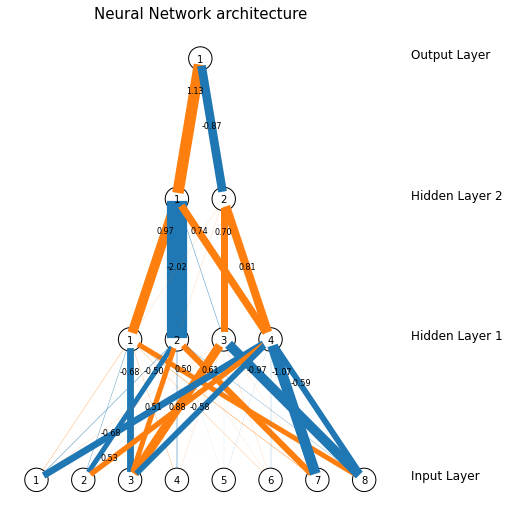

71/71 [==============================] - 0s 4ms/step - loss: 0.6217 - accuracy: 0.6443 - val_loss: 0.6406 - val_accuracy: 0.6181
Epoch 191/200
43/71 [=================>............] - ETA: 0s - loss: 0.6254 - accuracy: 0.6424

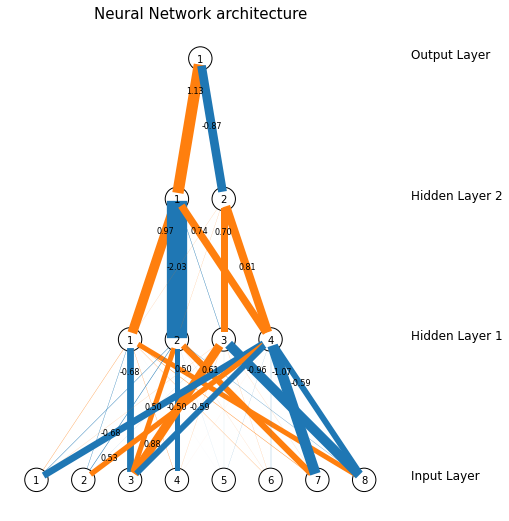

71/71 [==============================] - 0s 5ms/step - loss: 0.6217 - accuracy: 0.6461 - val_loss: 0.6407 - val_accuracy: 0.6146
Epoch 192/200
54/71 [=====================>........] - ETA: 0s - loss: 0.6280 - accuracy: 0.6400

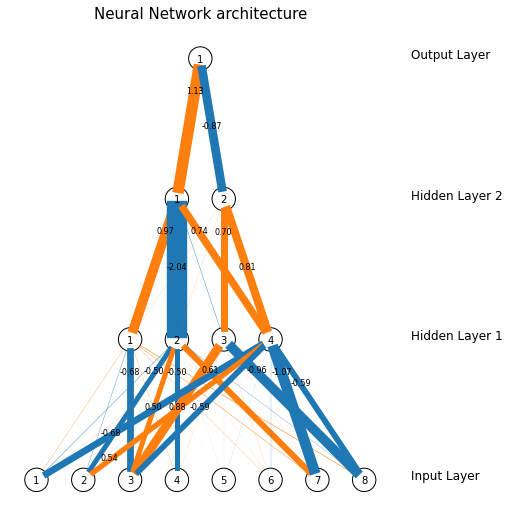

71/71 [==============================] - 0s 4ms/step - loss: 0.6214 - accuracy: 0.6492 - val_loss: 0.6406 - val_accuracy: 0.6163
Epoch 193/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6140 - accuracy: 0.6543

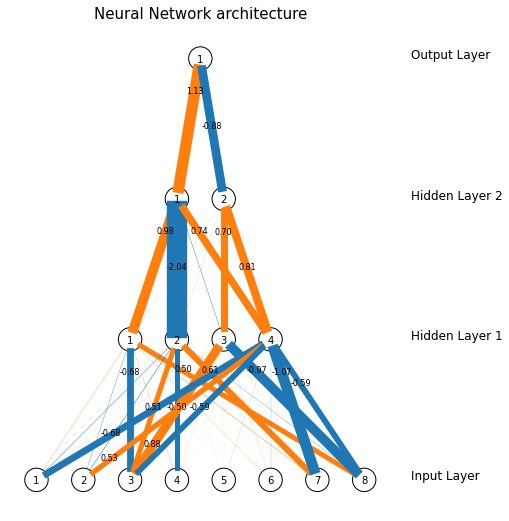

71/71 [==============================] - 0s 5ms/step - loss: 0.6215 - accuracy: 0.6447 - val_loss: 0.6405 - val_accuracy: 0.6163
Epoch 194/200
47/71 [==================>...........] - ETA: 0s - loss: 0.6230 - accuracy: 0.6503

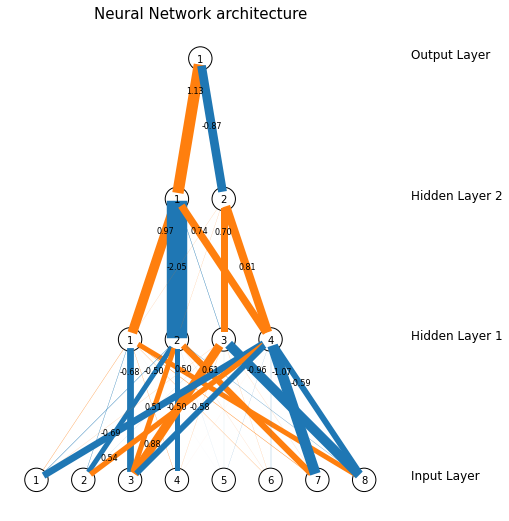

71/71 [==============================] - 0s 7ms/step - loss: 0.6215 - accuracy: 0.6452 - val_loss: 0.6407 - val_accuracy: 0.6128
Epoch 195/200
41/71 [================>.............] - ETA: 0s - loss: 0.6183 - accuracy: 0.6532

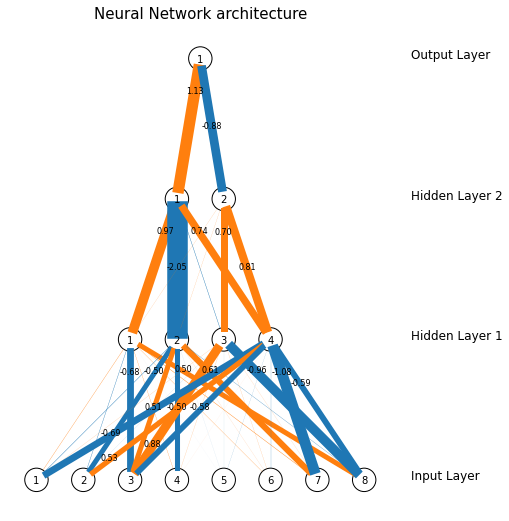

71/71 [==============================] - 0s 5ms/step - loss: 0.6215 - accuracy: 0.6474 - val_loss: 0.6407 - val_accuracy: 0.6146
Epoch 196/200
49/71 [===================>..........] - ETA: 0s - loss: 0.6262 - accuracy: 0.6339

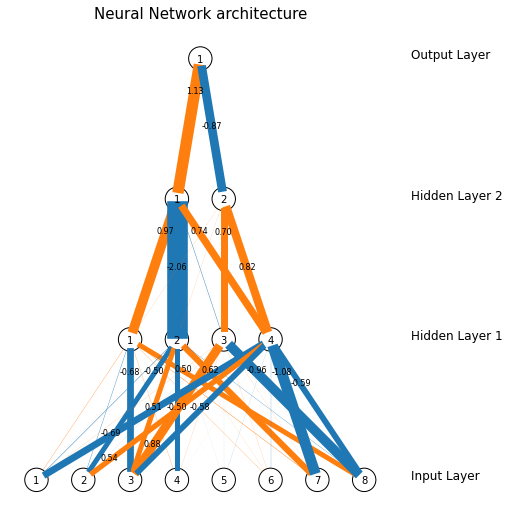

71/71 [==============================] - 0s 4ms/step - loss: 0.6214 - accuracy: 0.6461 - val_loss: 0.6409 - val_accuracy: 0.6199
Epoch 197/200
45/71 [==================>...........] - ETA: 0s - loss: 0.6193 - accuracy: 0.6514

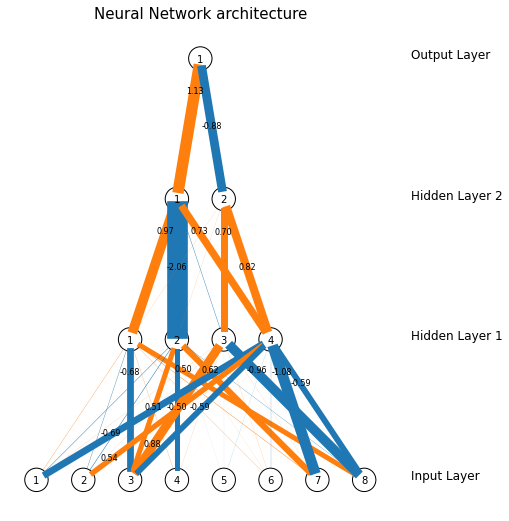

71/71 [==============================] - 0s 5ms/step - loss: 0.6217 - accuracy: 0.6465 - val_loss: 0.6411 - val_accuracy: 0.6075
Epoch 198/200
57/71 [=======================>......] - ETA: 0s - loss: 0.6190 - accuracy: 0.6469

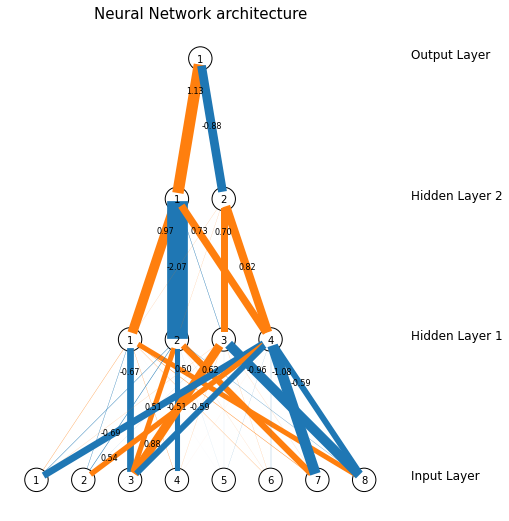

71/71 [==============================] - 0s 4ms/step - loss: 0.6216 - accuracy: 0.6421 - val_loss: 0.6413 - val_accuracy: 0.6092
Epoch 199/200
52/71 [====================>.........] - ETA: 0s - loss: 0.6237 - accuracy: 0.6406

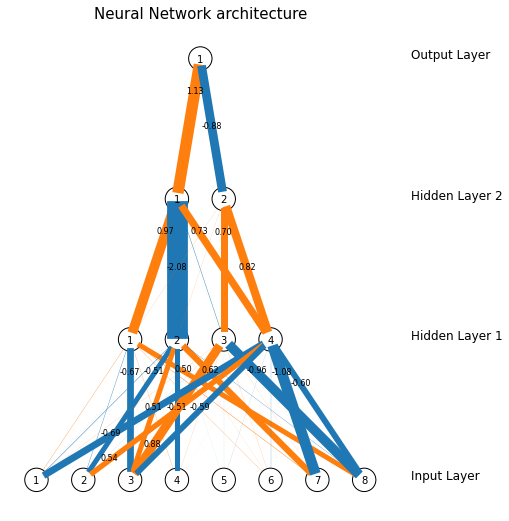

71/71 [==============================] - 0s 4ms/step - loss: 0.6216 - accuracy: 0.6443 - val_loss: 0.6416 - val_accuracy: 0.6092
Epoch 200/200
42/71 [================>.............] - ETA: 0s - loss: 0.6143 - accuracy: 0.6510

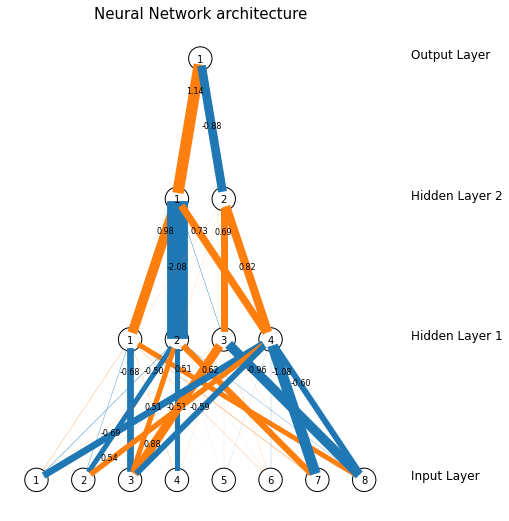

71/71 [==============================] - 0s 5ms/step - loss: 0.6216 - accuracy: 0.6430 - val_loss: 0.6412 - val_accuracy: 0.6146


In [ ]:
training = model.fit(X_train_2018,y_train_2018,epochs=200,validation_data=(X_test_2018,y_test_2018), verbose=True, callbacks=[callback])

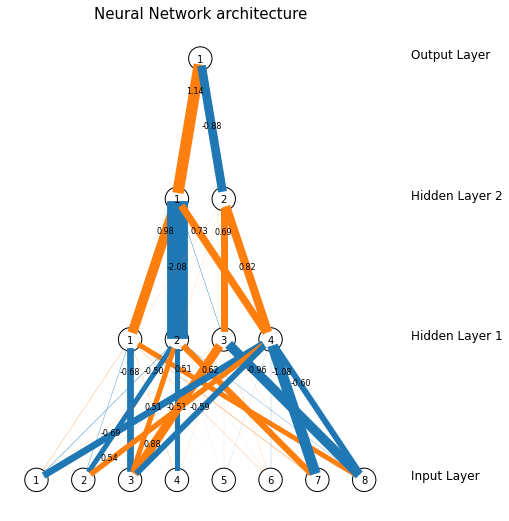

In [ ]:
network_structure = np.hstack(([X_train_2018.shape[1]], [layer.output_shape[1] for layer in model.layers]))
weights_list=[model.get_weights()[i] for i in [0,2,4]]
network = DrawNN(neural_network=network_structure, weights_list=weights_list)
network.draw(save_bool = False)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
acc_2018 = model.evaluate(X_test_2018,y_test_2018)
acc_2018

18/18 [==============================] - 0s 884us/step - loss: 0.6412 - accuracy: 0.6146


[0.6412409543991089, 0.614564836025238]

In [ ]:
predictions = model.predict(X_test_2018)

In [ ]:
y_pred_2018 = (predictions > 0.5)

In [ ]:
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test_2018, y_pred_2018)
cnf_matrix


array([[188,  92],
       [125, 158]])

Text(0.5, 257.44, 'Predicted label')

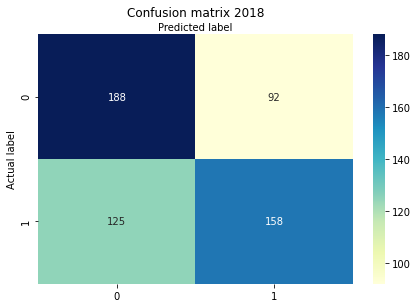

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

class_names=[1,2] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix 2018', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

**Accuracy / Precision / Recall**

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test_2018, y_pred_2018))
print("Precision:",metrics.precision_score(y_test_2018, y_pred_2018))
print("Recall:",metrics.recall_score(y_test_2018, y_pred_2018))

metric_regression_linear2018 = metrics.accuracy_score(y_test_2018, y_pred_2018)

Accuracy: 0.6145648312611013
Precision: 0.632
Recall: 0.558303886925795


#### NN 2019

In [ ]:
acc_2019 = model.evaluate(X_array_scaler_2019,y_array_2019)
acc_2019

88/88 [==============================] - 0s 1ms/step - loss: 0.6350 - accuracy: 0.6309


[0.6349780559539795, 0.6308677196502686]

In [ ]:
predictions = model.predict(X_array_scaler_2019)

In [ ]:
y_pred_2019 = (predictions > 0.5)

In [ ]:
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_array_2019, y_pred_2019)
cnf_matrix


array([[970, 430],
       [608, 804]])

Text(0.5, 257.44, 'Predicted label')

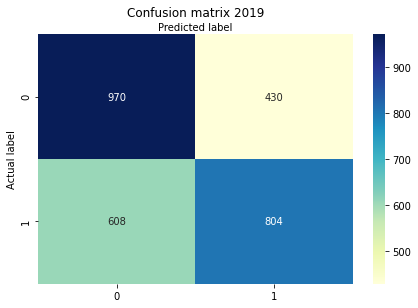

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

class_names=[1,2] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix 2019', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

**Accuracy / Precision / Recall**

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_array_2019, y_pred_2019))
print("Precision:",metrics.precision_score(y_array_2019, y_pred_2019))
print("Recall:",metrics.recall_score(y_array_2019, y_pred_2019))

metric_regression_linear2018 = metrics.accuracy_score(y_array_2019, y_pred_2019)

Accuracy: 0.6308677098150782
Precision: 0.6515397082658023
Recall: 0.5694050991501416


2. Measure and compare their performance.


In [ ]:
# Logistic Regression
print('For the Logistic Regression:')
print("The accuracy of our logistic regression model on 2018 data is: " + str(round(metric_regression_linear2018*100,1)) + " %")
print("The accuracy of our logistic regression model on 2019 data is: " + str(round(metric_regression_linear2019*100,1)) + " %")
# Neural Network
print('\nFor the Neural Natwork:')
print("The accuracy of our Neural Network model on 2018 is of: " + str(round(acc_2018[1]*100, 1)) + " %" )
print("The accuracy of our Neural Network model on 2019 is of: " + str(round(acc_2019[1]*100, 1)) + " %" )

For the Logistic Regression:
The accuracy of our logistic regression model on 2018 data is: 63.1 %
The accuracy of our logistic regression model on 2019 data is: 63.3 %

For the Neural Natwork:
The accuracy of our Neural Network model on 2018 is of: 61.5 %
The accuracy of our Neural Network model on 2019 is of: 63.1 %


• For each model, use N-fold cross-validation and compute the mean and standard
deviation of the performance measure on the N folds.
3. Analyze the most significant variables for each algorithm.
4. Analyze the types of errors the models make.
• What data would a human have used to avoid these errors?
5. Perform a quick round of feature selection and engineering.
6. Perform one or two more quick iterations of the five previous steps.
7. Shortlist the top three to five most promising models, preferring models that
make different types of errors.

#**Fine-Tune the System**
**In this part, we wanted to take in count the history of matches of the player. It leads to compute player's statistics and apply those caracteristics of each player to the id_player. We also wanted to increase the number of input parameters, identify the most influents and improve the model.
We did not have the time to finilize this part which would be really interesting to develop.**


Notes:
• You will want to use as much data as possible for this step, especially as you move
toward the end of fine-tuning
• As always, automate what you can.
1. Fine-tune the hyperparameters using cross-validation:
• Treat your data transformation choices as hyperparameters, especially when
you are not sure about them (e.g., if you’re not sure whether to replace missing
values with zeros or with the median value, or to just drop the rows).
• Unless there are very few hyperparameter values to explore, prefer random
search over grid search. If training is very long, you may prefer a Bayesian
optimization approach (e.g., using Gaussian process priors, as described by
Jasper Snoek et al.).1
2. Try Ensemble methods. Combining your best models will often produce better performance than running them individually.
3. Once you are confident about your final model, measure its performance on the
test set to estimate the generalization error.
Remark : Don’t tweak your model after measuring the generalization error:
you would just start overfitting the test set.

In [ ]:
def perfect_clean_data(df):
  df = df.drop(columns=['loser_height','winner_height'])
  df = df.dropna(axis='index',how='any')
  
  # winner
  df['winner_hand_nb'] = df['winner_hand'].apply(lambda x : 1 if x == 'R' else 2 if x =='L' else 3)
  df['w_ace_mean'] = df.groupby('winner_id')['w_ace'].transform('mean')
  df['w_double_faults_mean'] = df.groupby('winner_id')['w_double_faults'].transform('mean')
  df['w_ace_mean'] = df.groupby('winner_id')['w_breakpoints_saved'].transform('mean')
  df['w_ace_mean'] = df.groupby('winner_id')['w_breakpoints_faced'].transform('mean')


  #loser
  df['loser_hand_nb'] = df['loser_hand'].apply(lambda x : 1 if x == 'R' else 2 if x =='L' else 3)
  df['l_ace_mean'] = df.groupby('loser_id')['l_ace'].transform('mean')
  df['l_double_faults_mean'] = df.groupby('loser_id')['l_double_faults'].transform('mean')
  df['l_ace_mean'] = df.groupby('loser_id')['l_breakpoints_saved'].transform('mean')
  df['l_ace_mean'] = df.groupby('loser_id')['l_breakpoints_faced'].transform('mean')


  #indep
  df['surface_nb'] = df['surface'].apply(lambda x : 1 if x == 'Hard' else 2 if x == 'Clay' else 3)
  
  return df

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np

In [ ]:
df_input_random_2018 = df_input_random(perfect_clean_data(df_2018))
x_array = np.asarray(df_input_random_2018.loc[:, df_input_random_2018.columns != 'winner']).astype('float64')
y_array = np.asarray(df_input_random_2018['winner']).astype('float64')
X_train_full, X_test, y_train_full, y_test = train_test_split(x_array, y_array, test_size=0.2, random_state=42)

In [ ]:
scaler = StandardScaler()

In [ ]:
X_train , X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full) 

In [ ]:
X_train = scaler.fit_transform(X_train)

In [ ]:
X_valid = scaler.fit_transform(X_valid)

In [ ]:
X_test = scaler.fit_transform(X_test)

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
model  = keras.models.Sequential()

In [ ]:
round(X_train.shape[1]/2)

4

In [ ]:
model = keras.models.Sequential(
    [keras.layers.Dense(round(X_train.shape[1]/2), activation="relu",input_shape=X_train.shape[1:]),
     keras.layers.Dense(round(X_train.shape[1]/4),activation="relu"),
     keras.layers.Dense(1,activation="sigmoid")]
)

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 4)                 36        
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 10        
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 3         
Total params: 49
Trainable params: 49
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.layers
hidden1=model.layers[1]

In [ ]:
hidden1.get_weights() 
# before trainint

[array([[-0.9663336 , -0.64651513],
        [-0.33021784, -0.6893959 ],
        [-0.870548  , -0.01224303],
        [ 0.66178226, -0.89450526]], dtype=float32),
 array([0., 0.], dtype=float32)]

In [ ]:
model.compile(
    loss="binary_crossentropy",
    optimizer=keras.optimizers.Adam(1e-3),
    metrics=["accuracy"]
)

In [ ]:
training = model.fit(X_train,y_train,epochs=200,validation_data=(X_test,y_test), verbose=False)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

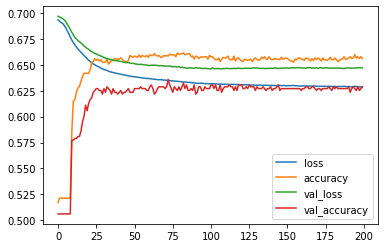

In [ ]:
pd.DataFrame(training.history).plot()

In [ ]:
model.evaluate(X_test,y_test)

18/18 [==============================] - 0s 944us/step - loss: 0.6469 - accuracy: 0.6288


[0.646859884262085, 0.6287744045257568]

In [ ]:
df_input_random_2019 = df_input_random(perfect_clean_data(df_2019))
x_array = np.asarray(df_input_random_2019.loc[:, df_input_random_2019.columns != 'winner']).astype('float64')
y_array = np.asarray(df_input_random_2019['winner']).astype('float64')
scaler = StandardScaler()
X_array = scaler.fit_transform(x_array)

print(model.evaluate(X_array,y_array))

88/88 [==============================] - 0s 808us/step - loss: 0.6498 - accuracy: 0.6373
[0.6497793793678284, 0.6372688412666321]


Present Your Solution
1. Document what you have done.
2. Create a nice presentation.
• Make sure you highlight the big picture first.
3. Explain why your solution achieves the business objective.
4. Don’t forget to present interesting points you noticed along the way.
• Describe what worked and what did not.
• List your assumptions and your system’s limitations.
5. Ensure your key findings are communicated through beautiful visualizations or
easy-to-remember statements (e.g., “the median income is the number-one predictor
of housing prices”).

Launch!
1. Get your solution ready for production (plug into production data inputs, write
unit tests, etc.).
2. Write monitoring code to check your system’s live performance at regular intervals
and trigger alerts when it drops.
• Beware of slow degradation: models tend to “rot” as data evolves.
• Measuring performance may require a human pipeline (e.g., via a crowdsourcing
service).
• Also monitor your inputs’ quality (e.g., a malfunctioning sensor sending random
values, or another team’s output becoming stale). This is particularly
important for online learning systems.
3. Retrain your models on a regular basis on fresh data (automate as much as
possible).